<a href="https://colab.research.google.com/github/ahmedengu/feature_importance/blob/master/Indices/USA500/USA500_1H_High.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
from IPython.display import clear_output
import pandas as pd

if pd.__version__ != '0.25.0' or False:
  # install
  !apt-get install default-jre build-essential swig
  !pip  install h2o==3.24.0.5 yfinance==0.1.43
  !pip  install git+https://github.com/ahmedengu/findatapy.git pandas==0.25.0
  clear_output(wait=True)

  !wget http://prdownloads.sourceforge.net/ta-lib/ta-lib-0.4.0-src.tar.gz
  !tar -xzvf ta-lib-0.4.0-src.tar.gz
  %cd ta-lib
  !./configure --prefix=/usr
  clear_output(wait=True)
  !make
  clear_output(wait=True)
  !make install
  clear_output(wait=True)
  !pip install Ta-Lib==0.4.17
  clear_output(wait=True)
  print('RESTARTING')
  %cd /content
  
  # force restart
  import os
  os.kill(os.getpid(), 9)

In [0]:
# Experiment Config
import pandas as pd
from IPython.display import display
from IPython.core.debugger import set_trace

data_ticker = "USA500IDXUSD"
data_resample = '1H'
data_label = 'High'
data_label_name = 'y'
start_date = '1 Jan 2018'
finish_date = '1 Jan 2019'
is_duka = True
is_yahoo = False
kaggle_file = 'bitstamp' # default None
kaggle_folder = '1 Day/Stocks'

models_summary = {}
for metric in ['accuracy','F1','auc','logloss','mean_per_class_error','rmse','mse']:
  models_summary.update({metric:pd.DataFrame()})

# feature elimination config
model_selected_features = 50
PCA_k = 50
HCF_threshold = 0.90
LVF_threshold = 0.1
GLRM_k = 20
select_k = 50
select_percentile = 10
select_alpha = 0.1
select_rfe = 50

features_to_include = ['All', 'DLF', 'XGBF', 'RFE', 'Fwe'] # True for all , ['All','Fwe','RFE','Percentile','KBest','LVF','HCF','PCA','XGBF','GLMF','DLF','GLRM'] 
is_EDA = True
max_models_num = 10

# pandas options
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [0]:
# random seed
from numpy.random import seed
seed(1)
from tensorflow import set_random_seed
set_random_seed(1)
import pandas as pd
import gc
import os

resample_how= {'Open': 'first', 'High': 'max', 'Low': 'min', 'Close': 'last',
                             'Volume': 'sum', 'Date': 'first'}

if is_duka:
  from findatapy.util import DataConstants

  DataConstants.market_thread_no.update({'dukascopy': 64})

  # Download dataset
  from findatapy.market import Market, MarketDataRequest, MarketDataGenerator

  market = Market(market_data_generator=MarketDataGenerator(log_every_day=30))

  md_request = MarketDataRequest(start_date=start_date, finish_date=finish_date,
                                       fields=['temp', 'ask', 'bid', 'askv', 'bidv'], vendor_fields=['temp', 'ask', 'bid', 'askv', 'bidv'],
                                       freq='tick', data_source='dukascopy',
                                       tickers=[data_ticker], vendor_tickers=[data_ticker])

  temp_dataset = market.fetch_market(md_request)
  full_dataset = pd.DataFrame(temp_dataset[data_ticker + '.bid'].resample(data_resample).ohlc())
  full_dataset.columns = ['Open', 'High', 'Low', 'Close']
  temp_dataset = pd.DataFrame(temp_dataset[data_ticker + '.bidv'].resample(data_resample).sum())
  temp_dataset.columns = ['Volume']
  full_dataset['Volume'] = temp_dataset['Volume']

  del temp_dataset, md_request, market, DataConstants, Market, MarketDataRequest, MarketDataGenerator

  gc.collect()

elif is_yahoo:
  import yfinance as yf
  from datetime import datetime

  full_dataset = yf.download(data_ticker, start=str(datetime.strptime(start_date, '%d %b %Y')).split(' ')[0], end=str(datetime.strptime(finish_date, '%d %b %Y')).split(' ')[0])
  full_dataset['Date']=full_dataset.index
  del yf,datetime

elif data_ticker == 'EURUSD':
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2014.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2015.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2016.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2017.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2018.zip
  !unzip -qq -o \*.zip
  full_dataset = pd.read_csv('DAT_ASCII_EURUSD_M1_2014.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';')
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2015.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2016.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2017.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2018.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset['Date'] = pd.to_datetime(full_dataset['Date'])
  full_dataset.index = full_dataset['Date']
  full_dataset = full_dataset.dropna()
  full_dataset = full_dataset.sort_index()
  full_dataset = full_dataset.resample(data_resample, how=resample_how).dropna()
  full_dataset = full_dataset[full_dataset.index > start_date]
  full_dataset = full_dataset[full_dataset.index < finish_date]


    
elif data_ticker == 'APPLUSUSD':
  full_dataset=pd.read_csv('https://github.com/kyleconroy/apple-stock/raw/master/apple_stock_data.csv',index_col =0,parse_dates =[0])

  full_dataset = full_dataset.astype(float)
  full_dataset['Date']=full_dataset.index
  full_dataset = full_dataset[full_dataset.index > '2007-04-01']


elif data_ticker == 'COMI':
  full_dataset=pd.read_csv('https://static.mubasher.info/File.MubasherCharts/File.Historical_Stock_Charts_Dir/44507230b2b03e2da37352abf1a659545b44.csv',index_col =0,names =['Open', 'High', 'Low', 'Close','Volume'],parse_dates =[0])

  full_dataset = full_dataset.astype(float)
  full_dataset['Volume'] = full_dataset['Volume'] * full_dataset['Close'] 
  full_dataset = full_dataset.drop_duplicates()
  full_dataset['Date']=full_dataset.index
  full_dataset = full_dataset[full_dataset.index > start_date]
  full_dataset = full_dataset[full_dataset.index < finish_date]
  
elif kaggle_file is not None:
  if not os.path.isfile('kaggle.json'):
    from google.colab import files
    files.upload()
    
    import time
    time.sleep(10)
    !ls
    !mkdir -p ~/.kaggle
    !cp kaggle.json ~/.kaggle/
    !ls ~/.kaggle

    !chmod 600 /root/.kaggle/kaggle.json
    del files
    
  !kaggle datasets download $data_ticker
  !unzip -qq -o \*.zip
  !unzip -qq -o \*.zip

  if data_ticker == 'mczielinski/bitcoin-historical-data':
    
    full_dataset = pd.read_csv([file for file in os.listdir() if kaggle_file in file][0])
    full_dataset.columns= ['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Volume_(Currency)','Weighted_Price']
    full_dataset.index=pd.to_datetime(full_dataset['Date'], unit='s')

    resample_how.update({'Volume_(Currency)': 'sum', 'Weighted_Price': 'last'})

    full_dataset = full_dataset.resample(data_resample, how=resample_how).dropna()[1:-1]
    full_dataset = full_dataset[full_dataset.index > start_date]
    full_dataset = full_dataset[full_dataset.index < finish_date]
  
  elif data_ticker == 'borismarjanovic/daily-and-intraday-stock-price-data':
    
    full_dataset = pd.read_csv(kaggle_folder + '/' + [file for file in os.listdir(kaggle_folder) if kaggle_file in file][0])
    if 'Time' in full_dataset.columns:
      full_dataset['Date'] = pd.to_datetime(full_dataset['Date'] + ' ' + full_dataset['Time'])
      full_dataset = full_dataset.drop('Time',axis=1)
    full_dataset.columns= ['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'OpenInt']
    full_dataset.index=pd.to_datetime(full_dataset['Date'])

    full_dataset = full_dataset[full_dataset.index > start_date]
    full_dataset = full_dataset[full_dataset.index < finish_date]

  
gc.collect()
full_dataset = full_dataset.dropna()

full_dataset = full_dataset.drop('Date',axis=1, errors='ignore')
full_dataset = full_dataset.sort_index()
full_dataset = full_dataset[-100000:]
display(full_dataset)
display(full_dataset.describe())
full_dataset.to_pickle('full_dataset')
del full_dataset, set_random_seed, seed
gc.collect()

2019-08-25 11:13:02,386 - findatapy.market.datavendorweb - INFO - Request Dukascopy data
2019-08-25 11:13:02,387 - findatapy.market.datavendorweb - INFO - About to download from Dukascopy... for USA500IDXUSD
2019-08-25 11:17:11,664 - findatapy.market.datavendorweb - INFO - Downloading... 2018-01-30 00:00:00
2019-08-25 11:25:22,673 - findatapy.market.datavendorweb - INFO - Downloading... 2018-03-30 00:00:00
2019-08-25 11:29:42,738 - findatapy.market.datavendorweb - INFO - Downloading... 2018-04-30 00:00:00
2019-08-25 11:33:41,452 - findatapy.market.datavendorweb - INFO - Downloading... 2018-05-30 00:00:00
2019-08-25 11:37:56,696 - findatapy.market.datavendorweb - INFO - Downloading... 2018-06-30 00:00:00
2019-08-25 11:42:12,910 - findatapy.market.datavendorweb - INFO - Downloading... 2018-07-30 00:00:00
2019-08-25 11:46:38,704 - findatapy.market.datavendorweb - INFO - Downloading... 2018-08-30 00:00:00
2019-08-25 11:51:06,425 - findatapy.market.datavendorweb - INFO - Downloading... 2018

/usr/local/lib/python3.6/dist-packages/findatapy/market/ioengine.py:264: FutureWarning: to_msgpack is deprecated and will be removed in a future version.
It is recommended to use pyarrow for on-the-wire transmission of pandas objects.
  r.set(fname, data_frame.to_msgpack(compress='blosc'))


2019-08-25 12:05:20,001 - findatapy.market.ioengine - WARNING - Couldn't push MarketDataRequest_454__abstract_curve_key-None__category-None__category_key-backtest_default-cat_dukascopy_tick_NYC_USA500IDXUSD__cut-NYC__data_source-dukascopy__environment-backtest__expiry_date-NaT__fields-temp_ask_bid_askv_bidv__finish_date-2019-01-01 00:00:00__freq-tick__freq_mult-1__gran_freq-None__resample-None__resample_how-last__start_date-2018-01-01 00:00:00__tickers-USA500IDXUSD__trade_side-trade__vendor_fields-temp_ask_bid_askv_bidv__vendor_tickers-USA500IDXUSD to Redis: Error 111 connecting to 127.0.0.1:6379. Connection refused.


,Open,High,Low,Close,Volume
Date,,,,,
2018-01-02 07:00:00,26.793489,26.799700,26.790991,26.795990,0.482150
2018-01-02 08:00:00,26.794701,26.794701,26.765989,26.775890,1.874790
2018-01-02 09:00:00,26.774700,26.775900,26.745890,26.753389,1.232290
2018-01-02 10:00:00,26.753389,26.783701,26.750891,26.781691,1.117820
2018-01-02 11:00:00,26.783400,26.811701,26.781691,26.808701,0.715780
2018-01-02 12:00:00,26.810890,26.838699,26.808689,26.833691,0.514960
2018-01-02 13:00:00,26.833691,26.851700,26.826691,26.838690,0.267120
2018-01-02 14:00:00,26.841690,26.873690,26.812700,26.867701,1.548980
2018-01-02 15:00:00,26.868500,26.917700,26.867689,26.898390,5.143630


,Open,High,Low,Close,Volume
count,5234.000000,5234.000000,5234.000000,5234.000000,5234.000000
mean,27.507627,27.541725,27.469843,27.506889,3.026215
std,1.007903,0.994919,1.022745,1.008467,4.612226
min,23.264690,23.352699,23.147690,23.264700,0.000500
25%,26.897943,26.933701,26.853689,26.898468,0.716093
50%,27.437696,27.472495,27.403700,27.436695,1.563450
75%,28.174697,28.200448,28.146700,28.174193,3.497392
max,29.388700,29.408701,29.370689,29.388700,110.271423


25

In [0]:
# OHLC EDA
if is_EDA:
  import pandas_profiling as pp
  display(pp.ProfileReport(pd.read_pickle('full_dataset')))
  del pp

/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/converter.py:102: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/pandas_profiling/describe.py:392: FutureWarning: The join_axes-keyword is deprecated. Use .reindex or .reindex_like on the result to achieve the same functionality.
  variable_stats = pd.concat(ldesc, join_axes=pd.Index([names]), axis=1)


Number of variables,6
Number of observations,5234
Total Missing (%),0.0%
Total size in memory,143.2 KiB
Average record size in memory,28.0 B
Numeric,2
Categorical,0
Boolean,0
Date,1
Text (Unique),0
Rejected,3


In [0]:
# features
from talib._ta_lib import *
import talib
import numpy as np
import uuid
import os


features_dataset = pd.read_pickle('full_dataset').sort_index()


periods = np.resize([2, 3, 3, 2], len(features_dataset['Close'])).astype(float)
timeperiods = [8, 12, 14, 20, 24, 30]
matypes = range(9)
nbdevs = [2, 3, 4, 5]

# date features
features_dataset['day'] = features_dataset.index.day
features_dataset['dayofweek'] = features_dataset.index.dayofweek
features_dataset['dayofyear'] = features_dataset.index.dayofyear
features_dataset['days_in_month'] = features_dataset.index.days_in_month
features_dataset['hour'] = features_dataset.index.hour
features_dataset['is_month_end'] = pd.factorize(features_dataset.index.is_month_end)[0]
features_dataset['is_month_start'] = pd.factorize(features_dataset.index.is_month_start)[0]
features_dataset['is_quarter_end'] = pd.factorize(features_dataset.index.is_quarter_end)[0]
features_dataset['is_quarter_start'] = pd.factorize(features_dataset.index.is_quarter_start)[0]
features_dataset['minute'] = features_dataset.index.minute
features_dataset['month'] = features_dataset.index.month
features_dataset['quarter'] = features_dataset.index.quarter
features_dataset['second'] = features_dataset.index.second
features_dataset['week'] = features_dataset.index.week
features_dataset['weekday'] = features_dataset.index.weekday
features_dataset['weekday_name'] = pd.factorize(features_dataset.index.weekday_name)[0]
features_dataset['weekofyear'] = features_dataset.index.weekofyear

# Overlap Studies
features_dataset['HT_TRENDLINE'] = HT_TRENDLINE(features_dataset['Close'])
features_dataset['mama'], features_dataset['fama'] = MAMA(features_dataset['Close'])
features_dataset['SAREXT'] = SAREXT(features_dataset['High'], features_dataset['Low'], startvalue=-4e37,
                                    offsetonreverse=-4e37, accelerationinitlong=-4e37,
                                    accelerationlong=-4e37, accelerationmaxlong=-4e37, accelerationinitshort=-4e37,
                                    accelerationshort=-4e37, accelerationmaxshort=-4e37)

for timeperiod in timeperiods:
    features_dataset['DEMA_' + str(timeperiod)] = DEMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['EMA_' + str(timeperiod)] = EMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['KAMA_' + str(timeperiod)] = KAMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MIDPOINT_' + str(timeperiod)] = MIDPOINT(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MIDPRICE_' + str(timeperiod)] = MIDPRICE(features_dataset['High'], features_dataset['Low'],
                                                               timeperiod=timeperiod)
    features_dataset['SAR_' + str(timeperiod / 100)] = SAR(features_dataset['High'], features_dataset['Low'],
                                                           acceleration=timeperiod / 100,
                                                           maximum=timeperiod / 100)
    features_dataset['SMA_' + str(timeperiod)] = SMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['TEMA_' + str(timeperiod)] = TEMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['TRIMA_' + str(timeperiod)] = TRIMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['WMA_' + str(timeperiod)] = WMA(features_dataset['Close'], timeperiod=timeperiod)

    for matype in matypes:
        features_dataset['MA_' + str(timeperiod) + '_' + str(matype)] = MA(features_dataset['Close'],
                                                                           timeperiod=timeperiod, matype=matype)
        features_dataset['MAVP_' + str(timeperiod) + '_' + str(matype)] = MAVP(features_dataset['Close'], periods,
                                                                               minperiod=2,
                                                                               maxperiod=timeperiod, matype=matype)
        features_dataset['T3_' + str(timeperiod) + '_' + str(matype)] = T3(features_dataset['Close'],
                                                                           timeperiod=timeperiod,
                                                                           vfactor=matype / 10)

        for nbdev in nbdevs:
            features_dataset['BBANDS_upperband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)], \
            features_dataset['BBANDS_middleband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)], \
            features_dataset['BBANDS_lowerband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)] = BBANDS(
                features_dataset['Close'], timeperiod=timeperiod, nbdevup=nbdev, nbdevdn=nbdev, matype=matype)

            
gc.collect()
# Momentum Indicators
features_dataset['BOP'] = BOP(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                              features_dataset['Close'])

for timeperiod in timeperiods:
    features_dataset['ADX_' + str(timeperiod)] = ADX(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ADXR_' + str(timeperiod)] = ADXR(features_dataset['High'], features_dataset['Low'],
                                                       features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['aroondown_' + str(timeperiod)], features_dataset['aroonup_' + str(timeperiod)] = AROON(
        features_dataset['High'],
        features_dataset['Low'],
        timeperiod=timeperiod)
    features_dataset['AROONOSC_' + str(timeperiod)] = AROONOSC(features_dataset['High'], features_dataset['Low'],
                                                               timeperiod=timeperiod)
    features_dataset['CCI_' + str(timeperiod)] = CCI(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['CMO_' + str(timeperiod)] = CMO(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['DX_' + str(timeperiod)] = DX(features_dataset['High'], features_dataset['Low'],
                                                   features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MACDFIX_' + str(timeperiod)], features_dataset['MACDFIX_signal_' + str(timeperiod)], features_dataset[
        'MACDFIX_hist_' + str(timeperiod)] = MACDFIX(features_dataset['Close'], signalperiod=timeperiod)
    features_dataset['MFI_' + str(timeperiod)] = MFI(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], features_dataset['Volume'],
                                                     timeperiod=timeperiod)
    features_dataset['MINUS_DI_' + str(timeperiod)] = MINUS_DI(features_dataset['High'], features_dataset['Low'],
                                                               features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MINUS_DM_' + str(timeperiod)] = MINUS_DM(features_dataset['High'], features_dataset['Low'],
                                                               timeperiod=timeperiod)
    features_dataset['MOM_' + str(timeperiod)] = MOM(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['PLUS_DI_' + str(timeperiod)] = PLUS_DI(features_dataset['High'], features_dataset['Low'],
                                                             features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['PLUS_DM_' + str(timeperiod)] = PLUS_DM(features_dataset['High'], features_dataset['Low'],
                                                             timeperiod=timeperiod)
    features_dataset['ROC_' + str(timeperiod)] = ROC(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ROCP_' + str(timeperiod)] = ROCP(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ROCR_' + str(timeperiod)] = ROCR(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ROCR100_' + str(timeperiod)] = ROCR100(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['RSI_' + str(timeperiod)] = RSI(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['TRIX_' + str(timeperiod)] = TRIX(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['WILLR_' + str(timeperiod)] = WILLR(features_dataset['High'], features_dataset['Low'],
                                                         features_dataset['Close'], timeperiod=timeperiod)

    
gc.collect()
features_dataset['APO'] = APO(features_dataset['Close'], fastperiod=12, slowperiod=26, matype=0)

features_dataset['MACD'], features_dataset['MACD_signal'], features_dataset['MACD_hist'] = MACD(
    features_dataset['Close'], fastperiod=12,
    slowperiod=26,
    signalperiod=9)
features_dataset['MACDEXT'], features_dataset['MACDEXT_signal'], features_dataset['MACDEXT_hist'] = MACDEXT(
    features_dataset['Close'],
    fastperiod=12,
    fastmatype=0,
    slowperiod=26,
    slowmatype=0,
    signalperiod=9,
    signalmatype=0)

features_dataset['PPO'] = PPO(features_dataset['Close'], fastperiod=12, slowperiod=26, matype=0)

features_dataset['STOCH_slowk'], features_dataset['STOCH_slowd'] = STOCH(features_dataset['High'],
                                                                         features_dataset['Low'],
                                                                         features_dataset['Close'], fastk_period=5,
                                                                         slowk_period=3, slowk_matype=0,
                                                                         slowd_period=3, slowd_matype=0)
features_dataset['STOCHF_fastk'], features_dataset['STOCHF_fastd'] = STOCHF(features_dataset['High'],
                                                                            features_dataset['Low'],
                                                                            features_dataset['Close'], fastk_period=5,
                                                                            fastd_period=3, fastd_matype=0)
features_dataset['STOCHRSI_fastk'], features_dataset['STOCHRSI_fastd'] = STOCHRSI(features_dataset['Close'],
                                                                                  timeperiod=14,
                                                                                  fastk_period=5, fastd_period=3,
                                                                                  fastd_matype=0)
features_dataset['ULTOSC'] = ULTOSC(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                                    timeperiod1=7, timeperiod2=14, timeperiod3=28)

# Volume Indicators
features_dataset['AD'] = AD(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                            features_dataset['Volume'])
features_dataset['ADOSC'] = ADOSC(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                                  features_dataset['Volume'], fastperiod=3, slowperiod=10)
features_dataset['OBV'] = OBV(features_dataset['Close'], features_dataset['Volume'])

gc.collect()
# Volatility Indicators
for timeperiod in timeperiods:
    features_dataset['ATR_' + str(timeperiod)] = ATR(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['NATR_' + str(timeperiod)] = NATR(features_dataset['High'], features_dataset['Low'],
                                                       features_dataset['Close'], timeperiod=timeperiod)

features_dataset['TRANGE'] = TRANGE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])

# Price Transform
features_dataset['AVGPRICE'] = AVGPRICE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                        features_dataset['Close'])
features_dataset['MEDPRICE'] = MEDPRICE(features_dataset['High'], features_dataset['Low'])
features_dataset['TYPPRICE'] = TYPPRICE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])
features_dataset['WCLPRICE'] = WCLPRICE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])

gc.collect()
# Cycle Indicators
features_dataset['HT_DCPERIOD'] = HT_DCPERIOD(features_dataset['Close'])
features_dataset['HT_DCPHASE'] = HT_DCPHASE(features_dataset['Close'])
features_dataset['HT_PHASOR_inphase'], features_dataset['HT_PHASOR_quadrature'] = HT_PHASOR(features_dataset['Close'])
features_dataset['HT_SINE_sine'], features_dataset['HT_SINE_leadsine'] = HT_SINE(features_dataset['Close'])
features_dataset['HT_TRENDMODE'] = HT_TRENDMODE(features_dataset['Close'])

# Pattern Recognition
features_dataset['CDL2CROWS'] = CDL2CROWS(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDL3BLACKCROWS'] = CDL3BLACKCROWS(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3INSIDE'] = CDL3INSIDE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
features_dataset['CDL3LINESTRIKE'] = CDL3LINESTRIKE(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3OUTSIDE'] = CDL3OUTSIDE(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3STARSINSOUTH'] = CDL3STARSINSOUTH(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3WHITESOLDIERS'] = CDL3WHITESOLDIERS(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLABANDONEDBABY'] = CDLABANDONEDBABY(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'],
                                                        penetration=0)
features_dataset['CDLADVANCEBLOCK'] = CDLADVANCEBLOCK(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLBELTHOLD'] = CDLBELTHOLD(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLBREAKAWAY'] = CDLBREAKAWAY(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLCLOSINGMARUBOZU'] = CDLCLOSINGMARUBOZU(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLCONCEALBABYSWALL'] = CDLCONCEALBABYSWALL(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLCOUNTERATTACK'] = CDLCOUNTERATTACK(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLDARKCLOUDCOVER'] = CDLDARKCLOUDCOVER(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'],
                                                          penetration=0)
features_dataset['CDLDOJI'] = CDLDOJI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                      features_dataset['Close'])
features_dataset['CDLDOJISTAR'] = CDLDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLDRAGONFLYDOJI'] = CDLDRAGONFLYDOJI(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLENGULFING'] = CDLENGULFING(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLEVENINGDOJISTAR'] = CDLEVENINGDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'],
                                                            penetration=0)
features_dataset['CDLEVENINGSTAR'] = CDLEVENINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'], penetration=0)
features_dataset['CDLGAPSIDESIDEWHITE'] = CDLGAPSIDESIDEWHITE(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLGRAVESTONEDOJI'] = CDLGRAVESTONEDOJI(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHAMMER'] = CDLHAMMER(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLHANGINGMAN'] = CDLHANGINGMAN(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHARAMI'] = CDLHARAMI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLHARAMICROSS'] = CDLHARAMICROSS(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHIGHWAVE'] = CDLHIGHWAVE(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHIKKAKE'] = CDLHIKKAKE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
features_dataset['CDLHIKKAKEMOD'] = CDLHIKKAKEMOD(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHOMINGPIGEON'] = CDLHOMINGPIGEON(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLIDENTICAL3CROWS'] = CDLIDENTICAL3CROWS(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLINNECK'] = CDLINNECK(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLINVERTEDHAMMER'] = CDLINVERTEDHAMMER(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLKICKING'] = CDLKICKING(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
features_dataset['CDLKICKINGBYLENGTH'] = CDLKICKINGBYLENGTH(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLLADDERBOTTOM'] = CDLLADDERBOTTOM(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLLONGLEGGEDDOJI'] = CDLLONGLEGGEDDOJI(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLLONGLINE'] = CDLLONGLINE(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLMARUBOZU'] = CDLMARUBOZU(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLMATCHINGLOW'] = CDLMATCHINGLOW(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLMATHOLD'] = CDLMATHOLD(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'], penetration=0)
features_dataset['CDLMORNINGDOJISTAR'] = CDLMORNINGDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'],
                                                            penetration=0)
features_dataset['CDLMORNINGSTAR'] = CDLMORNINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'], penetration=0)
features_dataset['CDLONNECK'] = CDLONNECK(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLPIERCING'] = CDLPIERCING(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLRICKSHAWMAN'] = CDLRICKSHAWMAN(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLRISEFALL3METHODS'] = CDLRISEFALL3METHODS(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSEPARATINGLINES'] = CDLSEPARATINGLINES(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSHOOTINGSTAR'] = CDLSHOOTINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSHORTLINE'] = CDLSHORTLINE(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSPINNINGTOP'] = CDLSPINNINGTOP(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSTALLEDPATTERN'] = CDLSTALLEDPATTERN(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSTICKSANDWICH'] = CDLSTICKSANDWICH(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLTAKURI'] = CDLTAKURI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLTASUKIGAP'] = CDLTASUKIGAP(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLTHRUSTING'] = CDLTHRUSTING(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLUNIQUE3RIVER'] = CDLUNIQUE3RIVER(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLUPSIDEGAP2CROWS'] = CDLUPSIDEGAP2CROWS(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLXSIDEGAP3METHODS'] = CDLXSIDEGAP3METHODS(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
gc.collect()

# Statistic Functions
for timeperiod in timeperiods:
    features_dataset['BETA_' + str(timeperiod)] = BETA(features_dataset['High'], features_dataset['Low'],
                                                       timeperiod=timeperiod)
    features_dataset['CORREL_' + str(timeperiod)] = CORREL(features_dataset['High'], features_dataset['Low'],
                                                           timeperiod=timeperiod)
    features_dataset['LINEARREG_' + str(timeperiod)] = LINEARREG(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['LINEARREG_ANGLE_' + str(timeperiod)] = LINEARREG_ANGLE(features_dataset['Close'],
                                                                             timeperiod=timeperiod)
    features_dataset['LINEARREG_INTERCEPT_' + str(timeperiod)] = LINEARREG_INTERCEPT(features_dataset['Close'],
                                                                                     timeperiod=timeperiod)
    features_dataset['LINEARREG_SLOPE_' + str(timeperiod)] = LINEARREG_SLOPE(features_dataset['Close'],
                                                                             timeperiod=timeperiod)
    features_dataset['STDDEV_' + str(timeperiod)] = STDDEV(features_dataset['Close'], timeperiod=timeperiod, nbdev=1)
    features_dataset['TSF_' + str(timeperiod)] = TSF(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['VAR_' + str(timeperiod)] = VAR(features_dataset['Close'], timeperiod=timeperiod, nbdev=1)

    
gc.collect()
# Math Transform
features_dataset['ACOS'] = ACOS(features_dataset['Close'])
features_dataset['ASIN'] = ASIN(features_dataset['Close'])
features_dataset['ATAN'] = ATAN(features_dataset['Close'])
features_dataset['CEIL'] = CEIL(features_dataset['Close'])
features_dataset['COS'] = COS(features_dataset['Close'])
features_dataset['COSH'] = COSH(features_dataset['Close'])
features_dataset['EXP'] = EXP(features_dataset['Close'])
features_dataset['FLOOR'] = FLOOR(features_dataset['Close'])
features_dataset['LN'] = LN(features_dataset['Close'])
features_dataset['LOG10'] = LOG10(features_dataset['Close'])
features_dataset['SIN'] = SIN(features_dataset['Close'])
features_dataset['SINH'] = SINH(features_dataset['Close'])
features_dataset['SQRT'] = SQRT(features_dataset['Close'])
features_dataset['TAN'] = TAN(features_dataset['Close'])
features_dataset['TANH'] = TANH(features_dataset['Close'])

gc.collect()
# Math Operator
features_dataset['ADD'] = ADD(features_dataset['High'], features_dataset['Low'])
features_dataset['DIV'] = DIV(features_dataset['High'], features_dataset['Low'])
features_dataset['MULT'] = MULT(features_dataset['High'], features_dataset['Low'])
features_dataset['SUB'] = SUB(features_dataset['High'], features_dataset['Low'])

for timeperiod in timeperiods:
    features_dataset['MAX_' + str(timeperiod)] = MAX(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MIN_' + str(timeperiod)] = MIN(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MINMAX_min_' + str(timeperiod)], features_dataset['MINMAX_max_' + str(timeperiod)] = MINMAX(
        features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['SUM_' + str(timeperiod)] = SUM(features_dataset['Close'], timeperiod=timeperiod)
    
gc.collect()


features_dataset = features_dataset.drop(features_dataset.std()[(features_dataset.std() == 0)].index, axis=1)
features_dataset = features_dataset[50:].replace([np.inf, -np.inf], np.nan).dropna(axis=1)
features_dataset.to_pickle('features_dataset')
display(features_dataset)
display(features_dataset.describe())

for name in dir():
  if any( n in name for n in talib.get_functions()):
    del globals()[name]

del periods, timeperiods, matypes, nbdevs, features_dataset, talib
gc.collect()

,Open,High,Low,Close,Volume,day,dayofweek,dayofyear,days_in_month,hour,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_7,MAVP_8_7,T3_8_7,BBANDS_upperband_8_7_2,BBANDS_middleband_8_7_2,BBANDS_lowerband_8_7_2,BBANDS_upperband_8_7_3,BBANDS_middleband_8_7_3,BBANDS_lowerband_8_7_3,BBANDS_upperband_8_7_4,BBANDS_middleband_8_7_4,BBANDS_lowerband_8_7_4,BBANDS_upperband_8_7_5,BBANDS_middleband_8_7_5,BBANDS_lowerband_8_7_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_5,BBA

,Open,High,Low,Close,Volume,day,dayofweek,dayofyear,days_in_month,hour,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_7,MAVP_8_7,T3_8_7,BBANDS_upperband_8_7_2,BBANDS_middleband_8_7_2,BBANDS_lowerband_8_7_2,BBANDS_upperband_8_7_3,BBANDS_middleband_8_7_3,BBANDS_lowerband_8_7_3,BBANDS_upperband_8_7_4,BBANDS_middleband_8_7_4,BBANDS_lowerband_8_7_4,BBANDS_upperband_8_7_5,BBANDS_middleband_8_7_5,BBANDS_lowerband_8_7_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_5,BBA

36

In [0]:
# features EDA
if is_EDA:
  import pandas_profiling as pp
  display(pp.ProfileReport(pd.read_pickle('features_dataset')))
  del pp

Output hidden; open in https://colab.research.google.com to view.

In [0]:
# label and scale
import numpy as np
from sklearn.preprocessing import minmax_scale
import os
import pandas as pd

features_dataset = pd.read_pickle('features_dataset')
label_df = features_dataset[[data_label]][:-1]
label_df[data_label_name] = pd.DataFrame(features_dataset[data_label][1:].values / features_dataset[data_label][:-1].values,
                             index=label_df.index).clip(0,1).astype(int)

scaled_df = features_dataset
scaled_df = pd.DataFrame(minmax_scale(scaled_df, axis=0, feature_range=(0, 1)), columns=scaled_df.columns,
                         index=scaled_df.index)
categorical_columns = features_dataset.select_dtypes(exclude=['float64', 'float32', 'float16', 'float_']).columns

scaled_df[categorical_columns] = features_dataset[categorical_columns]
scaled_df = scaled_df[:-1]
scaled_df[data_label_name] = label_df[data_label_name]

display(scaled_df)
scaled_df.to_pickle('scaled_df') 

label_df[-50:].to_pickle('predict_df')
del features_dataset, categorical_columns, scaled_df, label_df, minmax_scale
gc.collect()

,Open,High,Low,Close,Volume,day,dayofweek,dayofyear,days_in_month,hour,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_7,MAVP_8_7,T3_8_7,BBANDS_upperband_8_7_2,BBANDS_middleband_8_7_2,BBANDS_lowerband_8_7_2,BBANDS_upperband_8_7_3,BBANDS_middleband_8_7_3,BBANDS_lowerband_8_7_3,BBANDS_upperband_8_7_4,BBANDS_middleband_8_7_4,BBANDS_lowerband_8_7_4,BBANDS_upperband_8_7_5,BBANDS_middleband_8_7_5,BBANDS_lowerband_8_7_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_5,BBA

140115

In [0]:
# load data into h2o
import h2o
import pandas as pd
from h2o.automl import H2OAutoML
import uuid
import matplotlib.pyplot as plt
import matplotlib as mpl
import time
import gc
import numpy as np

def load_h2o():
  global train_hf, index_splits
  try:
    h2o.cluster().shutdown()
    time.sleep(5)
  except:
    pass

  h2o.init(min_mem_size="9g",nthreads=-1)
  h2o.remove_all()
  train_hf = h2o.H2OFrame(pd.read_pickle('scaled_df'))
  
  gc.collect()
  train_hf[data_label_name] = train_hf[data_label_name].ascharacter().asfactor()
  index_splits = [int(len(train_hf)*0.7),int(len(train_hf)*0.9)]
  gc.collect()


try:
  load_h2o()
except:
  pass

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.4" 2019-07-16; OpenJDK Runtime Environment (build 11.0.4+11-post-Ubuntu-1ubuntu218.04.3); OpenJDK 64-Bit Server VM (build 11.0.4+11-post-Ubuntu-1ubuntu218.04.3, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.6/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmp24yiywv9
  JVM stdout: /tmp/tmp24yiywv9/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmp24yiywv9/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O cluster uptime:,02 secs
H2O cluster timezone:,Etc/UTC
H2O data parsing timezone:,UTC
H2O cluster version:,3.24.0.5
H2O cluster version age:,2 months and 6 days
H2O cluster name:,H2O_from_python_unknownUser_bxe2sn
H2O cluster total nodes:,1
H2O cluster free memory:,9 Gb
H2O cluster total cores:,2
H2O cluster allowed cores:,2
H2O cluster status:,"accepting new members, healthy"


Parse progress: |█████████████████████████████████████████████████████████| 100%


In [0]:
# define the model
%matplotlib inline

def model_train(feature_name='All', model_algo = None,features_list=None,training_frame=None, 
                nfolds=0,max_models=None):
  
  global train_hf, models_summary, features_to_include, max_models_num
  if features_to_include is not True and feature_name not in features_to_include:
    return []
  
  gc.collect()
  model_algo = [model_algo] if isinstance(model_algo,str) else model_algo
  for _ in range(3):
    try:
      aml = H2OAutoML(seed=1, nfolds=nfolds, max_models=(max_models or max_models_num),
                      include_algos=model_algo,project_name=str(uuid.uuid4()))
      t_hf = (training_frame or train_hf)

      aml.train(x=(features_list or list(t_hf.columns[:-1])), y=data_label_name, training_frame=t_hf[:index_splits[0],:], validation_frame=t_hf[index_splits[0]:index_splits[1],:], leaderboard_frame=t_hf[index_splits[1]:,:])
      if aml.leader is None:
        return None
      break
    except KeyboardInterrupt:
      return None
    except Exception as e:
      print(e)
      load_h2o()
      
  
  important_features = None
  try:
    display(aml.leaderboard.as_data_frame())
    important_features = aml.leader.varimp(use_pandas=True)
    display(important_features)
    important_features = list(important_features['variable'].values)
    aml.leader.varimp_plot()
    display(aml.leader)
    model_performance = aml.leader.model_performance(test_data=t_hf[index_splits[1]:,:])
    for k in models_summary:
      result = getattr(model_performance, k)()
      result = result[0][1] if isinstance(result,list) else result
      models_summary[k] = models_summary[k].append(pd.DataFrame({(model_algo[0] if model_algo is not None else 'All'):[result]},index=[feature_name]))
      display((k,result))
  except Exception as e:
    print(e)
  
  try:
    start_idx = max(-index_splits[1],-20)
    predicted = aml.leader.predict(t_hf[start_idx:,:])
    predicted = predicted.as_data_frame()[['predict']]
    predict_df = pd.read_pickle('predict_df')[start_idx:]
    predicted.index = predict_df.index
    predicted[data_label] = predict_df[data_label]

    up_mask = predicted['predict'] == 1
    down_mask = predicted['predict'] == 0

    plt.plot(predicted[data_label], color='tab:blue', label='Actual')
    plt.scatter(predicted.index[up_mask], predicted[data_label][up_mask], marker=mpl.markers.CARETUPBASE, color='tab:green', s=100, label='Up')
    plt.scatter(predicted.index[down_mask], predicted[data_label][down_mask],marker=mpl.markers.CARETDOWNBASE, color='tab:red', s=100, label='Down')
    plt.xticks(rotation = '60')
    
    plt.legend(loc='upper right')
    plt.show()
  except Exception as e:
    print(e)
  
  try:
    display(model_performance)
    model_performance.plot()
  except Exception as e:
    print(e)

  try:
    aml.leader.std_coef_plot()
  except Exception as e:
    print(e)
  
  try:
    aml.leader.plot()
  except Exception as e:
    print(e)
  
  import json
  from PIL import Image
  try:
    model_path = aml.leader.download_mojo(get_genmodel_jar=True)
    h2o.remove([h2o_key for h2o_key in list(h2o.ls()['key'].values) if (train_hf.frame_id != h2o_key and t_hf.frame_id != h2o_key)])
    gc.collect()

    try:
      !wget -c https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip && unzip -n h2o-3.24.0.5.zip 

      !java -Xmx6g -cp h2o-3.24.0.5/h2o.jar hex.genmodel.tools.PrintMojo --tree 0 -i $model_path -o model.gv --levels 3 -f 9
      !dot -Tpng model.gv -o model.png

      display(Image.open('model.png'))
    except Exception as e:
      pass

    try:
      !unzip -o -qq $model_path

      with open('experimental/modelDetails.json') as f:
          display(json.load(f)['parameters'])
    except:
      pass
  
  except Exception as e:
    print(e)

  try:
    del aml, predicted, Image, json, model_performance
  except Exception as e:
    print(e)

  h2o.remove([h2o_key for h2o_key in list(h2o.ls()['key'].values) if (train_hf.frame_id != h2o_key and t_hf.frame_id != h2o_key)])
  gc.collect()

  return important_features

AutoML progress: |████████████████████████████████████████████████████████| 100%| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190825_121802_mod...,0.771100,0.614917,0.345605,0.463955,0.215254
1,DeepLearning_grid_1_AutoML_20190825_121802_mod...,0.766642,0.600090,0.341942,0.455529,0.207506
2,DeepLearning_grid_1_AutoML_20190825_121802_mod...,0.755832,0.604868,0.359632,0.453661,0.205808
3,DeepLearning_1_AutoML_20190825_121802,0.745646,0.621375,0.319088,0.467183,0.218260
4,DeepLearning_grid_1_AutoML_20190825_121802_mod...,0.728417,0.786502,0.348837,0.494362,0.244393
5,DeepLearning_grid_1_AutoML_20190825_121802_mod...,0.719821,0.839133,0.356883,0.501679,0.251682
6,DeepLearning_grid_1_AutoML_20190825_121802_mod...,0.692621,0.645008,0.357752,0.477202,0.227721
7,DeepLearning_grid_1_AutoML_20190825_121802_mod...,0.673244,1.823099,0.412561,0.590350,0.348513
8,DeepLearning_grid_1_AutoML_20190825_121802_mod...,0.641691,0.803568,0.389566,0.526604,0.277311


,variable,relative_importance,scaled_importance,percentage
0,BOP,1.000000,1.000000,0.012800
1,CDLCLOSINGMARUBOZU,0.767406,0.767406,0.009823
2,CDLLONGLINE,0.420620,0.420620,0.005384
3,CDLENGULFING,0.402962,0.402962,0.005158
4,CDLMARUBOZU,0.397252,0.397252,0.005085
5,STOCHF_fastk,0.350498,0.350498,0.004486
6,SUB,0.335434,0.335434,0.004293
7,CDLSHORTLINE,0.331476,0.331476,0.004243
8,DIV,0.318073,0.318073,0.004071
9,CDLHANGINGMAN,0.308329,0.308329,0.003947


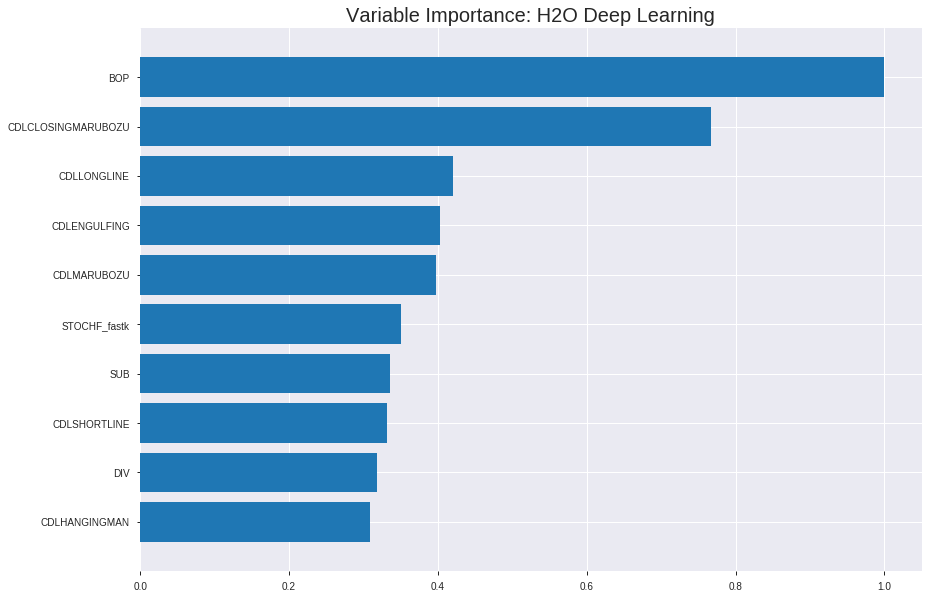

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190825_121802_model_8


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.19165980726201476
RMSE: 0.43778968382319694
LogLoss: 0.5636681838196691
Mean Per-Class Error: 0.28447475923429955
AUC: 0.7896642134089388
pr_auc: 0.7981558723394476
Gini: 0.5793284268178776
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5038693318409624: 


,0,1,Error,Rate
0,897.0,765.0,0.4603,(765.0/1662.0)
1,256.0,1710.0,0.1302,(256.0/1966.0)
Total,1153.0,2475.0,0.2814,(1021.0/3628.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5038693,0.7700968,221.0
max f2,0.3160082,0.8720036,308.0
max f0point5,0.5658914,0.7446456,181.0
max accuracy,0.5421043,0.7218853,199.0
max precision,0.9979241,1.0,0.0
max recall,0.0290647,1.0,391.0
max specificity,0.9979241,1.0,0.0
max absolute_mcc,0.5151046,0.4387871,214.0
max min_per_class_accuracy,0.5658914,0.6861648,181.0
max mean_per_class_accuracy,0.5658914,0.7155252,181.0


Gains/Lift Table: Avg response rate: 54.19 %, avg score: 54.43 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101985,0.9632337,1.7954964,1.7954964,0.9729730,0.9816425,0.9729730,0.9816425,0.0183113,0.0183113,79.5496412,79.5496412
,2,0.0201213,0.9394953,1.6915904,1.7442551,0.9166667,0.9514684,0.9452055,0.9667621,0.0167854,0.0350966,69.1590370,74.4255076
,3,0.0300441,0.9102591,1.6403301,1.7099312,0.8888889,0.9251928,0.9266055,0.9530328,0.0162767,0.0513733,64.0330055,70.9931216
,4,0.0402426,0.8899073,1.8453713,1.7442551,1.0,0.9000380,0.9452055,0.9396026,0.0188199,0.0701933,84.5371312,74.4255076
,5,0.0501654,0.8698120,1.5890697,1.7135591,0.8611111,0.8807338,0.9285714,0.9279582,0.0157681,0.0859613,58.9069741,71.3559076
,6,0.1000551,0.7849231,1.5497041,1.6318573,0.8397790,0.8253332,0.8842975,0.8767871,0.0773143,0.1632757,54.9704085,63.1857276
,7,0.1502205,0.7266644,1.5716074,1.6117371,0.8516484,0.7559470,0.8733945,0.8364332,0.0788403,0.2421160,57.1607436,61.1737146
,8,0.2001103,0.6811268,1.4681407,1.5759369,0.7955801,0.7028656,0.8539945,0.8031332,0.0732452,0.3153611,46.8140713,57.5936933
,9,0.3001654,0.6115484,1.3624229,1.5047656,0.7382920,0.6433484,0.8154270,0.7498716,0.1363174,0.4516785,36.2422897,50.4765588
,10,0.3999449,0.5794585,1.3050140,1.4549309,0.7071823,0.5920291,0.7884218,0.7104926,0.1302136,0.5818922,30.5013967,45.4930931




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.20129878543815882
RMSE: 0.4486633319518755
LogLoss: 0.5869426909561878
Mean Per-Class Error: 0.28544695444717816
AUC: 0.7721035562513979
pr_auc: 0.7417075481080623
Gini: 0.5442071125027959
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.46607850771799403: 


,0,1,Error,Rate
0,274.0,252.0,0.4791,(252.0/526.0)
1,56.0,454.0,0.1098,(56.0/510.0)
Total,330.0,706.0,0.2973,(308.0/1036.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4660785,0.7467105,220.0
max f2,0.3048780,0.8455757,303.0
max f0point5,0.5657081,0.6993642,149.0
max accuracy,0.5026196,0.7123552,200.0
max precision,0.9539696,1.0,0.0
max recall,0.0201260,1.0,390.0
max specificity,0.9539696,1.0,0.0
max absolute_mcc,0.5026196,0.4466608,200.0
max min_per_class_accuracy,0.5623628,0.6960784,153.0
max mean_per_class_accuracy,0.5026196,0.7145530,200.0


Gains/Lift Table: Avg response rate: 49.23 %, avg score: 50.03 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0106178,0.8763227,1.8467023,1.8467023,0.9090909,0.9073909,0.9090909,0.9073909,0.0196078,0.0196078,84.6702317,84.6702317
,2,0.0202703,0.8143259,2.0313725,1.9346405,1.0,0.8439438,0.9523810,0.8771780,0.0196078,0.0392157,103.1372549,93.4640523
,3,0.0308880,0.7908851,1.6620321,1.8409314,0.8181818,0.8040507,0.90625,0.8520405,0.0176471,0.0568627,66.2032086,84.0931373
,4,0.0405405,0.7593222,1.6250980,1.7895425,0.8,0.7719399,0.8809524,0.8329689,0.0156863,0.0725490,62.5098039,78.9542484
,5,0.0501931,0.7476557,2.0313725,1.8360483,1.0,0.7535465,0.9038462,0.8176954,0.0196078,0.0921569,103.1372549,83.6048265
,6,0.1003861,0.6799781,1.5625943,1.6993213,0.7692308,0.7106041,0.8365385,0.7641498,0.0784314,0.1705882,56.2594268,69.9321267
,7,0.1505792,0.6321911,1.2891403,1.5625943,0.6346154,0.6596311,0.7692308,0.7293102,0.0647059,0.2352941,28.9140271,56.2594268
,8,0.2007722,0.6031098,1.6016591,1.5723605,0.7884615,0.6139919,0.7740385,0.7004806,0.0803922,0.3156863,60.1659125,57.2360483
,9,0.3001931,0.5799969,1.5383210,1.5610869,0.7572816,0.5899119,0.7684887,0.6638614,0.1529412,0.4686275,53.8320959,56.1086943
,10,0.4005792,0.5656377,1.2500754,1.4831467,0.6153846,0.5713070,0.7301205,0.6406670,0.1254902,0.5941176,25.0075415,48.3146704



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-25 13:04:12,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-08-25 13:04:14,6 min 12.321 sec,233 obs/sec,0.1513230,1,549.0,0.6436473,1.5327630,-0.6688448,0.5652820,0.6075141,1.3964972,0.4581036,0.6176523,1.5570459,-0.5263414,0.5626277,0.5559787,1.2926916,0.4922780
,2019-08-25 13:05:12,7 min 9.864 sec,397 obs/sec,5.9445976,38,21567.0,0.4851373,0.6626296,0.0519104,0.6485473,0.6806491,1.5959968,0.4029768,0.4928838,0.6784065,0.0280304,0.6185305,0.6059568,1.8467023,0.4565637
,2019-08-25 13:06:08,8 min 6.751 sec,403 obs/sec,11.7475193,75,42620.0,0.4737114,0.6398521,0.0960432,0.7265776,0.7570305,1.7954964,0.3269019,0.4827254,0.6580891,0.0676825,0.7090472,0.6997027,1.8467023,0.3349421
,2019-08-25 13:07:05,9 min 3.721 sec,402 obs/sec,17.3982911,111,63121.0,0.4507609,0.5985904,0.1815115,0.7633853,0.7688750,1.8453713,0.3128445,0.4513479,0.6032028,0.1849460,0.7652837,0.7288711,1.8467023,0.2847490
,2019-08-25 13:08:03,10 min 1.668 sec,400 obs/sec,23.0669791,147,83687.0,0.4481347,0.5854552,0.1910210,0.7647251,0.7830229,1.7954964,0.3139471,0.4565957,0.6025760,0.1658825,0.7479498,0.7254802,2.0313725,0.3166023
,2019-08-25 13:09:01,10 min 59.656 sec,401 obs/sec,28.9115215,184,104891.0,0.4386001,0.5639902,0.2250790,0.7851170,0.8008911,1.7954964,0.2960309,0.4524897,0.5956275,0.1808171,0.7724204,0.7426487,2.0313725,0.3223938
,2019-08-25 13:09:58,11 min 56.312 sec,401 obs/sec,34.5959206,220,125514.0,0.4520450,0.5933206,0.1768417,0.7666727,0.7893378,1.7954964,0.3114664,0.4611874,0.6116444,0.1490216,0.7439536,0.7173635,1.8467023,0.3301158
,2019-08-25 13:10:55,12 min 53.900 sec,402 obs/sec,40.3800992,257,146499.0,0.4377897,0.5636682,0.2279400,0.7896642,0.7981559,1.7954964,0.2814223,0.4486633,0.5869427,0.1946128,0.7721036,0.7417075,1.8467023,0.2972973
,2019-08-25 13:11:55,13 min 53.407 sec,402 obs/sec,46.3789967,295,168263.0,0.4358523,0.5592228,0.2347581,0.7994267,0.8202581,1.7954964,0.2830761,0.4500004,0.5897823,0.1898055,0.7777287,0.7482127,1.8467023,0.2857143


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1.0,1.0,0.0127998
CDLCLOSINGMARUBOZU,0.7674061,0.7674061,0.0098227
CDLLONGLINE,0.4206200,0.4206200,0.0053839
CDLENGULFING,0.4029620,0.4029620,0.0051578
CDLMARUBOZU,0.3972521,0.3972521,0.0050848
---,---,---,---
CDL3BLACKCROWS,0.0455866,0.0455866,0.0005835
CDLPIERCING,0.0452110,0.0452110,0.0005787
CDLUNIQUE3RIVER,0.0429736,0.0429736,0.0005501
CDLMORNINGDOJISTAR,0.0407175,0.0407175,0.0005212



See the whole table with table.as_data_frame()


('accuracy', 0.7167630057803468)

('F1', 0.7341389728096677)

('auc', 0.7711001812832476)

('logloss', 0.6149171537137305)

('mean_per_class_error', 0.28259383636958013)

('rmse', 0.4639548374222401)

('mse', 0.21525409116749722)

deeplearning prediction progress: |███████████████████████████████████████| 100%


/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/converter.py:102: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


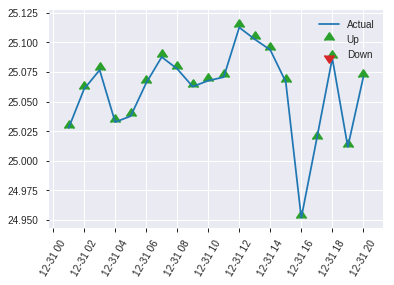


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.21525409116749722
RMSE: 0.4639548374222401
LogLoss: 0.6149171537137305
Mean Per-Class Error: 0.28259383636958013
AUC: 0.7711001812832476
pr_auc: 0.7664472229482802
Gini: 0.5422003625664953
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5652505969000213: 


,0,1,Error,Rate
0,100.0,153.0,0.6047,(153.0/253.0)
1,23.0,243.0,0.0865,(23.0/266.0)
Total,123.0,396.0,0.3391,(176.0/519.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5652506,0.7341390,276.0
max f2,0.3651558,0.8533420,357.0
max f0point5,0.5664105,0.7290016,240.0
max accuracy,0.5664105,0.7167630,240.0
max precision,0.9001974,1.0,0.0
max recall,0.1060705,1.0,384.0
max specificity,0.9001974,1.0,0.0
max absolute_mcc,0.5664105,0.4350322,240.0
max min_per_class_accuracy,0.5659750,0.7035573,249.0
max mean_per_class_accuracy,0.5664105,0.7174062,240.0


Gains/Lift Table: Avg response rate: 51.25 %, avg score: 55.82 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0115607,0.8624622,1.6259398,1.6259398,0.8333333,0.8830406,0.8333333,0.8830406,0.0187970,0.0187970,62.5939850,62.5939850
,2,0.0211946,0.8460211,1.9511278,1.7737526,1.0,0.8530790,0.9090909,0.8694217,0.0187970,0.0375940,95.1127820,77.3752563
,3,0.0308285,0.8099072,1.9511278,1.8291823,1.0,0.8261608,0.9375,0.8559027,0.0187970,0.0563910,95.1127820,82.9182331
,4,0.0404624,0.7840933,1.9511278,1.8582170,1.0,0.7990298,0.9523810,0.8423615,0.0187970,0.0751880,95.1127820,85.8216971
,5,0.0500963,0.7619917,1.9511278,1.8760844,1.0,0.7678719,0.9615385,0.8280366,0.0187970,0.0939850,95.1127820,87.6084442
,6,0.1001927,0.7066846,1.6509543,1.7635194,0.8461538,0.7307886,0.9038462,0.7794126,0.0827068,0.1766917,65.0954309,76.3519375
,7,0.1502890,0.6538000,1.2006940,1.5759109,0.6153846,0.6814640,0.8076923,0.7467631,0.0601504,0.2368421,20.0694043,57.5910931
,8,0.2003854,0.6223410,1.5759109,1.5759109,0.8076923,0.6366681,0.8076923,0.7192393,0.0789474,0.3157895,57.5910931,57.5910931
,9,0.3005780,0.5891873,1.5383892,1.5634037,0.7884615,0.6031058,0.8012821,0.6805281,0.1541353,0.4699248,53.8389242,56.3403702
,10,0.4007707,0.5728173,1.1256507,1.4539654,0.5769231,0.5797062,0.7451923,0.6553227,0.1127820,0.5827068,12.5650665,45.3965442


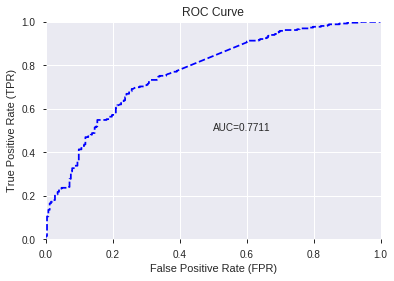

This function is available for GLM models only


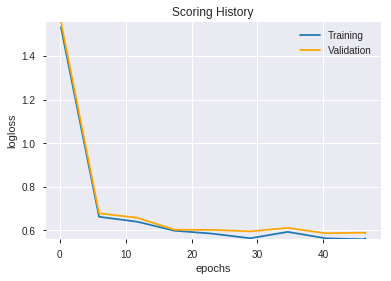

--2019-08-25 13:18:16--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.130.43
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.130.43|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 368257676 (351M) [application/zip]
Saving to: ‘h2o-3.24.0.5.zip’

h2o-3.24.0.5.zip    100%[===================>] 351.20M  47.7MB/s    in 7.9s    

2019-08-25 13:18:25 (44.6 MB/s) - ‘h2o-3.24.0.5.zip’ saved [368257676/368257676]

Archive:  h2o-3.24.0.5.zip
   creating: h2o-3.24.0.5/
   creating: h2o-3.24.0.5/bindings/
   creating: h2o-3.24.0.5/bindings/java/
 extracting: h2o-3.24.0.5/bindings/java/h2o-bindings-3.24.0.zip  
  inflating: h2o-3.24.0.5/h2o.jar    
   creating: h2o-3.24.0.5/python/
  inflating: h2o-3.24.0.5/python/h2o-3.24.0.5-py2.py3-none-any.whl  
   creating: h2o-3.24.0.5/R/
  inflating: h2o-3.24.0.5/R/h2o_3.24.0.5.tar.gz  
ERROR: Unk

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190825_121802_model_8',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190825_121802_model_8',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_2_sid_9d08',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl

In [10]:
# DeepLearning
features_list = model_train(feature_name='All',model_algo="DeepLearning")

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190825_131919_model_8,0.792802,0.560532,0.290603,0.435395,0.189568
1,DeepLearning_grid_1_AutoML_20190825_131919_model_9,0.786405,0.559219,0.284578,0.434673,0.188941
2,DeepLearning_grid_1_AutoML_20190825_131919_model_6,0.785105,0.566294,0.277683,0.438384,0.192180
3,DeepLearning_grid_1_AutoML_20190825_131919_model_5,0.780068,0.566462,0.279756,0.438619,0.192386
4,DeepLearning_grid_1_AutoML_20190825_131919_model_3,0.776628,0.614804,0.337506,0.449989,0.202490
5,DeepLearning_grid_1_AutoML_20190825_131919_model_7,0.757474,0.661064,0.305403,0.458817,0.210513
6,DeepLearning_grid_1_AutoML_20190825_131919_model_2,0.748477,0.635046,0.335337,0.464008,0.215304
7,DeepLearning_1_AutoML_20190825_131919,0.746798,0.602711,0.314318,0.455836,0.207787
8,DeepLearning_grid_1_AutoML_20190825_131919_model_4,0.732644,0.652656,0.368213,0.469409,0.220345
9,DeepLearning_grid_1_AutoML_20190825_131919_model_1,0.730839,0.775974,0.375442,0.488348,0.238484


,variable,relative_importance,scaled_importance,percentage
0,BOP,1.000000,1.000000,0.043127
1,CDLCLOSINGMARUBOZU,0.822769,0.822769,0.035484
2,HT_TRENDMODE,0.548334,0.548334,0.023648
3,weekday_name,0.548282,0.548282,0.023646
4,PLUS_DI_8,0.537701,0.537701,0.023190
5,hour,0.509412,0.509412,0.021970
6,CDLMARUBOZU,0.509197,0.509197,0.021960
7,aroonup_8,0.499021,0.499021,0.021521
8,WILLR_8,0.498988,0.498988,0.021520
9,CDLHANGINGMAN,0.496884,0.496884,0.021429


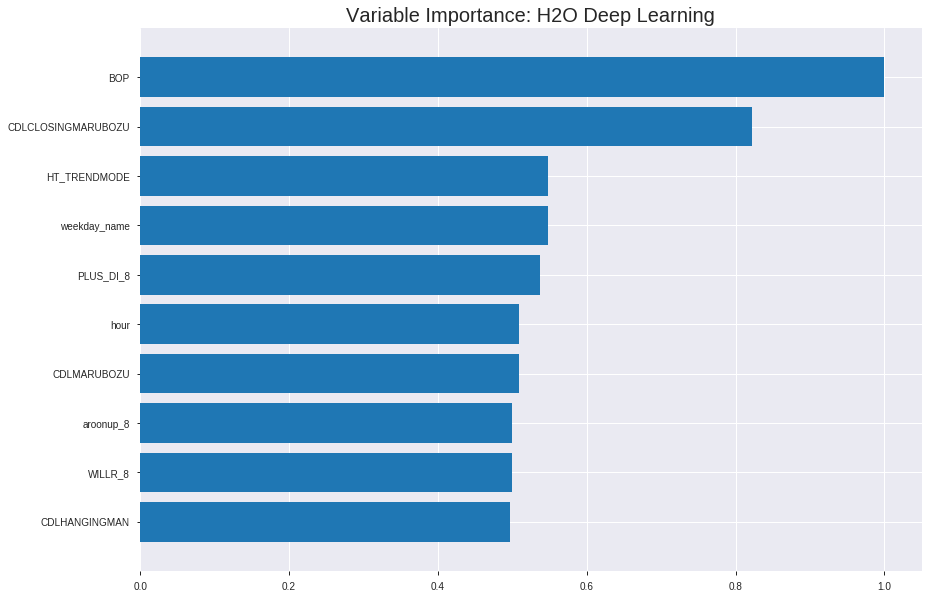

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190825_131919_model_8


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.18459672137827643
RMSE: 0.4296472057144983
LogLoss: 0.5493753615546931
Mean Per-Class Error: 0.27813503445456034
AUC: 0.7969275823781664
pr_auc: 0.808421794410041
Gini: 0.5938551647563328
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3915707863663237: 


,0,1,Error,Rate
0,817.0,845.0,0.5084,(845.0/1662.0)
1,205.0,1761.0,0.1043,(205.0/1966.0)
Total,1022.0,2606.0,0.2894,(1050.0/3628.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3915708,0.7703412,252.0
max f2,0.1287161,0.8692328,349.0
max f0point5,0.5925257,0.7485812,160.0
max accuracy,0.5384549,0.7279493,193.0
max precision,0.9198330,1.0,0.0
max recall,0.0131816,1.0,398.0
max specificity,0.9198330,1.0,0.0
max absolute_mcc,0.5384549,0.4497203,193.0
max min_per_class_accuracy,0.5776072,0.7190132,170.0
max mean_per_class_accuracy,0.5708747,0.7218650,174.0


Gains/Lift Table: Avg response rate: 54.19 %, avg score: 51.60 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101985,0.9005530,1.7954964,1.7954964,0.9729730,0.9082328,0.9729730,0.9082328,0.0183113,0.0183113,79.5496412,79.5496412
,2,0.0201213,0.8827967,1.5890697,1.6936970,0.8611111,0.8933415,0.9178082,0.9008892,0.0157681,0.0340793,58.9069741,69.3696958
,3,0.0300441,0.8618667,1.7428507,1.7099312,0.9444444,0.8731414,0.9266055,0.8917248,0.0172940,0.0513733,74.2850684,70.9931216
,4,0.0402426,0.8487945,1.6458717,1.6936970,0.8918919,0.8551285,0.9178082,0.8824504,0.0167854,0.0681587,64.5871711,69.3696958
,5,0.0501654,0.8398519,1.7941110,1.7135591,0.9722222,0.8439077,0.9285714,0.8748265,0.0178026,0.0859613,79.4110998,71.3559076
,6,0.1000551,0.7891852,1.6720491,1.6928613,0.9060773,0.8146570,0.9173554,0.8448246,0.0834181,0.1693795,67.2049145,69.2861286
,7,0.1502205,0.7387676,1.5310498,1.6388252,0.8296703,0.7616703,0.8880734,0.8170557,0.0768057,0.2461851,53.1049825,63.8825165
,8,0.2001103,0.7086222,1.5089224,1.6064389,0.8176796,0.7219774,0.8705234,0.7933516,0.0752798,0.3214649,50.8922399,60.6438939
,9,0.3001654,0.6614491,1.3980086,1.5369621,0.7575758,0.6835643,0.8328742,0.7567558,0.1398779,0.4613428,39.8008570,53.6962149
,10,0.3999449,0.6183685,1.2540369,1.4663771,0.6795580,0.6393816,0.7946244,0.7274729,0.1251272,0.5864700,25.4036859,46.6377066




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.18988491556285736
RMSE: 0.4357578634549896
LogLoss: 0.5632914432916396
Mean Per-Class Error: 0.2586259598896592
AUC: 0.784227987773056
pr_auc: 0.7496904615135961
Gini: 0.568455975546112
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5290592704567401: 


,0,1,Error,Rate
0,355.0,171.0,0.3251,(171.0/526.0)
1,98.0,412.0,0.1922,(98.0/510.0)
Total,453.0,583.0,0.2597,(269.0/1036.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5290593,0.7538884,189.0
max f2,0.1712701,0.8428128,326.0
max f0point5,0.5696724,0.7319907,167.0
max accuracy,0.5307776,0.7403475,188.0
max precision,0.9206779,1.0,0.0
max recall,0.0246889,1.0,396.0
max specificity,0.9206779,1.0,0.0
max absolute_mcc,0.5290593,0.4865362,189.0
max min_per_class_accuracy,0.5707630,0.7338403,166.0
max mean_per_class_accuracy,0.5290593,0.7413740,189.0


Gains/Lift Table: Avg response rate: 49.23 %, avg score: 48.63 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0106178,0.8788911,1.8467023,1.8467023,0.9090909,0.8942775,0.9090909,0.8942775,0.0196078,0.0196078,84.6702317,84.6702317
,2,0.0202703,0.8596036,1.6250980,1.7411765,0.8,0.8688321,0.8571429,0.8821606,0.0156863,0.0352941,62.5098039,74.1176471
,3,0.0308880,0.8371682,2.0313725,1.8409314,1.0,0.8455670,0.90625,0.8695816,0.0215686,0.0568627,103.1372549,84.0931373
,4,0.0405405,0.8255060,1.6250980,1.7895425,0.8,0.8336361,0.8809524,0.8610231,0.0156863,0.0725490,62.5098039,78.9542484
,5,0.0501931,0.8119120,1.6250980,1.7579186,0.8,0.8168157,0.8653846,0.8525217,0.0156863,0.0882353,62.5098039,75.7918552
,6,0.1003861,0.7517639,1.6797888,1.7188537,0.8269231,0.7776526,0.8461538,0.8150872,0.0843137,0.1725490,67.9788839,71.8853695
,7,0.1505792,0.7218250,1.2891403,1.5756159,0.6346154,0.7354809,0.7756410,0.7885518,0.0647059,0.2372549,28.9140271,57.5615887
,8,0.2007722,0.6962865,1.6407240,1.5918929,0.8076923,0.7095698,0.7836538,0.7688063,0.0823529,0.3196078,64.0723982,59.1892911
,9,0.3001931,0.6516866,1.4594327,1.5480235,0.7184466,0.6719406,0.7620579,0.7367253,0.1450980,0.4647059,45.9432705,54.8023454
,10,0.4005792,0.6050430,1.3672700,1.5027262,0.6730769,0.6278277,0.7397590,0.7094353,0.1372549,0.6019608,36.7269985,50.2726199



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-25 13:29:39,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-08-25 13:29:41,2 min 55.166 sec,619 obs/sec,0.3627343,1,1316.0,0.4842763,0.6840502,0.0552729,0.7563446,0.7667996,1.7954964,0.3147740,0.4786642,0.6716928,0.0833037,0.7625196,0.7134342,1.6620321,0.2895753
,2019-08-25 13:30:06,3 min 20.580 sec,1107 obs/sec,7.6482911,21,27748.0,0.4296472,0.5493754,0.2563921,0.7969276,0.8084218,1.7954964,0.2894157,0.4357579,0.5632914,0.2402791,0.7842280,0.7496905,1.8467023,0.2596525
,2019-08-25 13:30:31,3 min 45.847 sec,1241 obs/sec,16.3517089,45,59324.0,0.4215723,0.5310098,0.2840807,0.8149849,0.8268556,1.7954964,0.2637817,0.4391178,0.5713605,0.2285183,0.7802393,0.7461072,2.0313725,0.2828185
,2019-08-25 13:30:58,4 min 11.904 sec,1316 obs/sec,25.8883682,71,93923.0,0.4078332,0.5031594,0.3299839,0.8374599,0.8444942,1.7954964,0.2527563,0.4455012,0.5848349,0.2059252,0.7702173,0.7356202,2.0313725,0.3021236
,2019-08-25 13:31:23,4 min 37.598 sec,1371 obs/sec,35.7196803,98,129591.0,0.3955168,0.4752839,0.3698414,0.8596858,0.8748871,1.8453713,0.2273980,0.4477222,0.5990684,0.1979880,0.7649221,0.7277928,1.6620321,0.2992278
,2019-08-25 13:31:49,5 min 3.471 sec,1386 obs/sec,44.9594818,123,163113.0,0.3789238,0.4381919,0.4216061,0.8841022,0.8951872,1.8453713,0.2177508,0.4531282,0.6236255,0.1785033,0.7623593,0.7216423,1.8467023,0.3069498
,2019-08-25 13:32:16,5 min 30.721 sec,1404 obs/sec,55.0887541,151,199862.0,0.3602983,0.3971066,0.4770688,0.9015113,0.9091657,1.8453713,0.1973539,0.4682253,0.6940677,0.1228511,0.7397432,0.6837632,1.4773619,0.3320463
,2019-08-25 13:32:19,5 min 33.465 sec,1404 obs/sec,55.0887541,151,199862.0,0.4296472,0.5493754,0.2563921,0.7969276,0.8084218,1.7954964,0.2894157,0.4357579,0.5632914,0.2402791,0.7842280,0.7496905,1.8467023,0.2596525


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1.0,1.0,0.0431274
CDLCLOSINGMARUBOZU,0.8227687,0.8227687,0.0354839
HT_TRENDMODE,0.5483344,0.5483344,0.0236482
weekday_name,0.5482821,0.5482821,0.0236460
PLUS_DI_8,0.5377008,0.5377008,0.0231896
---,---,---,---
CDLHIKKAKE,0.3839024,0.3839024,0.0165567
CMO_8,0.3796541,0.3796541,0.0163735
CDL3OUTSIDE,0.3748331,0.3748331,0.0161656
is_month_end,0.3196756,0.3196756,0.0137868



See the whole table with table.as_data_frame()


('accuracy', 0.7398843930635838)

('F1', 0.7520798668885191)

('auc', 0.7928021635115456)

('logloss', 0.5605319310534448)

('mean_per_class_error', 0.2599408600552765)

('rmse', 0.4353945085729976)

('mse', 0.1895683780955221)

deeplearning prediction progress: |███████████████████████████████████████| 100%


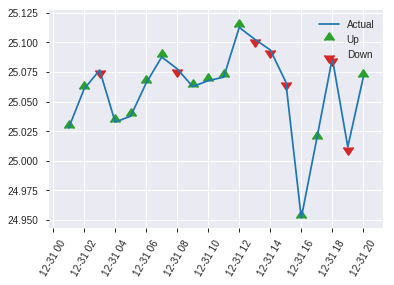


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.1895683780955221
RMSE: 0.4353945085729976
LogLoss: 0.5605319310534448
Mean Per-Class Error: 0.2599408600552765
AUC: 0.7928021635115456
pr_auc: 0.7875633552078272
Gini: 0.5856043270230913
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4189046325125461: 


,0,1,Error,Rate
0,144.0,109.0,0.4308,(109.0/253.0)
1,40.0,226.0,0.1504,(40.0/266.0)
Total,184.0,335.0,0.2871,(149.0/519.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4189046,0.7520799,249.0
max f2,0.1100159,0.8574244,354.0
max f0point5,0.5666914,0.7488479,191.0
max accuracy,0.5666914,0.7398844,191.0
max precision,0.9039676,1.0,0.0
max recall,0.0609006,1.0,375.0
max specificity,0.9039676,1.0,0.0
max absolute_mcc,0.5666914,0.4799685,191.0
max min_per_class_accuracy,0.5662929,0.7368421,192.0
max mean_per_class_accuracy,0.5666914,0.7400591,191.0


Gains/Lift Table: Avg response rate: 51.25 %, avg score: 48.20 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0115607,0.8760690,1.9511278,1.9511278,1.0,0.8902580,1.0,0.8902580,0.0225564,0.0225564,95.1127820,95.1127820
,2,0.0211946,0.8587576,1.9511278,1.9511278,1.0,0.8681035,1.0,0.8801878,0.0187970,0.0413534,95.1127820,95.1127820
,3,0.0308285,0.8376453,1.5609023,1.8291823,0.8,0.8442185,0.9375,0.8689474,0.0150376,0.0563910,56.0902256,82.9182331
,4,0.0404624,0.8170977,1.5609023,1.7653061,0.8,0.8325690,0.9047619,0.8602859,0.0150376,0.0714286,56.0902256,76.5306122
,5,0.0500963,0.7962552,1.5609023,1.7259977,0.8,0.8083233,0.8846154,0.8502931,0.0150376,0.0864662,56.0902256,72.5997687
,6,0.1001927,0.7464246,1.7259977,1.7259977,0.8846154,0.7718210,0.8846154,0.8110570,0.0864662,0.1729323,72.5997687,72.5997687
,7,0.1502890,0.7134057,1.5759109,1.6759688,0.8076923,0.7272824,0.8589744,0.7831322,0.0789474,0.2518797,57.5910931,67.5968768
,8,0.2003854,0.6860234,1.8760844,1.7259977,0.9615385,0.7006367,0.8846154,0.7625083,0.0939850,0.3458647,87.6084442,72.5997687
,9,0.3005780,0.6464003,1.2382157,1.5634037,0.6346154,0.6649998,0.8012821,0.7300055,0.1240602,0.4699248,23.8215732,56.3403702
,10,0.4007707,0.5994495,1.3132591,1.5008676,0.6730769,0.6247286,0.7692308,0.7036862,0.1315789,0.6015038,31.3259109,50.0867553


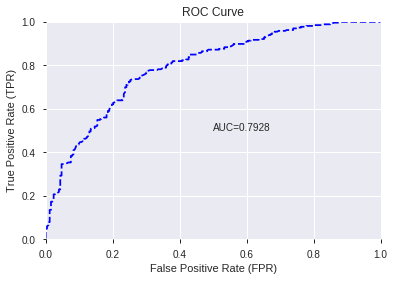

This function is available for GLM models only


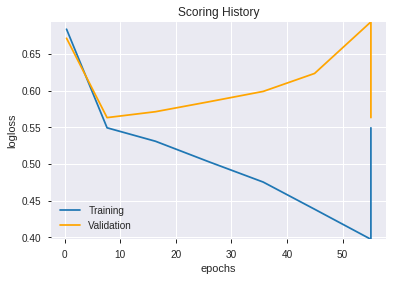

--2019-08-25 13:36:57--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.164.219
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.164.219|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190825_131919_model_8',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190825_131919_model_8',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_10_sid_9d08',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['BOP',
 'CDLCLOSINGMARUBOZU',
 'HT_TRENDMODE',
 'weekday_name',
 'PLUS_DI_8',
 'hour',
 'CDLMARUBOZU',
 'aroonup_8',
 'WILLR_8',
 'CDLHANGINGMAN',
 'CCI_8',
 'days_in_month',
 'STOCHRSI_fastd',
 'SUB',
 'CORREL_8',
 'day',
 'SAREXT',
 'BETA_30',
 'ULTOSC',
 'CDLENGULFING',
 'DIV',
 'PLUS_DM_8',
 'dayofweek',
 'BETA_8',
 'Volume',
 'STOCH_slowd',
 'STOCHF_fastk',
 'weekday',
 'CDLLONGLINE',
 'HT_PHASOR_quadrature',
 'WILLR_12',
 'CDLSHORTLINE',
 'STOCHRSI_fastk',
 'WILLR_14',
 'CDLBELTHOLD',
 'CDLGRAVESTONEDOJI',
 'CDLHARAMI',
 'ADOSC',
 'CDLTAKURI',
 'CORREL_20',
 'TRANGE',
 'CDLSTALLEDPATTERN',
 'CDLHAMMER',
 'CDLDRAGONFLYDOJI',
 'CORREL_24',
 'CDLHIKKAKE',
 'CMO_8',
 'CDL3OUTSIDE',
 'is_month_end',
 'is_month_start']

In [11]:
# DeepLearning with top DeepLearning features
model_train(feature_name='DLF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190825_133754_model_1,0.784986,0.564849,0.272527,0.437022,0.190988


,variable,relative_importance,scaled_importance,percentage
0,SUB,4.491431,1.000000,0.296754
1,DIV,4.315187,0.960760,0.285109
2,BOP,0.955564,0.212753,0.063135
3,WILLR_12,0.479404,0.106738,0.031675
4,WILLR_8,0.377820,0.084120,0.024963
5,WILLR_14,0.371783,0.082776,0.024564
6,STOCH_slowd,0.365483,0.081373,0.024148
7,CDLCLOSINGMARUBOZU,0.299420,0.066665,0.019783
8,CCI_8,0.287561,0.064024,0.018999
9,PLUS_DI_8,0.272130,0.060589,0.017980


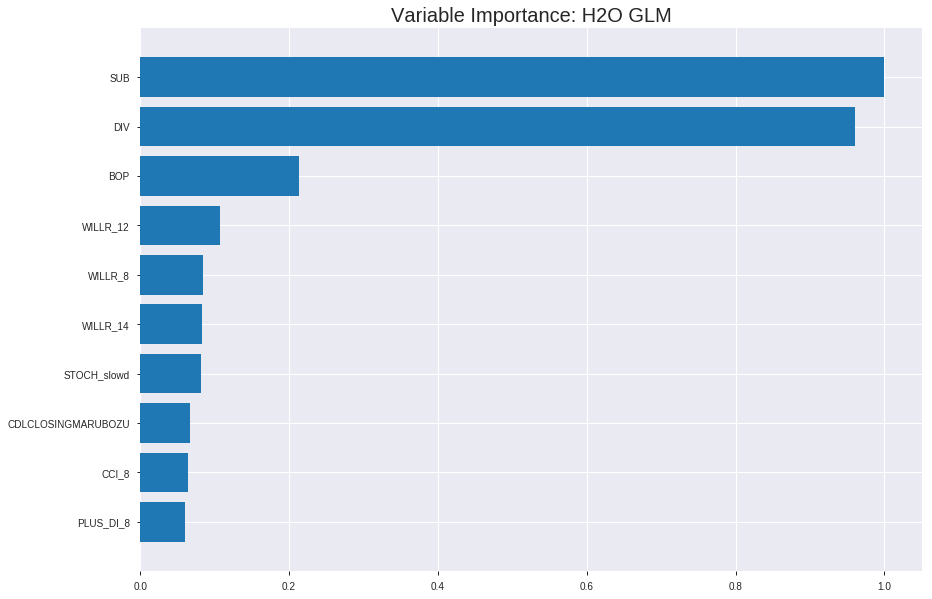

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190825_133754_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.18470286772209948
RMSE: 0.4297707152914208
LogLoss: 0.5477872053819888
Null degrees of freedom: 3627
Residual degrees of freedom: 3577
Null deviance: 5003.973061660213
Residual deviance: 3974.743962251711
AIC: 4076.743962251711
AUC: 0.7920304012986107
pr_auc: 0.8086527085745199
Gini: 0.5840608025972214
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.33517364405892197: 


,0,1,Error,Rate
0,722.0,940.0,0.5656,(940.0/1662.0)
1,168.0,1798.0,0.0855,(168.0/1966.0)
Total,890.0,2738.0,0.3054,(1108.0/3628.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3351736,0.7644558,279.0
max f2,0.1299806,0.8662398,361.0
max f0point5,0.5589407,0.7477278,183.0
max accuracy,0.5073895,0.7265711,205.0
max precision,0.9872259,1.0,0.0
max recall,0.0258206,1.0,396.0
max specificity,0.9872259,1.0,0.0
max absolute_mcc,0.5073895,0.4476058,205.0
max min_per_class_accuracy,0.5571076,0.7208183,184.0
max mean_per_class_accuracy,0.5073895,0.7226839,205.0


Gains/Lift Table: Avg response rate: 54.19 %, avg score: 54.19 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101985,0.9380766,1.7456215,1.7456215,0.9459459,0.9501183,0.9459459,0.9501183,0.0178026,0.0178026,74.5621512,74.5621512
,2,0.0201213,0.9269721,1.7428507,1.7442551,0.9444444,0.9329768,0.9452055,0.9416649,0.0172940,0.0350966,74.2850684,74.4255076
,3,0.0300441,0.9157209,1.7941110,1.7607213,0.9722222,0.9220628,0.9541284,0.9351908,0.0178026,0.0528993,79.4110998,76.0721252
,4,0.0402426,0.9069089,1.7456215,1.7568946,0.9459459,0.9113366,0.9520548,0.9291456,0.0178026,0.0707019,74.5621512,75.6894606
,5,0.0501654,0.8990156,1.7428507,1.7541167,0.9444444,0.9023616,0.9505495,0.9238477,0.0172940,0.0879959,74.2850684,75.4116687
,6,0.1000551,0.8590720,1.6312675,1.6928613,0.8839779,0.8793045,0.9173554,0.9016374,0.0813835,0.1693795,63.1267458,69.2861286
,7,0.1502205,0.8222380,1.5513286,1.6455972,0.8406593,0.8408669,0.8917431,0.8813434,0.0778230,0.2472024,55.1328631,64.5597170
,8,0.2001103,0.7917464,1.5293132,1.6166063,0.8287293,0.8064593,0.8760331,0.8626740,0.0762970,0.3234995,52.9313242,61.6606274
,9,0.3001654,0.7265035,1.3624229,1.5318785,0.7382920,0.7599547,0.8301194,0.8284342,0.1363174,0.4598169,36.2422897,53.1878481
,10,0.3999449,0.6610493,1.2336460,1.4574745,0.6685083,0.6930644,0.7898001,0.7946617,0.1230926,0.5829095,23.3646015,45.7474517




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.18577713365599186
RMSE: 0.4310187161319005
LogLoss: 0.5514225295438109
Null degrees of freedom: 1035
Residual degrees of freedom: 985
Null deviance: 1446.188268020725
Residual deviance: 1142.547481214776
AIC: 1244.547481214776
AUC: 0.7911876537687319
pr_auc: 0.761802830248198
Gini: 0.5823753075374638
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3615639850320411: 


,0,1,Error,Rate
0,300.0,226.0,0.4297,(226.0/526.0)
1,63.0,447.0,0.1235,(63.0/510.0)
Total,363.0,673.0,0.279,(289.0/1036.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3615640,0.7557058,251.0
max f2,0.1818068,0.8507004,333.0
max f0point5,0.5155281,0.7203718,188.0
max accuracy,0.4887028,0.7287645,199.0
max precision,0.9607670,1.0,0.0
max recall,0.0526431,1.0,386.0
max specificity,0.9607670,1.0,0.0
max absolute_mcc,0.3725420,0.4690752,247.0
max min_per_class_accuracy,0.5210885,0.7243346,186.0
max mean_per_class_accuracy,0.4887028,0.7291918,199.0


Gains/Lift Table: Avg response rate: 49.23 %, avg score: 50.18 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0106178,0.9249513,2.0313725,2.0313725,1.0,0.9412237,1.0,0.9412237,0.0215686,0.0215686,103.1372549,103.1372549
,2,0.0202703,0.9035178,2.0313725,2.0313725,1.0,0.9153487,1.0,0.9289023,0.0196078,0.0411765,103.1372549,103.1372549
,3,0.0308880,0.8883287,1.6620321,1.9044118,0.8181818,0.8968279,0.9375,0.9178767,0.0176471,0.0588235,66.2032086,90.4411765
,4,0.0405405,0.8773392,1.8282353,1.8862745,0.9,0.8833224,0.9285714,0.9096495,0.0176471,0.0764706,82.8235294,88.6274510
,5,0.0501931,0.8684853,1.6250980,1.8360483,0.8,0.8731757,0.9038462,0.9026353,0.0156863,0.0921569,62.5098039,83.6048265
,6,0.1003861,0.8293105,1.5235294,1.6797888,0.75,0.8476152,0.8269231,0.8751252,0.0764706,0.1686275,52.3529412,67.9788839
,7,0.1505792,0.7929813,1.6407240,1.6667672,0.8076923,0.8086103,0.8205128,0.8529536,0.0823529,0.2509804,64.0723982,66.6767220
,8,0.2007722,0.7688378,1.5625943,1.6407240,0.7692308,0.7820172,0.8076923,0.8352195,0.0784314,0.3294118,56.2594268,64.0723982
,9,0.3001931,0.6972563,1.4594327,1.5806822,0.7184466,0.7346144,0.7781350,0.8019001,0.1450980,0.4745098,45.9432705,58.0682176
,10,0.4005792,0.6206059,1.2110106,1.4880416,0.5961538,0.6573531,0.7325301,0.7656763,0.1215686,0.5960784,21.1010558,48.8041578



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-08-25 13:37:55,0.000 sec,2,.22E2,51,1.3594913,1.3756540
,2019-08-25 13:37:55,0.049 sec,4,.14E2,51,1.3492621,1.3651529
,2019-08-25 13:37:55,0.096 sec,6,.85E1,51,1.3349874,1.3504787
,2019-08-25 13:37:55,0.137 sec,8,.53E1,51,1.3161989,1.3311182
,2019-08-25 13:37:55,0.171 sec,10,.33E1,51,1.2930968,1.3072065
---,---,---,---,---,---,---,---
,2019-08-25 13:37:56,0.887 sec,51,.15E-3,51,1.0976398,1.1049664
,2019-08-25 13:37:56,0.928 sec,53,.92E-4,51,1.0968733,1.1039062
,2019-08-25 13:37:56,0.970 sec,55,.57E-4,51,1.0962564,1.1032001
,2019-08-25 13:37:56,1.001 sec,56,.35E-4,51,1.0959361,1.1029502



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7302504816955684)

('F1', 0.7610921501706486)

('auc', 0.7849861808671877)

('logloss', 0.5648485262676701)

('mean_per_class_error', 0.2718505750542364)

('rmse', 0.4370219971445252)

('mse', 0.1909882259881894)

glm prediction progress: |████████████████████████████████████████████████| 100%


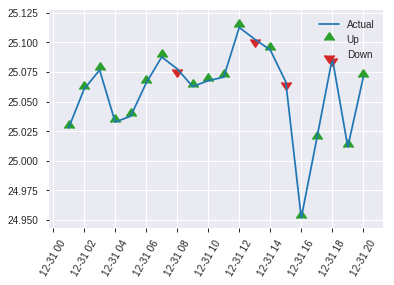


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.1909882259881894
RMSE: 0.4370219971445252
LogLoss: 0.5648485262676701
Null degrees of freedom: 518
Residual degrees of freedom: 468
Null deviance: 720.959908525584
Residual deviance: 586.3127702658416
AIC: 688.3127702658416
AUC: 0.7849861808671877
pr_auc: 0.7632852148848768
Gini: 0.5699723617343755
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.51415814449005: 


,0,1,Error,Rate
0,156.0,97.0,0.3834,(97.0/253.0)
1,43.0,223.0,0.1617,(43.0/266.0)
Total,199.0,320.0,0.2697,(140.0/519.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5141581,0.7610922,233.0
max f2,0.2710204,0.8617234,326.0
max f0point5,0.6687472,0.7310924,164.0
max accuracy,0.5332781,0.7302505,222.0
max precision,0.9918078,1.0,0.0
max recall,0.1261471,1.0,373.0
max specificity,0.9918078,1.0,0.0
max absolute_mcc,0.5141581,0.4676921,233.0
max min_per_class_accuracy,0.6070623,0.7114625,187.0
max mean_per_class_accuracy,0.5332781,0.7281494,222.0


Gains/Lift Table: Avg response rate: 51.25 %, avg score: 57.60 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0115607,0.9635884,1.9511278,1.9511278,1.0,0.9787894,1.0,0.9787894,0.0225564,0.0225564,95.1127820,95.1127820
,2,0.0211946,0.9542633,1.5609023,1.7737526,0.8,0.9584919,0.9090909,0.9695633,0.0150376,0.0375940,56.0902256,77.3752563
,3,0.0308285,0.9363017,1.5609023,1.7072368,0.8,0.9454998,0.875,0.9620435,0.0150376,0.0526316,56.0902256,70.7236842
,4,0.0404624,0.9245451,1.5609023,1.6723953,0.8,0.9292904,0.8571429,0.9542451,0.0150376,0.0676692,56.0902256,67.2395274
,5,0.0500963,0.9150920,1.9511278,1.7259977,1.0,0.9214810,0.8846154,0.9479443,0.0187970,0.0864662,95.1127820,72.5997687
,6,0.1001927,0.8747119,1.6509543,1.6884760,0.8461538,0.8932177,0.8653846,0.9205810,0.0827068,0.1691729,65.0954309,68.8475998
,7,0.1502890,0.8456740,1.4258242,1.6009254,0.7307692,0.8576623,0.8205128,0.8996081,0.0714286,0.2406015,42.5824176,60.0925390
,8,0.2003854,0.8242507,1.2757374,1.5196284,0.6538462,0.8342943,0.7788462,0.8832796,0.0639098,0.3045113,27.5737420,51.9628398
,9,0.3005780,0.7777274,1.4633459,1.5008676,0.75,0.8032179,0.7692308,0.8565924,0.1466165,0.4511278,46.3345865,50.0867553
,10,0.4007707,0.7151501,1.4633459,1.4914871,0.75,0.7488277,0.7644231,0.8296512,0.1466165,0.5977444,46.3345865,49.1487131


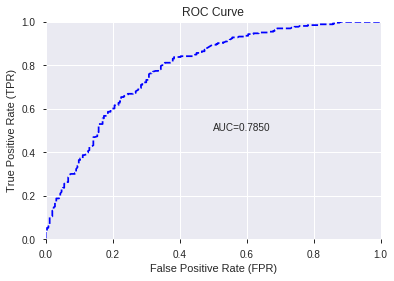

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


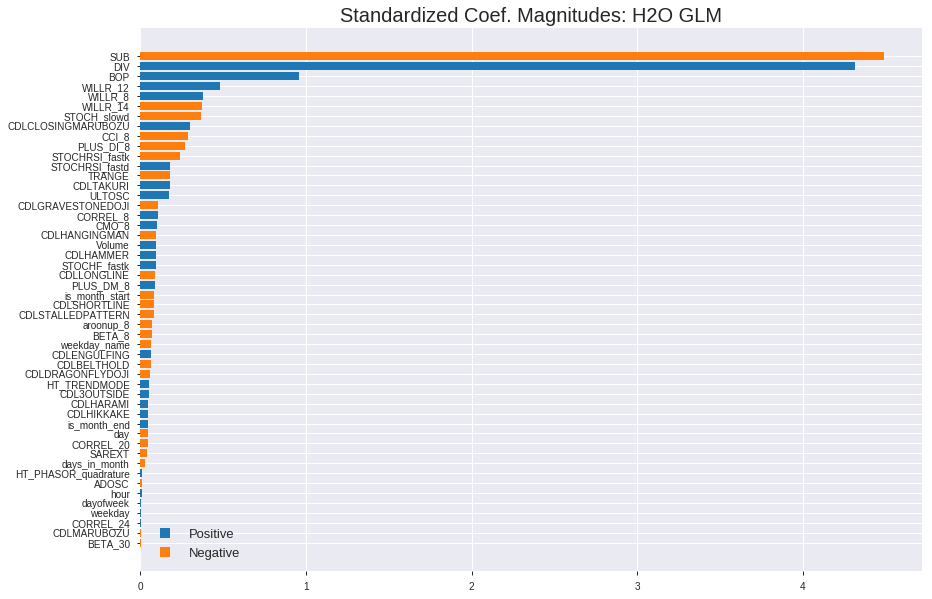

'log_likelihood'
--2019-08-25 13:38:05--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.146.19
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.146.19|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190825_133754_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190825_133754_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_18_sid_9d08',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_18_s

['SUB',
 'DIV',
 'BOP',
 'WILLR_12',
 'WILLR_8',
 'WILLR_14',
 'STOCH_slowd',
 'CDLCLOSINGMARUBOZU',
 'CCI_8',
 'PLUS_DI_8',
 'STOCHRSI_fastk',
 'STOCHRSI_fastd',
 'TRANGE',
 'CDLTAKURI',
 'ULTOSC',
 'CDLGRAVESTONEDOJI',
 'CORREL_8',
 'CMO_8',
 'CDLHANGINGMAN',
 'Volume',
 'CDLHAMMER',
 'STOCHF_fastk',
 'CDLLONGLINE',
 'PLUS_DM_8',
 'is_month_start',
 'CDLSHORTLINE',
 'CDLSTALLEDPATTERN',
 'aroonup_8',
 'BETA_8',
 'weekday_name',
 'CDLENGULFING',
 'CDLBELTHOLD',
 'CDLDRAGONFLYDOJI',
 'HT_TRENDMODE',
 'CDL3OUTSIDE',
 'CDLHARAMI',
 'CDLHIKKAKE',
 'is_month_end',
 'day',
 'CORREL_20',
 'SAREXT',
 'days_in_month',
 'HT_PHASOR_quadrature',
 'ADOSC',
 'hour',
 'dayofweek',
 'weekday',
 'CORREL_24',
 'CDLMARUBOZU',
 'BETA_30']

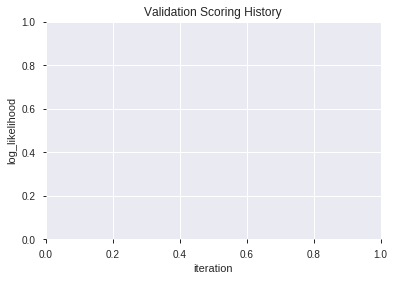

In [12]:
# GLM with top DeepLearning features
model_train(feature_name='DLF',model_algo="GLM",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_2_AutoML_20190825_133902,0.805262,0.540101,0.270454,0.425543,0.181087
1,XGBoost_3_AutoML_20190825_133902,0.802728,0.544578,0.274213,0.427279,0.182568
2,XGBoost_grid_1_AutoML_20190825_133902_model_7,0.797661,0.545954,0.290269,0.428571,0.183673
3,XGBoost_grid_1_AutoML_20190825_133902_model_1,0.794533,0.551265,0.313791,0.430868,0.185647
4,XGBoost_grid_1_AutoML_20190825_133902_model_3,0.794229,0.550146,0.270261,0.430650,0.185460
5,XGBoost_grid_1_AutoML_20190825_133902_model_4,0.793107,0.552048,0.269778,0.431669,0.186338
6,XGBoost_grid_1_AutoML_20190825_133902_model_6,0.790915,0.554168,0.286650,0.432579,0.187124
7,XGBoost_1_AutoML_20190825_133902,0.790202,0.554446,0.310032,0.432948,0.187444
8,XGBoost_grid_1_AutoML_20190825_133902_model_2,0.789957,0.556449,0.294942,0.433349,0.187792
9,XGBoost_grid_1_AutoML_20190825_133902_model_5,0.778255,0.570773,0.298315,0.439204,0.192900


,variable,relative_importance,scaled_importance,percentage
0,BOP,4534.603516,1.000000,0.278782
1,STOCHF_fastk,739.323120,0.163040,0.045453
2,WILLR_8,570.849243,0.125887,0.035095
3,STOCHRSI_fastk,547.530762,0.120745,0.033662
4,hour,544.111328,0.119991,0.033451
5,CORREL_8,504.650421,0.111289,0.031025
6,CCI_8,503.029785,0.110931,0.030926
7,PLUS_DI_8,499.403595,0.110132,0.030703
8,DIV,450.672729,0.099385,0.027707
9,HT_PHASOR_quadrature,419.714264,0.092558,0.025804


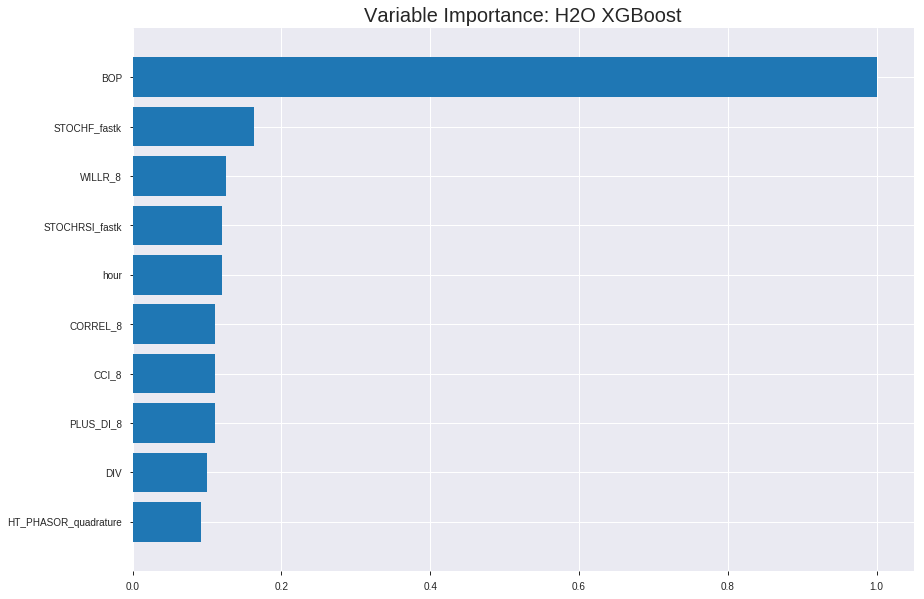

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_2_AutoML_20190825_133902


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.13239151334225813
RMSE: 0.3638564460639087
LogLoss: 0.4268393949820102
Mean Per-Class Error: 0.1723220745452475
AUC: 0.912760918771951
pr_auc: 0.9231903851096814
Gini: 0.825521837543902
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.46705137491226195: 


,0,1,Error,Rate
0,1196.0,466.0,0.2804,(466.0/1662.0)
1,198.0,1768.0,0.1007,(198.0/1966.0)
Total,1394.0,2234.0,0.183,(664.0/3628.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4670514,0.8419048,228.0
max f2,0.3146724,0.9055749,288.0
max f0point5,0.6567499,0.8667258,140.0
max accuracy,0.5351784,0.8277288,199.0
max precision,0.9419175,1.0,0.0
max recall,0.1268938,1.0,372.0
max specificity,0.9419175,1.0,0.0
max absolute_mcc,0.6026356,0.6543219,167.0
max min_per_class_accuracy,0.5494598,0.8229908,191.0
max mean_per_class_accuracy,0.6026356,0.8276779,167.0


Gains/Lift Table: Avg response rate: 54.19 %, avg score: 54.13 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101985,0.9249367,1.8453713,1.8453713,1.0,0.9319733,1.0,0.9319733,0.0188199,0.0188199,84.5371312,84.5371312
,2,0.0201213,0.9145256,1.8453713,1.8453713,1.0,0.9193512,1.0,0.9257487,0.0183113,0.0371312,84.5371312,84.5371312
,3,0.0300441,0.9034468,1.8453713,1.8453713,1.0,0.9079133,1.0,0.9198581,0.0183113,0.0554425,84.5371312,84.5371312
,4,0.0402426,0.8951592,1.7954964,1.8327318,0.9729730,0.8990045,0.9931507,0.9145733,0.0183113,0.0737538,79.5496412,83.2731783
,5,0.0501654,0.8884829,1.7941110,1.8250925,0.9722222,0.8909999,0.9890110,0.9099104,0.0178026,0.0915565,79.4110998,82.5092507
,6,0.1000551,0.8513497,1.8249805,1.8250366,0.9889503,0.8692136,0.9889807,0.8896181,0.0910478,0.1826043,82.4980469,82.5036642
,7,0.1502205,0.8216721,1.7642561,1.8047393,0.9560440,0.8359212,0.9779817,0.8716863,0.0885046,0.2711089,76.4256090,80.4739283
,8,0.2001103,0.7943582,1.7638079,1.7945346,0.9558011,0.8071791,0.9724518,0.8556039,0.0879959,0.3591048,76.3807939,79.4534637
,9,0.3001654,0.7307411,1.7030286,1.7640326,0.9228650,0.7635070,0.9559229,0.8249049,0.1703967,0.5295015,70.3028622,76.4032632
,10,0.3999449,0.6618168,1.5497041,1.7105613,0.8397790,0.6987528,0.9269469,0.7934321,0.1546287,0.6841302,54.9704085,71.0561278




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.186969544705614
RMSE: 0.4323997510471231
LogLoss: 0.5567958404518734
Mean Per-Class Error: 0.2691418772832327
AUC: 0.7896779244016998
pr_auc: 0.7562174417483516
Gini: 0.5793558488033996
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.449129581451416: 


,0,1,Error,Rate
0,346.0,180.0,0.3422,(180.0/526.0)
1,100.0,410.0,0.1961,(100.0/510.0)
Total,446.0,590.0,0.2703,(280.0/1036.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4491296,0.7454545,226.0
max f2,0.2391798,0.8452174,319.0
max f0point5,0.6172806,0.7256597,154.0
max accuracy,0.4634400,0.7297297,219.0
max precision,0.9292929,1.0,0.0
max recall,0.0793012,1.0,394.0
max specificity,0.9292929,1.0,0.0
max absolute_mcc,0.4491296,0.4661865,226.0
max min_per_class_accuracy,0.5438474,0.7254902,190.0
max mean_per_class_accuracy,0.4491296,0.7308581,226.0


Gains/Lift Table: Avg response rate: 49.23 %, avg score: 50.36 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0106178,0.9108768,1.6620321,1.6620321,0.8181818,0.9223840,0.8181818,0.9223840,0.0176471,0.0176471,66.2032086,66.2032086
,2,0.0202703,0.8956053,1.6250980,1.6444444,0.8,0.9023377,0.8095238,0.9128382,0.0156863,0.0333333,62.5098039,64.4444444
,3,0.0308880,0.8728016,2.0313725,1.7774510,1.0,0.8830059,0.875,0.9025833,0.0215686,0.0549020,103.1372549,77.7450980
,4,0.0405405,0.8638196,2.0313725,1.8379085,1.0,0.8681128,0.9047619,0.8943761,0.0196078,0.0745098,103.1372549,83.7908497
,5,0.0501931,0.8504390,1.6250980,1.7969834,0.8,0.8580999,0.8846154,0.8873999,0.0156863,0.0901961,62.5098039,79.6983409
,6,0.1003861,0.8051407,1.5235294,1.6602564,0.75,0.8251818,0.8173077,0.8562908,0.0764706,0.1666667,52.3529412,66.0256410
,7,0.1505792,0.7711059,1.6407240,1.6537456,0.8076923,0.7881919,0.8141026,0.8335912,0.0823529,0.2490196,64.0723982,65.3745601
,8,0.2007722,0.7492865,1.7969834,1.6895551,0.8846154,0.7593222,0.8317308,0.8150239,0.0901961,0.3392157,79.6983409,68.9555053
,9,0.3001931,0.6928666,1.4397106,1.6068092,0.7087379,0.7177678,0.7909968,0.7828137,0.1431373,0.4823529,43.9710642,60.6809155
,10,0.4005792,0.6224273,1.2891403,1.5272006,0.6346154,0.6588800,0.7518072,0.7517556,0.1294118,0.6117647,28.9140271,52.7200567



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-25 13:39:14,0.003 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4581036,0.5,0.6931472,0.5,0.0,1.0,0.5077220
,2019-08-25 13:39:14,0.157 sec,5.0,0.4727246,0.6397507,0.8268361,0.8339692,1.8453713,0.2626792,0.4785079,0.6508661,0.7782189,0.7409043,1.8620915,0.2866795
,2019-08-25 13:39:14,0.271 sec,10.0,0.4511637,0.5983887,0.8409090,0.8562623,1.8453713,0.2508269,0.4620428,0.6188502,0.7886994,0.7633249,2.0313725,0.2982625
,2019-08-25 13:39:14,0.369 sec,15.0,0.4353670,0.5678848,0.8515493,0.8679154,1.8453713,0.2511025,0.4522052,0.5994021,0.7903396,0.7629810,2.0313725,0.2789575
,2019-08-25 13:39:14,0.491 sec,20.0,0.4231165,0.5437985,0.8582587,0.8737125,1.8453713,0.2505513,0.4460294,0.5867425,0.7881328,0.7599220,2.0313725,0.3127413
,2019-08-25 13:39:15,0.620 sec,25.0,0.4137266,0.5248747,0.8631377,0.8808155,1.8453713,0.2447630,0.4406333,0.5754808,0.7904738,0.7582858,1.6620321,0.2915058
,2019-08-25 13:39:15,0.726 sec,30.0,0.4060648,0.5095074,0.8699186,0.8867574,1.8453713,0.2359427,0.4383756,0.5705146,0.7886286,0.7560904,1.6620321,0.2924710
,2019-08-25 13:39:15,0.831 sec,35.0,0.3991757,0.4954677,0.8752595,0.8923392,1.8453713,0.2260198,0.4356776,0.5648613,0.7907757,0.7539505,1.6620321,0.2577220
,2019-08-25 13:39:15,0.972 sec,40.0,0.3930864,0.4833092,0.8815876,0.8969064,1.8453713,0.2133407,0.4344064,0.5620311,0.7908559,0.7583637,1.6620321,0.2654440
,2019-08-25 13:39:15,1.090 sec,45.0,0.3878588,0.4726840,0.8862519,0.9001850,1.8453713,0.2111356,0.4329803,0.5585980,0.7919686,0.7617433,1.8467023,0.2731660


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,4534.6035156,1.0,0.2787821
STOCHF_fastk,739.3231201,0.1630403,0.0454527
WILLR_8,570.8492432,0.1258874,0.0350951
STOCHRSI_fastk,547.5307617,0.1207450,0.0336616
hour,544.1113281,0.1199909,0.0334513
---,---,---,---
days_in_month,24.1255989,0.0053203,0.0014832
CDLBELTHOLD,15.8122082,0.0034870,0.0009721
CDLDRAGONFLYDOJI,15.2906246,0.0033720,0.0009400
CDLHANGINGMAN,14.7869349,0.0032609,0.0009091



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7341040462427746)

('F1', 0.7615780445969125)

('auc', 0.8052616719664775)

('logloss', 0.5401008617337161)

('mean_per_class_error', 0.26596629914707726)

('rmse', 0.42554310419223995)

('mse', 0.18108693352556757)

xgboost prediction progress: |████████████████████████████████████████████| 100%


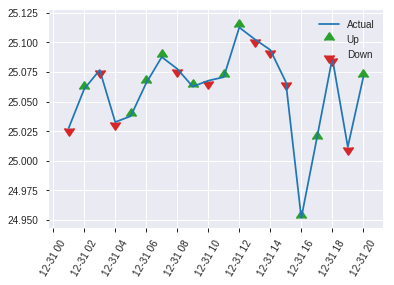


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.18108693352556757
RMSE: 0.42554310419223995
LogLoss: 0.5401008617337161
Mean Per-Class Error: 0.26596629914707726
AUC: 0.8052616719664775
pr_auc: 0.8012734328716881
Gini: 0.6105233439329549
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.41609811782836914: 


,0,1,Error,Rate
0,158.0,95.0,0.3755,(95.0/253.0)
1,44.0,222.0,0.1654,(44.0/266.0)
Total,202.0,317.0,0.2678,(139.0/519.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4160981,0.7615780,237.0
max f2,0.1786921,0.8601445,345.0
max f0point5,0.6024642,0.7577132,150.0
max accuracy,0.5048359,0.7341040,194.0
max precision,0.9195340,1.0,0.0
max recall,0.1069330,1.0,382.0
max specificity,0.9195340,1.0,0.0
max absolute_mcc,0.6024642,0.4706651,150.0
max min_per_class_accuracy,0.5054160,0.7312253,193.0
max mean_per_class_accuracy,0.5048359,0.7340337,194.0


Gains/Lift Table: Avg response rate: 51.25 %, avg score: 49.98 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0115607,0.9067958,1.6259398,1.6259398,0.8333333,0.9126194,0.8333333,0.9126194,0.0187970,0.0187970,62.5939850,62.5939850
,2,0.0211946,0.8842864,1.9511278,1.7737526,1.0,0.8975837,0.9090909,0.9057850,0.0187970,0.0375940,95.1127820,77.3752563
,3,0.0308285,0.8650156,1.9511278,1.8291823,1.0,0.8708655,0.9375,0.8948726,0.0187970,0.0563910,95.1127820,82.9182331
,4,0.0404624,0.8521522,1.9511278,1.8582170,1.0,0.8610476,0.9523810,0.8868191,0.0187970,0.0751880,95.1127820,85.8216971
,5,0.0500963,0.8348362,1.9511278,1.8760844,1.0,0.8436175,0.9615385,0.8785111,0.0187970,0.0939850,95.1127820,87.6084442
,6,0.1001927,0.7999239,1.8010411,1.8385628,0.9230769,0.8166240,0.9423077,0.8475675,0.0902256,0.1842105,80.1041064,83.8562753
,7,0.1502890,0.7719317,1.5759109,1.7510121,0.8076923,0.7867929,0.8974359,0.8273093,0.0789474,0.2631579,57.5910931,75.1012146
,8,0.2003854,0.7408900,1.3507808,1.6509543,0.6923077,0.7545911,0.8461538,0.8091298,0.0676692,0.3308271,35.0780798,65.0954309
,9,0.3005780,0.6786028,1.5759109,1.6259398,0.8076923,0.7095185,0.8333333,0.7759260,0.1578947,0.4887218,57.5910931,62.5939850
,10,0.4007707,0.6029892,1.3507808,1.5571501,0.6923077,0.6450865,0.7980769,0.7432161,0.1353383,0.6240602,35.0780798,55.7150087


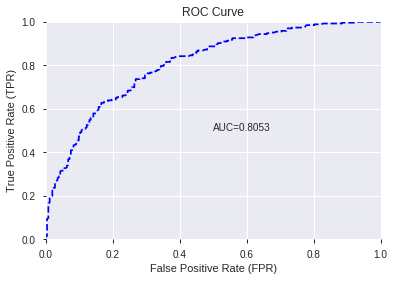

This function is available for GLM models only


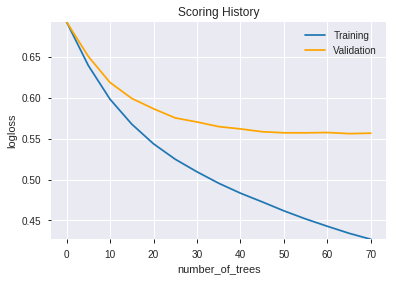

--2019-08-25 13:39:45--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.132.131
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.132.131|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip


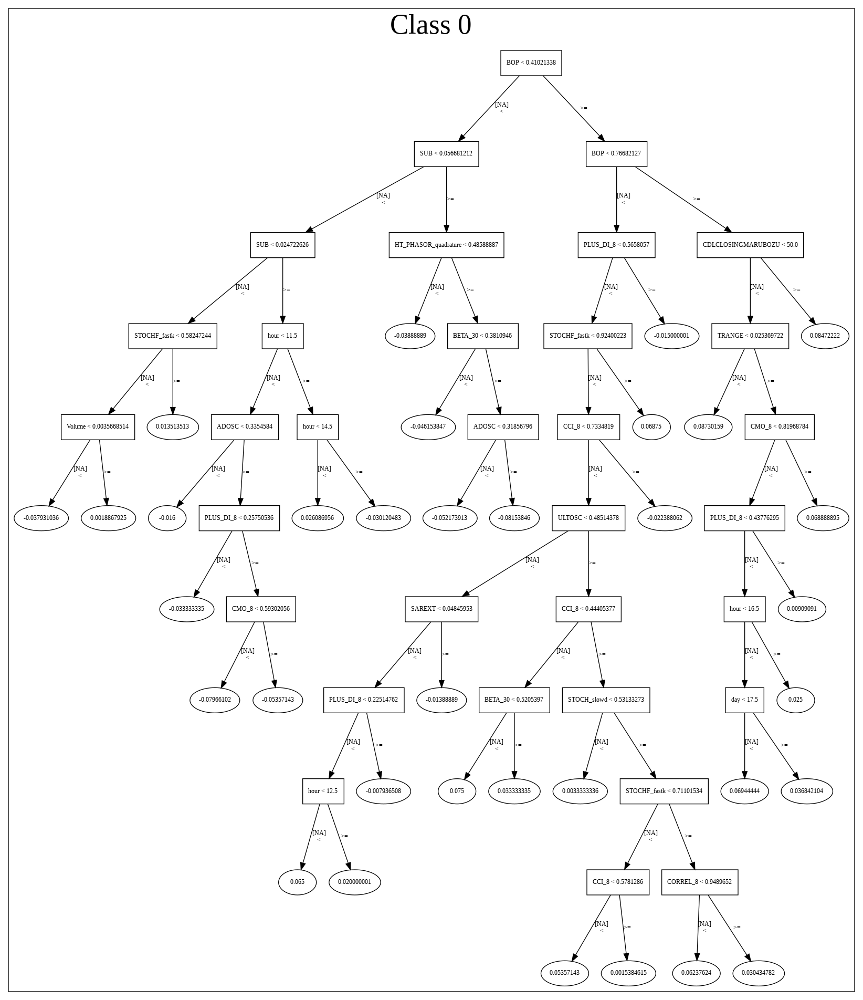

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_2_AutoML_20190825_133902',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_2_AutoML_20190825_133902',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_26_sid_9d08',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_26_sid_9d08',
   'type

['BOP',
 'STOCHF_fastk',
 'WILLR_8',
 'STOCHRSI_fastk',
 'hour',
 'CORREL_8',
 'CCI_8',
 'PLUS_DI_8',
 'DIV',
 'HT_PHASOR_quadrature',
 'PLUS_DM_8',
 'BETA_8',
 'BETA_30',
 'SUB',
 'STOCHRSI_fastd',
 'ULTOSC',
 'CORREL_24',
 'TRANGE',
 'SAREXT',
 'Volume',
 'ADOSC',
 'CORREL_20',
 'WILLR_12',
 'day',
 'CMO_8',
 'STOCH_slowd',
 'aroonup_8',
 'WILLR_14',
 'weekday_name',
 'CDLCLOSINGMARUBOZU',
 'CDLGRAVESTONEDOJI',
 'dayofweek',
 'CDLTAKURI',
 'HT_TRENDMODE',
 'CDLHAMMER',
 'weekday',
 'CDLENGULFING',
 'CDLSHORTLINE',
 'CDLLONGLINE',
 'days_in_month',
 'CDLBELTHOLD',
 'CDLDRAGONFLYDOJI',
 'CDLHANGINGMAN',
 'CDLHARAMI']

In [13]:
# XGBoost with top DeepLearning features
model_train(feature_name='DLF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190825_134042_model_1,0.782549,0.562733,0.298701,0.437305,0.191236


,variable,relative_importance,scaled_importance,percentage
0,BOP,0.381814,1.000000,5.117116e-02
1,CDLCLOSINGMARUBOZU,0.197132,0.516302,2.641979e-02
2,STOCHF_fastk,0.122889,0.321855,1.646971e-02
3,WILLR_8,0.115991,0.303789,1.554523e-02
4,SUB,0.087919,0.230267,1.178303e-02
5,CDLENGULFING,0.086750,0.227205,1.162635e-02
6,CDLGRAVESTONEDOJI,0.086212,0.225796,1.155425e-02
7,WILLR_12,0.082787,0.216826,1.109522e-02
8,TRANGE,0.081157,0.212555,1.087670e-02
9,DIV,0.079574,0.208410,1.066457e-02


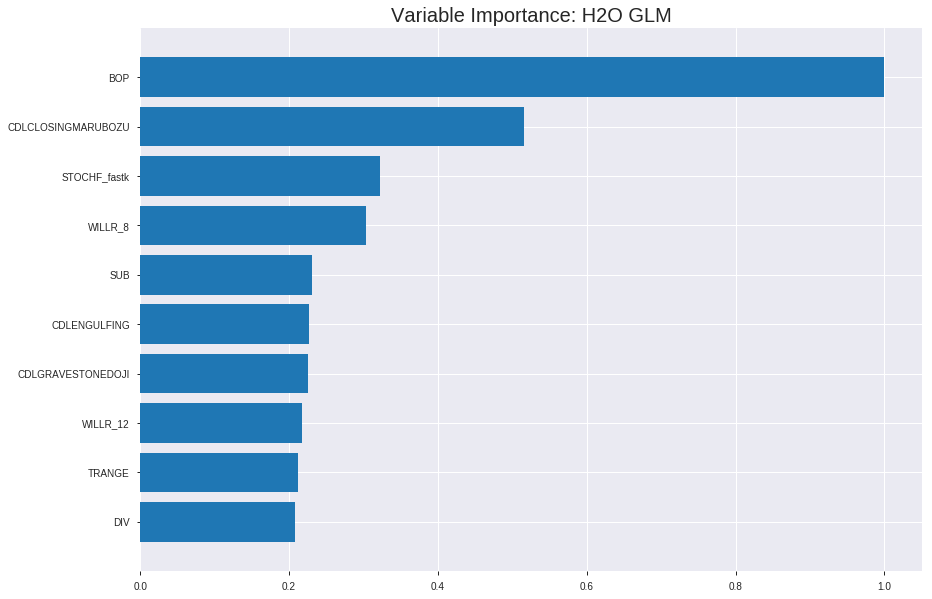

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190825_134042_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.18547952655620828
RMSE: 0.43067334089331355
LogLoss: 0.5522625284613113
Null degrees of freedom: 3627
Residual degrees of freedom: 2589
Null deviance: 5003.973061660213
Residual deviance: 4007.216906515275
AIC: 6085.216906515275
AUC: 0.7935601678596306
pr_auc: 0.8021109340141254
Gini: 0.5871203357192611
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4431450943564666: 


,0,1,Error,Rate
0,941.0,721.0,0.4338,(721.0/1662.0)
1,277.0,1689.0,0.1409,(277.0/1966.0)
Total,1218.0,2410.0,0.2751,(998.0/3628.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4431451,0.7719378,239.0
max f2,0.2769560,0.8681249,319.0
max f0point5,0.5670850,0.7535631,180.0
max accuracy,0.5068296,0.7364939,208.0
max precision,0.9568055,1.0,0.0
max recall,0.0580220,1.0,394.0
max specificity,0.9568055,1.0,0.0
max absolute_mcc,0.4988701,0.4672517,212.0
max min_per_class_accuracy,0.5612649,0.7262335,183.0
max mean_per_class_accuracy,0.5220708,0.7317248,201.0


Gains/Lift Table: Avg response rate: 54.19 %, avg score: 54.19 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101985,0.9008216,1.7456215,1.7456215,0.9459459,0.9203203,0.9459459,0.9203203,0.0178026,0.0178026,74.5621512,74.5621512
,2,0.0201213,0.8856116,1.8453713,1.7948132,1.0,0.8922359,0.9726027,0.9064704,0.0183113,0.0361139,84.5371312,79.4813194
,3,0.0300441,0.8722564,1.6915904,1.7607213,0.9166667,0.8794398,0.9541284,0.8975429,0.0167854,0.0528993,69.1590370,76.0721252
,4,0.0402426,0.8605983,1.4962470,1.6936970,0.8108108,0.8661266,0.9178082,0.8895812,0.0152594,0.0681587,49.6247010,69.3696958
,5,0.0501654,0.8487795,1.7428507,1.7034197,0.9444444,0.8541885,0.9230769,0.8825805,0.0172940,0.0854527,74.2850684,70.3419673
,6,0.1000551,0.8062516,1.5293132,1.6166063,0.8287293,0.8260796,0.8760331,0.8544079,0.0762970,0.1617497,52.9313242,61.6606274
,7,0.1502205,0.7690448,1.6121650,1.6151231,0.8736264,0.7875805,0.8752294,0.8320912,0.0808749,0.2426246,61.2165048,61.5123149
,8,0.2001103,0.7381374,1.4273590,1.5683114,0.7734807,0.7541573,0.8498623,0.8126614,0.0712106,0.3138352,42.7359026,56.8311432
,9,0.3001654,0.6824255,1.4183432,1.5183220,0.7685950,0.7094307,0.8227732,0.7782512,0.1419125,0.4557477,41.8343240,51.8322035
,10,0.3999449,0.6322416,1.2999163,1.4638335,0.7044199,0.6580773,0.7932460,0.7482698,0.1297050,0.5854527,29.9916256,46.3833481




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.19372227218802246
RMSE: 0.44013892373661123
LogLoss: 0.5728112020458875
Null degrees of freedom: 1035
Residual degrees of freedom: -3
Null deviance: 1446.188268020725
Residual deviance: 1186.864810639079
AIC: 3264.864810639079
AUC: 0.7797919928427645
pr_auc: 0.7508821866695454
Gini: 0.5595839856855289
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4297905610508666: 


,0,1,Error,Rate
0,289.0,237.0,0.4506,(237.0/526.0)
1,66.0,444.0,0.1294,(66.0/510.0)
Total,355.0,681.0,0.2925,(303.0/1036.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4297906,0.7455919,242.0
max f2,0.1961624,0.8380634,357.0
max f0point5,0.5751106,0.7270916,178.0
max accuracy,0.5751106,0.7297297,178.0
max precision,0.9331268,1.0,0.0
max recall,0.0558320,1.0,396.0
max specificity,0.9331268,1.0,0.0
max absolute_mcc,0.5732818,0.4592646,179.0
max min_per_class_accuracy,0.5667066,0.7235294,182.0
max mean_per_class_accuracy,0.5732818,0.7295758,179.0


Gains/Lift Table: Avg response rate: 49.23 %, avg score: 52.95 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0106178,0.8907386,1.6620321,1.6620321,0.8181818,0.9117762,0.8181818,0.9117762,0.0176471,0.0176471,66.2032086,66.2032086
,2,0.0202703,0.8747851,2.0313725,1.8379085,1.0,0.8822620,0.9047619,0.8977218,0.0196078,0.0372549,103.1372549,83.7908497
,3,0.0308880,0.8554551,2.0313725,1.9044118,1.0,0.8646644,0.9375,0.8863583,0.0215686,0.0588235,103.1372549,90.4411765
,4,0.0405405,0.8450466,1.8282353,1.8862745,0.9,0.8507643,0.9285714,0.8778836,0.0176471,0.0764706,82.8235294,88.6274510
,5,0.0501931,0.8363256,1.2188235,1.7579186,0.6,0.8410884,0.8653846,0.8708076,0.0117647,0.0882353,21.8823529,75.7918552
,6,0.1003861,0.7920947,1.6407240,1.6993213,0.8076923,0.8122792,0.8365385,0.8415434,0.0823529,0.1705882,64.0723982,69.9321267
,7,0.1505792,0.7668662,1.5625943,1.6537456,0.7692308,0.7799990,0.8141026,0.8210286,0.0784314,0.2490196,56.2594268,65.3745601
,8,0.2007722,0.7389913,1.4063348,1.5918929,0.6923077,0.7544715,0.7836538,0.8043893,0.0705882,0.3196078,40.6334842,59.1892911
,9,0.3001931,0.6779256,1.5777651,1.5872139,0.7766990,0.7095294,0.7813505,0.7729727,0.1568627,0.4764706,57.7765087,58.7213921
,10,0.4005792,0.6218164,1.1914781,1.4880416,0.5865385,0.6531631,0.7325301,0.7429481,0.1196078,0.5960784,19.1478130,48.8041578



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-08-25 13:40:49,0.000 sec,2,.22E2,984,1.3542465,1.3685970
,2019-08-25 13:40:53,4.042 sec,4,.16E2,996,1.3471784,1.3612476
,2019-08-25 13:40:57,8.027 sec,6,.12E2,1005,1.3384527,1.3522810
,2019-08-25 13:41:01,11.980 sec,8,.85E1,1018,1.3278385,1.3414262
,2019-08-25 13:41:05,16.032 sec,10,.62E1,1021,1.3151464,1.3285063
---,---,---,---,---,---,---,---
,2019-08-25 13:42:01,1 min 12.165 sec,38,.73E-1,1039,1.0963445,1.1482803
,2019-08-25 13:42:05,1 min 16.161 sec,40,.53E-1,1039,1.0892742,1.1541198
,2019-08-25 13:42:10,1 min 20.256 sec,42,.38E-1,1039,1.0831273,1.1630212
,2019-08-25 13:42:13,1 min 24.208 sec,44,.28E-1,1039,1.0777717,1.1748981



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.720616570327553)

('F1', 0.748768472906404)

('auc', 0.7825492585217986)

('logloss', 0.5627325572570461)

('mean_per_class_error', 0.2804763885999584)

('rmse', 0.4373048752131526)

('mse', 0.19123555388519098)

glm prediction progress: |████████████████████████████████████████████████| 100%


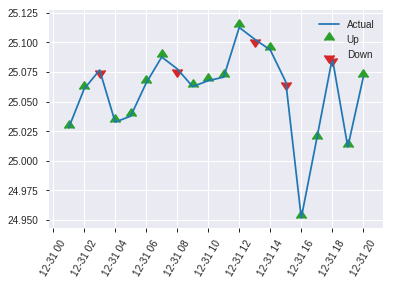


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.19123555388519098
RMSE: 0.4373048752131526
LogLoss: 0.5627325572570461
Null degrees of freedom: 518
Residual degrees of freedom: -520
Null deviance: 720.959908525584
Residual deviance: 584.116394432814
AIC: 2662.116394432814
AUC: 0.7825492585217986
pr_auc: 0.7699845650723761
Gini: 0.5650985170435971
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4514598400591383: 


,0,1,Error,Rate
0,138.0,115.0,0.4545,(115.0/253.0)
1,38.0,228.0,0.1429,(38.0/266.0)
Total,176.0,343.0,0.2948,(153.0/519.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4514598,0.7487685,255.0
max f2,0.1882378,0.8592737,362.0
max f0point5,0.6120528,0.7307061,176.0
max accuracy,0.5388536,0.7206166,211.0
max precision,0.9341408,1.0,0.0
max recall,0.1732799,1.0,370.0
max specificity,0.9341408,1.0,0.0
max absolute_mcc,0.5372272,0.4412008,212.0
max min_per_class_accuracy,0.5817890,0.7030075,193.0
max mean_per_class_accuracy,0.5388536,0.7195236,211.0


Gains/Lift Table: Avg response rate: 51.25 %, avg score: 54.48 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0115607,0.9114377,1.9511278,1.9511278,1.0,0.9233734,1.0,0.9233734,0.0225564,0.0225564,95.1127820,95.1127820
,2,0.0211946,0.8963060,1.5609023,1.7737526,0.8,0.9011433,0.9090909,0.9132688,0.0150376,0.0375940,56.0902256,77.3752563
,3,0.0308285,0.8815468,1.9511278,1.8291823,1.0,0.8908761,0.9375,0.9062711,0.0187970,0.0563910,95.1127820,82.9182331
,4,0.0404624,0.8593617,1.1706767,1.6723953,0.6,0.8710382,0.8571429,0.8978823,0.0112782,0.0676692,17.0676692,67.2395274
,5,0.0500963,0.8441019,1.5609023,1.6509543,0.8,0.8534920,0.8461538,0.8893457,0.0150376,0.0827068,56.0902256,65.0954309
,6,0.1001927,0.8026286,1.7259977,1.6884760,0.8846154,0.8179696,0.8653846,0.8536576,0.0864662,0.1691729,72.5997687,68.8475998
,7,0.1502890,0.7777110,1.6509543,1.6759688,0.8461538,0.7902769,0.8589744,0.8325307,0.0827068,0.2518797,65.0954309,67.5968768
,8,0.2003854,0.7569328,1.5008676,1.6321935,0.7692308,0.7691969,0.8365385,0.8166973,0.0751880,0.3270677,50.0867553,63.2193464
,9,0.3005780,0.7053457,1.3132591,1.5258820,0.6730769,0.7318142,0.7820513,0.7884029,0.1315789,0.4586466,31.3259109,52.5882013
,10,0.4007707,0.6474762,1.3132591,1.4727263,0.6730769,0.6757093,0.7548077,0.7602295,0.1315789,0.5902256,31.3259109,47.2726287


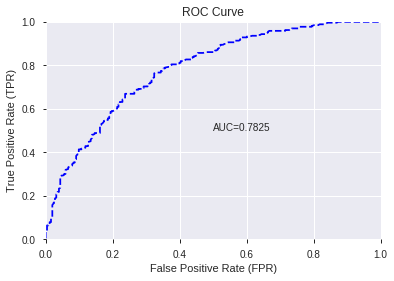

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


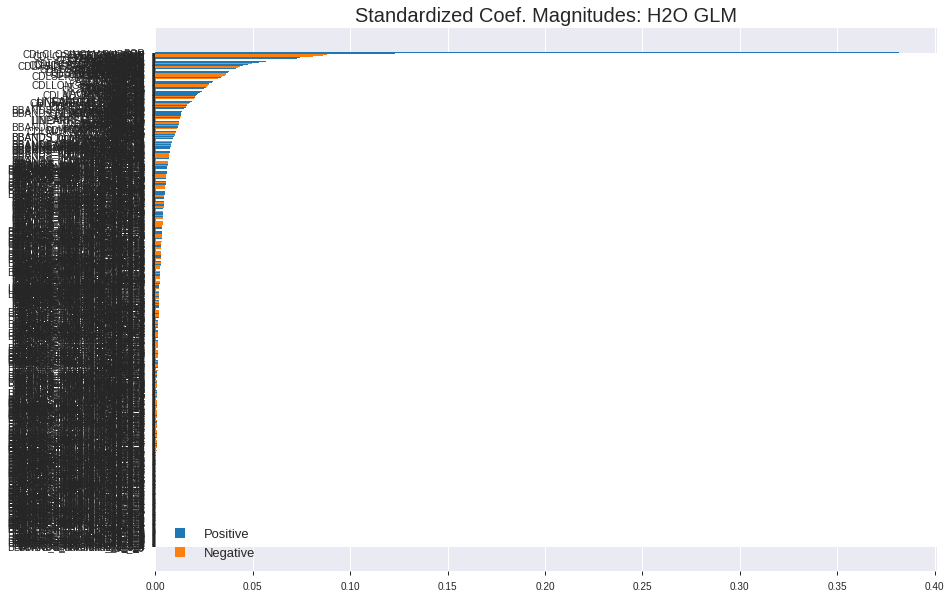

'log_likelihood'
--2019-08-25 13:42:43--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.171.139
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.171.139|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


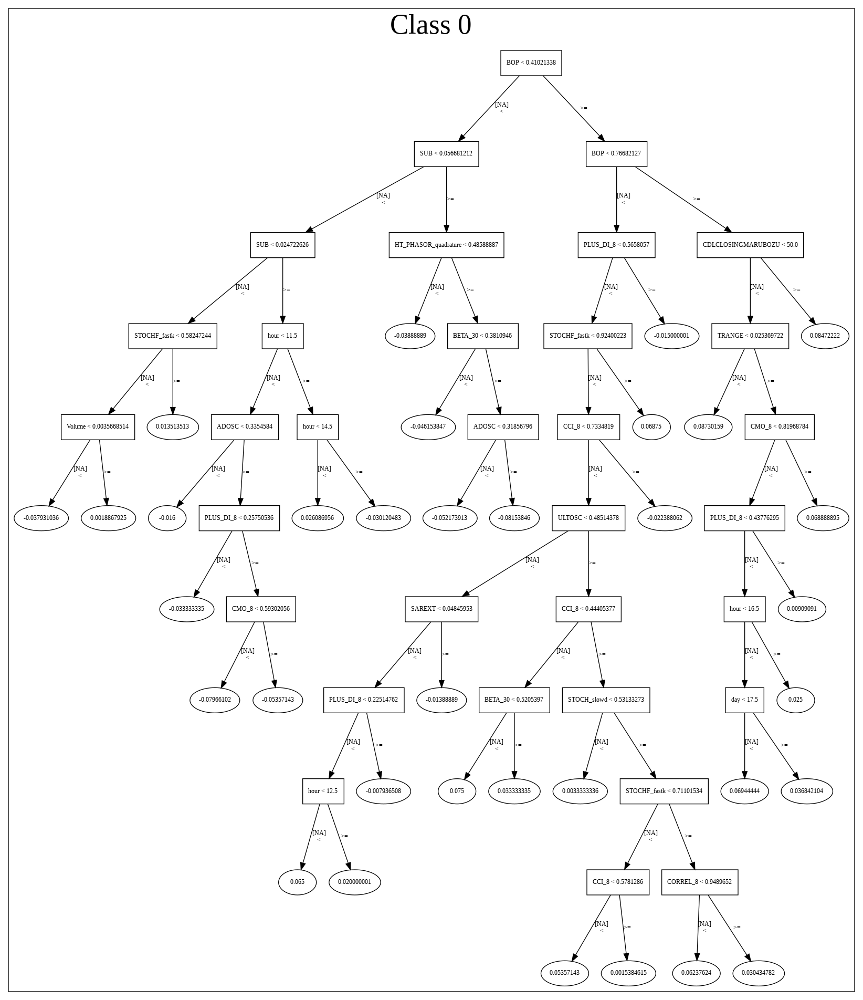

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190825_134042_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190825_134042_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_34_sid_9d08',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_34_s

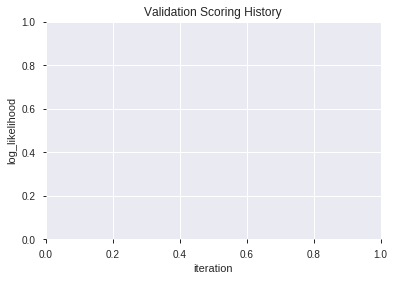

In [14]:
# GLM
glm_features = model_train(feature_name='All',model_algo="GLM")

In [15]:
# DeepLearning with top GLM features
model_train(feature_name='GLMF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

[]

In [16]:
# GLM with top GLM features
model_train(feature_name='GLMF',model_algo="GLM",features_list = features_list[:model_selected_features])

[]

In [17]:
# XGBoost with top GLM features
model_train(feature_name='GLMF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

[]

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_2_AutoML_20190825_134340,0.793879,0.557798,0.274503,0.434253,0.188575
1,XGBoost_grid_1_AutoML_20190825_134340_model_4,0.789808,0.558872,0.282118,0.434275,0.188595
2,XGBoost_1_AutoML_20190825_134340,0.789511,0.565395,0.281204,0.437304,0.191235
3,XGBoost_grid_1_AutoML_20190825_134340_model_7,0.786056,0.568417,0.290989,0.438447,0.192236
4,XGBoost_grid_1_AutoML_20190825_134340_model_2,0.785164,0.569526,0.286650,0.438816,0.192560
5,XGBoost_grid_1_AutoML_20190825_134340_model_6,0.784748,0.572653,0.282408,0.440869,0.194366
6,XGBoost_3_AutoML_20190825_134340,0.784548,0.569872,0.320106,0.439368,0.193044
7,XGBoost_grid_1_AutoML_20190825_134340_model_1,0.784466,0.566439,0.271947,0.437170,0.191117
8,XGBoost_grid_1_AutoML_20190825_134340_model_3,0.774414,0.578360,0.272140,0.443011,0.196259
9,XGBoost_grid_1_AutoML_20190825_134340_model_5,0.735349,0.616749,0.349267,0.462055,0.213494


,variable,relative_importance,scaled_importance,percentage
0,BOP,4255.125488,1.000000,0.207832
1,STOCHF_fastk,668.574097,0.157122,0.032655
2,STOCHRSI_fastk,474.975555,0.111624,0.023199
3,DIV,390.233582,0.091709,0.019060
4,WILLR_8,381.862823,0.089742,0.018651
5,SUB,343.266724,0.080671,0.016766
6,CDLCLOSINGMARUBOZU,341.695862,0.080302,0.016689
7,CCI_8,268.344421,0.063064,0.013107
8,hour,261.835510,0.061534,0.012789
9,ULTOSC,250.273819,0.058817,0.012224


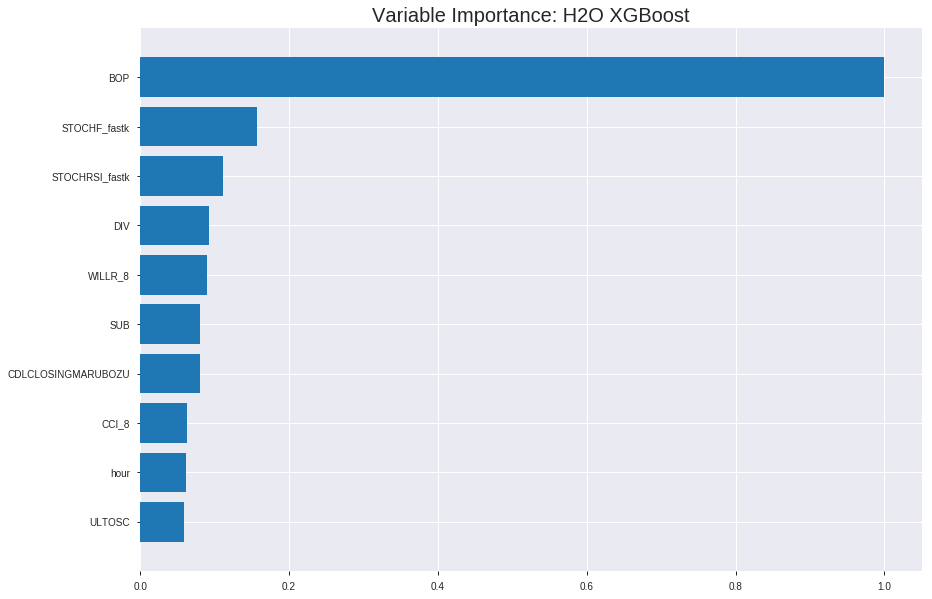

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_2_AutoML_20190825_134340


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.11113932992924884
RMSE: 0.3333756588733629
LogLoss: 0.3769685976297763
Mean Per-Class Error: 0.12324100563979967
AUC: 0.9504984250917828
pr_auc: 0.9572161537699072
Gini: 0.9009968501835657
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5442293167114258: 


,0,1,Error,Rate
0,1468.0,194.0,0.1167,(194.0/1662.0)
1,260.0,1706.0,0.1322,(260.0/1966.0)
Total,1728.0,1900.0,0.1251,(454.0/3628.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5442293,0.8825660,191.0
max f2,0.3598400,0.9234689,267.0
max f0point5,0.6261830,0.9126145,158.0
max accuracy,0.5442293,0.8748622,191.0
max precision,0.9505748,1.0,0.0
max recall,0.1742211,1.0,347.0
max specificity,0.9505748,1.0,0.0
max absolute_mcc,0.5968810,0.7515106,171.0
max min_per_class_accuracy,0.5385677,0.8728383,194.0
max mean_per_class_accuracy,0.5968810,0.8767590,171.0


Gains/Lift Table: Avg response rate: 54.19 %, avg score: 54.07 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101985,0.9302493,1.8453713,1.8453713,1.0,0.9373761,1.0,0.9373761,0.0188199,0.0188199,84.5371312,84.5371312
,2,0.0201213,0.9216928,1.8453713,1.8453713,1.0,0.9262522,1.0,0.9318904,0.0183113,0.0371312,84.5371312,84.5371312
,3,0.0300441,0.9125816,1.8453713,1.8453713,1.0,0.9171506,1.0,0.9270222,0.0183113,0.0554425,84.5371312,84.5371312
,4,0.0402426,0.9050465,1.8453713,1.8453713,1.0,0.9087821,1.0,0.9223997,0.0188199,0.0742625,84.5371312,84.5371312
,5,0.0501654,0.8976111,1.8453713,1.8453713,1.0,0.9008429,1.0,0.9181357,0.0183113,0.0925738,84.5371312,84.5371312
,6,0.1000551,0.8652369,1.8249805,1.8352040,0.9889503,0.8810615,0.9944904,0.8996497,0.0910478,0.1836216,82.4980469,83.5203977
,7,0.1502205,0.8361817,1.8250925,1.8318273,0.9890110,0.8508573,0.9926606,0.8833557,0.0915565,0.2751780,82.5092507,83.1827303
,8,0.2001103,0.8078483,1.8351759,1.8326621,0.9944751,0.8218092,0.9931129,0.8680115,0.0915565,0.3667345,83.5175891,83.2662143
,9,0.3001654,0.7521576,1.7945346,1.8199530,0.9724518,0.7780544,0.9862259,0.8380258,0.1795524,0.5462869,79.4534637,81.9952975
,10,0.3999449,0.6733457,1.6771469,1.7843253,0.9088398,0.7142088,0.9669194,0.8071355,0.1673449,0.7136317,67.7146856,78.4325259




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.18665255374021947
RMSE: 0.43203304704642614
LogLoss: 0.5544844546953184
Mean Per-Class Error: 0.2691754268247223
AUC: 0.7927048385894281
pr_auc: 0.7708599292183512
Gini: 0.5854096771788562
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.34540048241615295: 


,0,1,Error,Rate
0,255.0,271.0,0.5152,(271.0/526.0)
1,53.0,457.0,0.1039,(53.0/510.0)
Total,308.0,728.0,0.3127,(324.0/1036.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3454005,0.7382876,269.0
max f2,0.2082782,0.8416352,330.0
max f0point5,0.6410938,0.7321594,142.0
max accuracy,0.5620619,0.7306950,178.0
max precision,0.9451453,1.0,0.0
max recall,0.0846587,1.0,393.0
max specificity,0.9451453,1.0,0.0
max absolute_mcc,0.5437342,0.4616156,187.0
max min_per_class_accuracy,0.5492119,0.7294118,183.0
max mean_per_class_accuracy,0.5437342,0.7308246,187.0


Gains/Lift Table: Avg response rate: 49.23 %, avg score: 51.75 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0106178,0.9120433,1.8467023,1.8467023,0.9090909,0.9268044,0.9090909,0.9268044,0.0196078,0.0196078,84.6702317,84.6702317
,2,0.0202703,0.8968544,2.0313725,1.9346405,1.0,0.9047666,0.9523810,0.9163103,0.0196078,0.0392157,103.1372549,93.4640523
,3,0.0308880,0.8830158,2.0313725,1.9678922,1.0,0.8892950,0.96875,0.9070238,0.0215686,0.0607843,103.1372549,96.7892157
,4,0.0405405,0.8722456,1.8282353,1.9346405,0.9,0.8748858,0.9523810,0.8993719,0.0176471,0.0784314,82.8235294,93.4640523
,5,0.0501931,0.8580267,2.0313725,1.9532428,1.0,0.8648319,0.9615385,0.8927296,0.0196078,0.0980392,103.1372549,95.3242836
,6,0.1003861,0.8121264,1.5235294,1.7383861,0.75,0.8314057,0.8557692,0.8620676,0.0764706,0.1745098,52.3529412,73.8386124
,7,0.1505792,0.7886154,1.5625943,1.6797888,0.7692308,0.7984627,0.8269231,0.8408660,0.0784314,0.2529412,56.2594268,67.9788839
,8,0.2007722,0.7602824,1.6407240,1.6700226,0.8076923,0.7748582,0.8221154,0.8243640,0.0823529,0.3352941,64.0723982,67.0022624
,9,0.3001931,0.7047901,1.5580430,1.6329361,0.7669903,0.7337369,0.8038585,0.7943493,0.1549020,0.4901961,55.8043023,63.2936133
,10,0.4005792,0.6400886,1.3282051,1.5565698,0.6538462,0.6691736,0.7662651,0.7629799,0.1333333,0.6235294,32.8205128,55.6569809



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-25 13:43:49,0.003 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4581036,0.5,0.6931472,0.5,0.0,1.0,0.5077220
,2019-08-25 13:43:50,1.661 sec,5.0,0.4702724,0.6350763,0.8446683,0.8466245,1.7456215,0.2530320,0.4799893,0.6537071,0.7540968,0.7171325,2.0313725,0.3050193
,2019-08-25 13:43:52,2.922 sec,10.0,0.4479722,0.5925331,0.8600883,0.8759881,1.8453713,0.2560639,0.4648003,0.6240403,0.7679341,0.7392489,2.0313725,0.2944015
,2019-08-25 13:43:53,4.206 sec,15.0,0.4309040,0.5598584,0.8699264,0.8877738,1.8453713,0.2147189,0.4554260,0.6053252,0.7725360,0.7489574,2.0313725,0.2789575
,2019-08-25 13:43:54,5.561 sec,20.0,0.4173522,0.5336810,0.8777220,0.8939128,1.7954964,0.2138920,0.4478314,0.5898793,0.7803474,0.7579953,2.0313725,0.2837838
,2019-08-25 13:43:55,6.814 sec,25.0,0.4058923,0.5112494,0.8860814,0.9028446,1.8453713,0.2061742,0.4431281,0.5797729,0.7819336,0.7592532,2.0313725,0.2750965
,2019-08-25 13:43:57,8.084 sec,30.0,0.3964984,0.4927842,0.8925563,0.9086067,1.8453713,0.1981808,0.4406707,0.5743204,0.7828841,0.7605289,2.0313725,0.2847490
,2019-08-25 13:43:58,9.433 sec,35.0,0.3879741,0.4761461,0.8999206,0.9152514,1.8453713,0.1910143,0.4382734,0.5689459,0.7856837,0.7646524,2.0313725,0.2857143
,2019-08-25 13:44:00,11.024 sec,40.0,0.3801829,0.4611968,0.9076409,0.9209953,1.8453713,0.1821940,0.4373529,0.5666576,0.7856706,0.7641770,2.0313725,0.2847490
,2019-08-25 13:44:01,12.422 sec,45.0,0.3735609,0.4484611,0.9133883,0.9250560,1.8453713,0.1766814,0.4350940,0.5618300,0.7889007,0.7673730,2.0313725,0.2779923


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,4255.1254883,1.0,0.2078319
STOCHF_fastk,668.5740967,0.1571221,0.0326550
STOCHRSI_fastk,474.9755554,0.1116243,0.0231991
DIV,390.2335815,0.0917091,0.0190601
WILLR_8,381.8628235,0.0897418,0.0186512
---,---,---,---
BBANDS_upperband_12_7_5,1.5267487,0.0003588,0.0000746
BBANDS_upperband_24_5_4,1.3553581,0.0003185,0.0000662
BBANDS_upperband_30_6_5,1.2423477,0.0002920,0.0000607
BBANDS_lowerband_24_0_4,0.6407547,0.0001506,0.0000313



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7360308285163777)

('F1', 0.7597955706984667)

('auc', 0.7938794614995988)

('logloss', 0.557798158044578)

('mean_per_class_error', 0.2650524532675562)

('rmse', 0.4342526374380145)

('mse', 0.18857535312187168)

xgboost prediction progress: |████████████████████████████████████████████| 100%


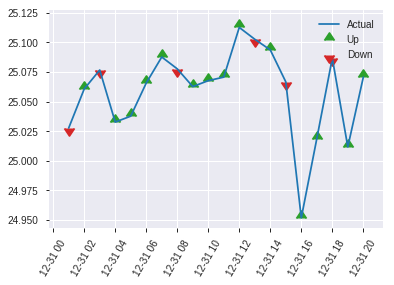


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.18857535312187168
RMSE: 0.4342526374380145
LogLoss: 0.557798158044578
Mean Per-Class Error: 0.2650524532675562
AUC: 0.7938794614995988
pr_auc: 0.7927352841918847
Gini: 0.5877589229991975
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5006352663040161: 


,0,1,Error,Rate
0,155.0,98.0,0.3874,(98.0/253.0)
1,43.0,223.0,0.1617,(43.0/266.0)
Total,198.0,321.0,0.2717,(141.0/519.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5006353,0.7597956,233.0
max f2,0.2279707,0.8543046,339.0
max f0point5,0.6715630,0.7444062,156.0
max accuracy,0.5881301,0.7360308,200.0
max precision,0.9225178,1.0,0.0
max recall,0.1402071,1.0,380.0
max specificity,0.9225178,1.0,0.0
max absolute_mcc,0.5821801,0.4722136,202.0
max min_per_class_accuracy,0.6233521,0.7272727,183.0
max mean_per_class_accuracy,0.5881301,0.7349475,200.0


Gains/Lift Table: Avg response rate: 51.25 %, avg score: 55.68 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0115607,0.9026098,1.6259398,1.6259398,0.8333333,0.9144009,0.8333333,0.9144009,0.0187970,0.0187970,62.5939850,62.5939850
,2,0.0211946,0.8733707,1.9511278,1.7737526,1.0,0.8809083,0.9090909,0.8991770,0.0187970,0.0375940,95.1127820,77.3752563
,3,0.0308285,0.8617369,1.9511278,1.8291823,1.0,0.8655812,0.9375,0.8886783,0.0187970,0.0563910,95.1127820,82.9182331
,4,0.0404624,0.8564032,1.9511278,1.8582170,1.0,0.8592314,0.9523810,0.8816671,0.0187970,0.0751880,95.1127820,85.8216971
,5,0.0500963,0.8515874,1.9511278,1.8760844,1.0,0.8552364,0.9615385,0.8765843,0.0187970,0.0939850,95.1127820,87.6084442
,6,0.1001927,0.8220571,1.8760844,1.8760844,0.9615385,0.8383375,0.9615385,0.8574609,0.0939850,0.1879699,87.6084442,87.6084442
,7,0.1502890,0.8027824,1.4258242,1.7259977,0.7307692,0.8116039,0.8846154,0.8421752,0.0714286,0.2593985,42.5824176,72.5997687
,8,0.2003854,0.7782709,1.5008676,1.6697152,0.7692308,0.7911409,0.8557692,0.8294166,0.0751880,0.3345865,50.0867553,66.9715153
,9,0.3005780,0.7409284,1.2757374,1.5383892,0.6538462,0.7603949,0.7884615,0.8064094,0.1278195,0.4624060,27.5737420,53.8389242
,10,0.4007707,0.6889590,1.5008676,1.5290088,0.7692308,0.7141446,0.7836538,0.7833432,0.1503759,0.6127820,50.0867553,52.9008820


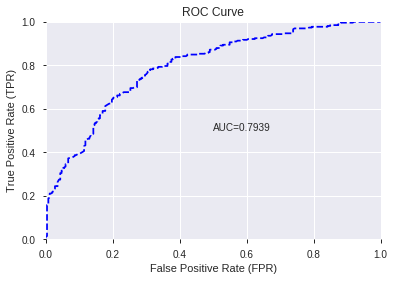

This function is available for GLM models only


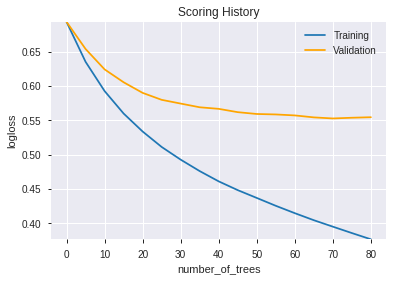

--2019-08-25 13:45:32--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.82.120
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.82.120|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip


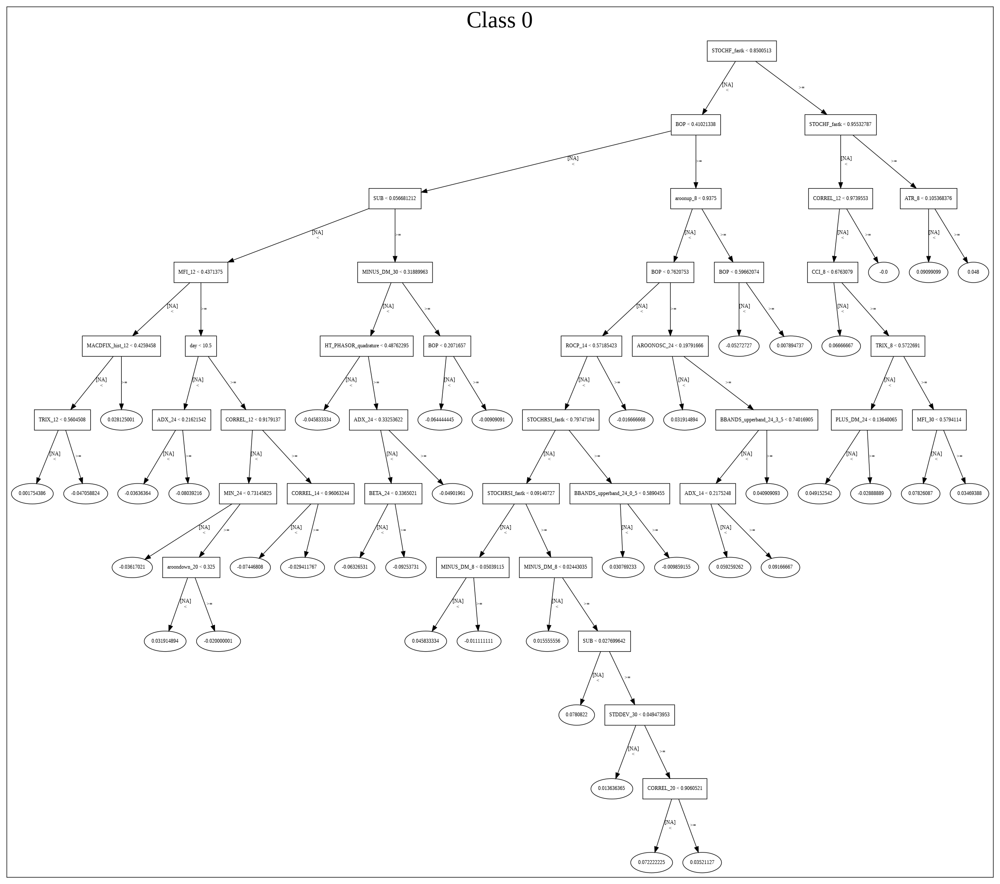

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_2_AutoML_20190825_134340',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_2_AutoML_20190825_134340',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_42_sid_9d08',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_42_sid_9d08',
   'type

In [18]:
# XGBoost
xgb_features = model_train(feature_name='All',model_algo="XGBoost")

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190825_134629_model_5,0.787973,0.567596,0.253581,0.439584,0.193234
1,DeepLearning_grid_1_AutoML_20190825_134629_model_8,0.784778,0.567247,0.300871,0.438092,0.191925
2,DeepLearning_grid_1_AutoML_20190825_134629_model_3,0.784481,0.611504,0.278069,0.443487,0.196680
3,DeepLearning_grid_1_AutoML_20190825_134629_model_6,0.781985,0.573419,0.273827,0.438627,0.192393
4,DeepLearning_grid_1_AutoML_20190825_134629_model_9,0.778589,0.563953,0.279949,0.437345,0.191271
5,DeepLearning_1_AutoML_20190825_134629,0.766969,0.576339,0.311956,0.443916,0.197061
6,DeepLearning_grid_1_AutoML_20190825_134629_model_4,0.761048,0.616244,0.307186,0.454573,0.206637
7,DeepLearning_grid_1_AutoML_20190825_134629_model_7,0.745453,0.710684,0.333264,0.473142,0.223864
8,DeepLearning_grid_1_AutoML_20190825_134629_model_2,0.743321,0.756220,0.320537,0.483974,0.234231
9,DeepLearning_grid_1_AutoML_20190825_134629_model_1,0.735438,0.943610,0.380457,0.508856,0.258934


,variable,relative_importance,scaled_importance,percentage
0,BOP,1.000000,1.000000,0.042489
1,CDLCLOSINGMARUBOZU,0.825800,0.825800,0.035088
2,HT_TRENDMODE,0.548895,0.548895,0.023322
3,days_in_month,0.547593,0.547593,0.023267
4,CDLHANGINGMAN,0.535303,0.535303,0.022745
5,SAREXT,0.514381,0.514381,0.021856
6,weekday_name,0.508341,0.508341,0.021599
7,day,0.505977,0.505977,0.021499
8,DIV,0.503179,0.503179,0.021380
9,TRANGE,0.497440,0.497440,0.021136


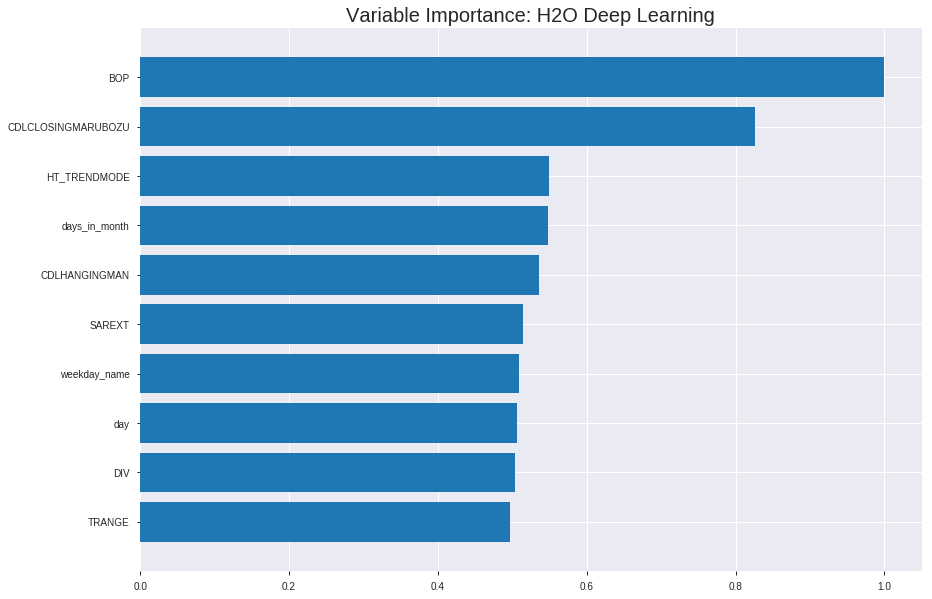

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190825_134629_model_5


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.18265811196969872
RMSE: 0.42738520326480506
LogLoss: 0.5416401009383169
Mean Per-Class Error: 0.2670877235506621
AUC: 0.8134595279804817
pr_auc: 0.8286940792123918
Gini: 0.6269190559609634
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4710004750948193: 


,0,1,Error,Rate
0,734.0,928.0,0.5584,(928.0/1662.0)
1,127.0,1839.0,0.0646,(127.0/1966.0)
Total,861.0,2767.0,0.2908,(1055.0/3628.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4710005,0.7770970,254.0
max f2,0.2924975,0.8756552,319.0
max f0point5,0.6394663,0.7611823,152.0
max accuracy,0.5724666,0.7370452,200.0
max precision,0.9840596,1.0,0.0
max recall,0.0750701,1.0,391.0
max specificity,0.9840596,1.0,0.0
max absolute_mcc,0.5724666,0.4687849,200.0
max min_per_class_accuracy,0.6030068,0.7304171,179.0
max mean_per_class_accuracy,0.6064678,0.7329123,177.0


Gains/Lift Table: Avg response rate: 54.19 %, avg score: 58.15 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101985,0.9577710,1.8453713,1.8453713,1.0,0.9687297,1.0,0.9687297,0.0188199,0.0188199,84.5371312,84.5371312
,2,0.0201213,0.9461679,1.8453713,1.8453713,1.0,0.9529140,1.0,0.9609302,0.0183113,0.0371312,84.5371312,84.5371312
,3,0.0300441,0.9386115,1.7941110,1.8284413,0.9722222,0.9429665,0.9908257,0.9549972,0.0178026,0.0549339,79.4110998,82.8441300
,4,0.0402426,0.9291252,1.4463721,1.7316155,0.7837838,0.9338809,0.9383562,0.9496458,0.0147508,0.0696846,44.6372110,73.1615546
,5,0.0501654,0.9187747,1.6915904,1.7236985,0.9166667,0.9235655,0.9340659,0.9444871,0.0167854,0.0864700,69.1590370,72.3698479
,6,0.1000551,0.8541580,1.7434171,1.7335306,0.9447514,0.8908763,0.9393939,0.9177555,0.0869786,0.1734486,74.3417096,73.3530627
,7,0.1502205,0.7741112,1.5918862,1.6862292,0.8626374,0.8131117,0.9137615,0.8828102,0.0798576,0.2533062,59.1886242,68.6229199
,8,0.2001103,0.7307662,1.5700949,1.6572756,0.8508287,0.7514583,0.8980716,0.8500627,0.0783316,0.3316378,57.0094929,65.7275614
,9,0.3001654,0.6776679,1.3776739,1.5640750,0.7465565,0.7012162,0.8475666,0.8004472,0.1378433,0.4694812,37.7673900,56.4075042
,10,0.3999449,0.6361946,1.3152094,1.5019873,0.7127072,0.6557325,0.8139214,0.7643433,0.1312309,0.6007121,31.5209388,50.1987264




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.1992633989728493
RMSE: 0.4463892908357562
LogLoss: 0.5848626204757872
Mean Per-Class Error: 0.2727055841347946
AUC: 0.777014836352792
pr_auc: 0.7453000073152812
Gini: 0.554029672705584
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5416221084802783: 


,0,1,Error,Rate
0,328.0,198.0,0.3764,(198.0/526.0)
1,87.0,423.0,0.1706,(87.0/510.0)
Total,415.0,621.0,0.2751,(285.0/1036.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5416221,0.7480106,212.0
max f2,0.2090338,0.8400402,348.0
max f0point5,0.5998326,0.7197273,175.0
max accuracy,0.5646043,0.7258687,200.0
max precision,0.9794941,1.0,0.0
max recall,0.0692649,1.0,395.0
max specificity,0.9794941,1.0,0.0
max absolute_mcc,0.5416221,0.4621605,212.0
max min_per_class_accuracy,0.5948658,0.7196078,179.0
max mean_per_class_accuracy,0.5461174,0.7272944,209.0


Gains/Lift Table: Avg response rate: 49.23 %, avg score: 55.00 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0106178,0.9515102,2.0313725,2.0313725,1.0,0.9625717,1.0,0.9625717,0.0215686,0.0215686,103.1372549,103.1372549
,2,0.0202703,0.9392768,1.8282353,1.9346405,0.9,0.9460215,0.9523810,0.9546906,0.0176471,0.0392157,82.8235294,93.4640523
,3,0.0308880,0.9279523,1.6620321,1.8409314,0.8181818,0.9330487,0.90625,0.9472512,0.0176471,0.0568627,66.2032086,84.0931373
,4,0.0405405,0.9072598,1.8282353,1.8379085,0.9,0.9164663,0.9047619,0.9399215,0.0176471,0.0745098,82.8235294,83.7908497
,5,0.0501931,0.8880711,1.4219608,1.7579186,0.7,0.8999220,0.8653846,0.9322293,0.0137255,0.0882353,42.1960784,75.7918552
,6,0.1003861,0.8067609,1.5235294,1.6407240,0.75,0.8447807,0.8076923,0.8885050,0.0764706,0.1647059,52.3529412,64.0723982
,7,0.1505792,0.7474946,1.5235294,1.6016591,0.75,0.7704246,0.7884615,0.8491448,0.0764706,0.2411765,52.3529412,60.1659125
,8,0.2007722,0.7159806,1.6797888,1.6211916,0.8269231,0.7323826,0.7980769,0.8199543,0.0843137,0.3254902,67.9788839,62.1191554
,9,0.3001931,0.6612858,1.3411003,1.5284282,0.6601942,0.6858336,0.7524116,0.7755349,0.1333333,0.4588235,34.1100324,52.8428220
,10,0.4005792,0.6279940,1.3868024,1.4929365,0.6826923,0.6427254,0.7349398,0.7422525,0.1392157,0.5980392,38.6802413,49.2936452



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-25 13:51:05,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-08-25 13:51:07,2 min 12.320 sec,1264 obs/sec,0.6617971,1,2401.0,0.4456313,0.5821869,0.2000342,0.7759246,0.7912244,1.8453713,0.2918964,0.4480634,0.5874910,0.1967651,0.7706665,0.7290241,1.8467023,0.2799228
,2019-08-25 13:51:20,2 min 26.205 sec,2332 obs/sec,9.2761852,14,33654.0,0.4273852,0.5416401,0.2642013,0.8134595,0.8286941,1.8453713,0.2907938,0.4463893,0.5848626,0.2027562,0.7770148,0.7453000,2.0313725,0.2750965
,2019-08-25 13:51:35,2 min 40.332 sec,2558 obs/sec,19.1841235,29,69600.0,0.4048519,0.4935807,0.3397440,0.8453236,0.8628486,1.8453713,0.2552370,0.4449525,0.5863442,0.2078801,0.7657813,0.7331826,1.8467023,0.3030888
,2019-08-25 13:51:48,2 min 53.903 sec,2681 obs/sec,29.1444322,44,105736.0,0.3863752,0.4542444,0.3986346,0.8690408,0.8794726,1.8453713,0.2307056,0.4503704,0.6102688,0.1884725,0.7586110,0.7241655,1.8467023,0.2895753
,2019-08-25 13:52:02,3 min 7.985 sec,2768 obs/sec,39.7968578,60,144383.0,0.3718938,0.4219400,0.4428684,0.8902277,0.8974805,1.8453713,0.2025910,0.4612503,0.6474508,0.1487896,0.7470010,0.7061315,1.6620321,0.2972973
,2019-08-25 13:52:16,3 min 22.035 sec,2819 obs/sec,50.3867144,76,182803.0,0.3497420,0.3796684,0.5072625,0.9166497,0.9115723,1.8453713,0.1805402,0.4585366,0.6594814,0.1587761,0.7539160,0.7089406,1.6620321,0.3088803
,2019-08-25 13:52:18,3 min 23.455 sec,2818 obs/sec,50.3867144,76,182803.0,0.4273852,0.5416401,0.2642013,0.8134595,0.8286941,1.8453713,0.2907938,0.4463893,0.5848626,0.2027562,0.7770148,0.7453000,2.0313725,0.2750965


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1.0,1.0,0.0424891
CDLCLOSINGMARUBOZU,0.8258002,0.8258002,0.0350875
HT_TRENDMODE,0.5488954,0.5488954,0.0233221
days_in_month,0.5475934,0.5475934,0.0232668
CDLHANGINGMAN,0.5353028,0.5353028,0.0227445
---,---,---,---
CMO_8,0.3940554,0.3940554,0.0167431
CDLHAMMER,0.3874632,0.3874632,0.0164630
CDL3OUTSIDE,0.3727042,0.3727042,0.0158359
is_month_end,0.3431079,0.3431079,0.0145784



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7475915221579962)

('F1', 0.7631103074141049)

('auc', 0.7879728966685489)

('logloss', 0.5675955609250412)

('mean_per_class_error', 0.2535810871051145)

('rmse', 0.43958441362091866)

('mse', 0.1932344566984469)

deeplearning prediction progress: |███████████████████████████████████████| 100%


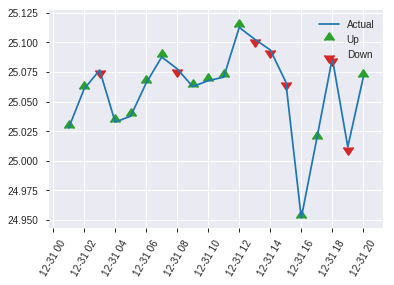


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.1932344566984469
RMSE: 0.43958441362091866
LogLoss: 0.5675955609250412
Mean Per-Class Error: 0.2535810871051145
AUC: 0.7879728966685489
pr_auc: 0.775756805609271
Gini: 0.5759457933370977
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5549867209622387: 


,0,1,Error,Rate
0,177.0,76.0,0.3004,(76.0/253.0)
1,55.0,211.0,0.2068,(55.0/266.0)
Total,232.0,287.0,0.2524,(131.0/519.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5549867,0.7631103,211.0
max f2,0.1697221,0.8582575,359.0
max f0point5,0.5736869,0.7466063,196.0
max accuracy,0.5549867,0.7475915,211.0
max precision,0.8996100,0.9615385,22.0
max recall,0.1440976,1.0,372.0
max specificity,0.9708812,0.9960474,0.0
max absolute_mcc,0.5549867,0.4954732,211.0
max min_per_class_accuracy,0.5745957,0.7351779,195.0
max mean_per_class_accuracy,0.5549867,0.7464189,211.0


Gains/Lift Table: Avg response rate: 51.25 %, avg score: 53.97 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0115607,0.9494005,1.6259398,1.6259398,0.8333333,0.9619463,0.8333333,0.9619463,0.0187970,0.0187970,62.5939850,62.5939850
,2,0.0211946,0.9368648,1.9511278,1.7737526,1.0,0.9428713,0.9090909,0.9532758,0.0187970,0.0375940,95.1127820,77.3752563
,3,0.0308285,0.9289540,1.9511278,1.8291823,1.0,0.9346330,0.9375,0.9474499,0.0187970,0.0563910,95.1127820,82.9182331
,4,0.0404624,0.9130346,1.9511278,1.8582170,1.0,0.9225906,0.9523810,0.9415311,0.0187970,0.0751880,95.1127820,85.8216971
,5,0.0500963,0.8941216,1.9511278,1.8760844,1.0,0.9081164,0.9615385,0.9351052,0.0187970,0.0939850,95.1127820,87.6084442
,6,0.1001927,0.7851346,1.5008676,1.6884760,0.7692308,0.8382718,0.8653846,0.8866885,0.0751880,0.1691729,50.0867553,68.8475998
,7,0.1502890,0.7462142,1.5008676,1.6259398,0.7692308,0.7662644,0.8333333,0.8465471,0.0751880,0.2443609,50.0867553,62.5939850
,8,0.2003854,0.6957085,1.5759109,1.6134326,0.8076923,0.7157535,0.8269231,0.8138487,0.0789474,0.3233083,57.5910931,61.3432620
,9,0.3005780,0.6467717,1.4633459,1.5634037,0.75,0.6668919,0.8012821,0.7648631,0.1466165,0.4699248,46.3345865,56.3403702
,10,0.4007707,0.6133575,1.2382157,1.4821067,0.6346154,0.6304754,0.7596154,0.7312662,0.1240602,0.5939850,23.8215732,48.2106709


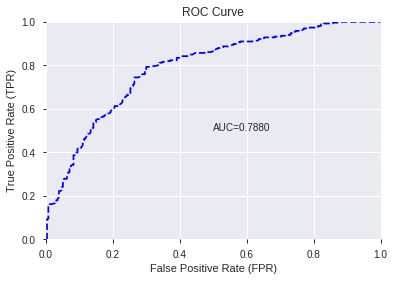

This function is available for GLM models only


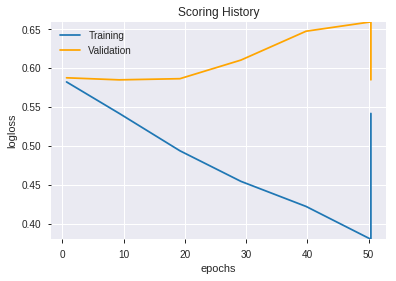

--2019-08-25 14:03:26--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.108.203
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.108.203|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


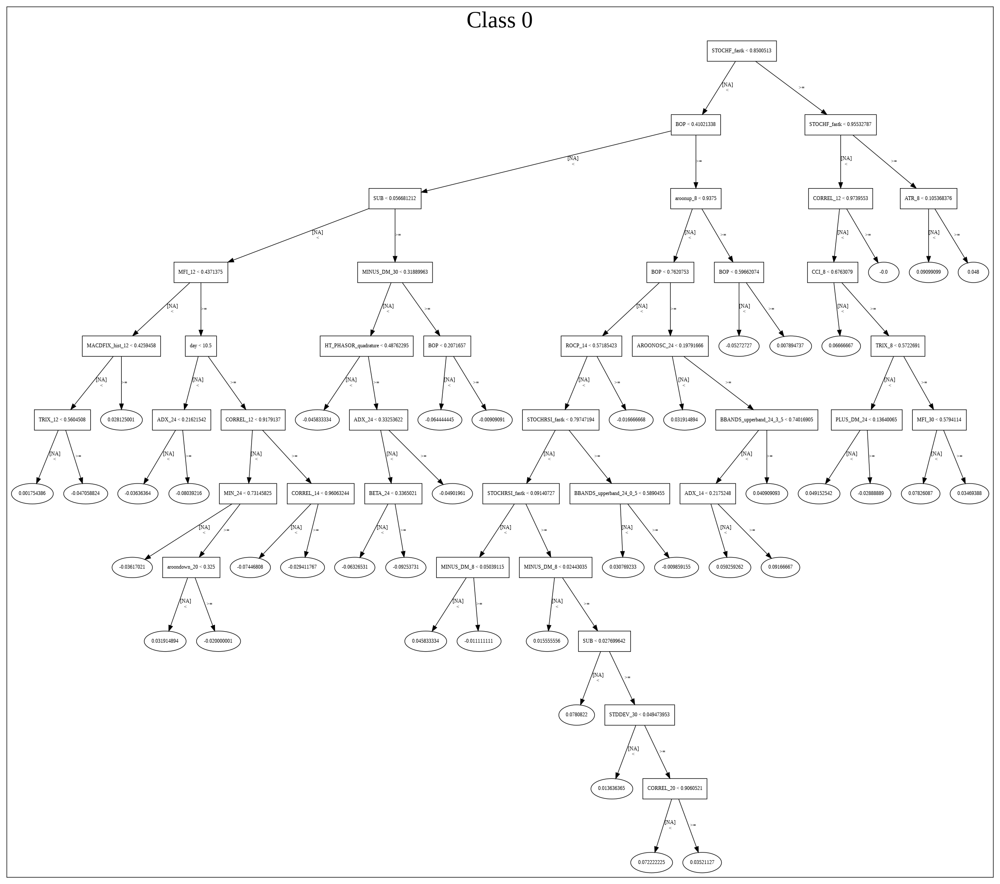

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190825_134629_model_5',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190825_134629_model_5',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_50_sid_9d08',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['BOP',
 'CDLCLOSINGMARUBOZU',
 'HT_TRENDMODE',
 'days_in_month',
 'CDLHANGINGMAN',
 'SAREXT',
 'weekday_name',
 'day',
 'DIV',
 'TRANGE',
 'HT_PHASOR_quadrature',
 'CDLLONGLINE',
 'CCI_8',
 'WILLR_8',
 'hour',
 'CORREL_8',
 'aroonup_8',
 'CDLSHORTLINE',
 'dayofweek',
 'PLUS_DI_8',
 'SUB',
 'ADOSC',
 'STOCHRSI_fastk',
 'weekday',
 'STOCHF_fastk',
 'CDLHARAMI',
 'CDLENGULFING',
 'WILLR_12',
 'Volume',
 'PLUS_DM_8',
 'STOCH_slowd',
 'BETA_30',
 'CDLMARUBOZU',
 'CDLTAKURI',
 'WILLR_14',
 'CORREL_24',
 'STOCHRSI_fastd',
 'BETA_8',
 'CORREL_20',
 'ULTOSC',
 'CDLGRAVESTONEDOJI',
 'CDLDRAGONFLYDOJI',
 'CDLBELTHOLD',
 'CDLHIKKAKE',
 'CDLSTALLEDPATTERN',
 'CMO_8',
 'CDLHAMMER',
 'CDL3OUTSIDE',
 'is_month_end',
 'is_month_start']

In [19]:
# DeepLearning with top XGBoost features
model_train(feature_name='XGBF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190825_140423_model_1,0.784986,0.564849,0.272527,0.437022,0.190988


,variable,relative_importance,scaled_importance,percentage
0,SUB,4.491431,1.000000,0.296754
1,DIV,4.315187,0.960760,0.285109
2,BOP,0.955564,0.212753,0.063135
3,WILLR_12,0.479404,0.106738,0.031675
4,WILLR_8,0.377820,0.084120,0.024963
5,WILLR_14,0.371783,0.082776,0.024564
6,STOCH_slowd,0.365483,0.081373,0.024148
7,CDLCLOSINGMARUBOZU,0.299420,0.066665,0.019783
8,CCI_8,0.287561,0.064024,0.018999
9,PLUS_DI_8,0.272130,0.060589,0.017980


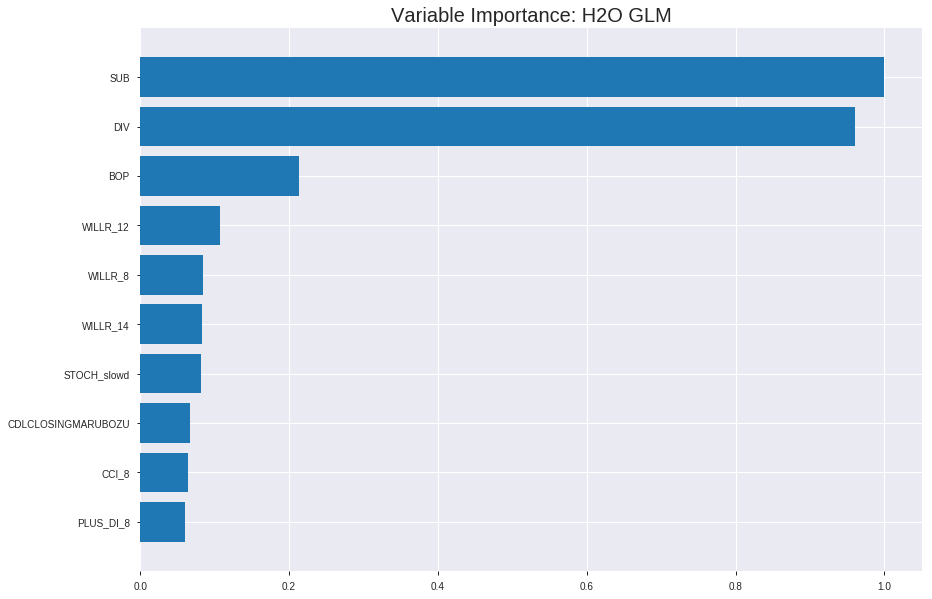

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190825_140423_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.18470286772209948
RMSE: 0.4297707152914208
LogLoss: 0.5477872053819888
Null degrees of freedom: 3627
Residual degrees of freedom: 3577
Null deviance: 5003.973061660213
Residual deviance: 3974.743962251711
AIC: 4076.743962251711
AUC: 0.7920304012986107
pr_auc: 0.8086527085745199
Gini: 0.5840608025972214
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.33517364405892197: 


,0,1,Error,Rate
0,722.0,940.0,0.5656,(940.0/1662.0)
1,168.0,1798.0,0.0855,(168.0/1966.0)
Total,890.0,2738.0,0.3054,(1108.0/3628.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3351736,0.7644558,279.0
max f2,0.1299806,0.8662398,361.0
max f0point5,0.5589407,0.7477278,183.0
max accuracy,0.5073895,0.7265711,205.0
max precision,0.9872259,1.0,0.0
max recall,0.0258206,1.0,396.0
max specificity,0.9872259,1.0,0.0
max absolute_mcc,0.5073895,0.4476058,205.0
max min_per_class_accuracy,0.5571076,0.7208183,184.0
max mean_per_class_accuracy,0.5073895,0.7226839,205.0


Gains/Lift Table: Avg response rate: 54.19 %, avg score: 54.19 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101985,0.9380766,1.7456215,1.7456215,0.9459459,0.9501183,0.9459459,0.9501183,0.0178026,0.0178026,74.5621512,74.5621512
,2,0.0201213,0.9269721,1.7428507,1.7442551,0.9444444,0.9329768,0.9452055,0.9416649,0.0172940,0.0350966,74.2850684,74.4255076
,3,0.0300441,0.9157209,1.7941110,1.7607213,0.9722222,0.9220628,0.9541284,0.9351908,0.0178026,0.0528993,79.4110998,76.0721252
,4,0.0402426,0.9069089,1.7456215,1.7568946,0.9459459,0.9113366,0.9520548,0.9291456,0.0178026,0.0707019,74.5621512,75.6894606
,5,0.0501654,0.8990156,1.7428507,1.7541167,0.9444444,0.9023616,0.9505495,0.9238477,0.0172940,0.0879959,74.2850684,75.4116687
,6,0.1000551,0.8590720,1.6312675,1.6928613,0.8839779,0.8793045,0.9173554,0.9016374,0.0813835,0.1693795,63.1267458,69.2861286
,7,0.1502205,0.8222380,1.5513286,1.6455972,0.8406593,0.8408669,0.8917431,0.8813434,0.0778230,0.2472024,55.1328631,64.5597170
,8,0.2001103,0.7917464,1.5293132,1.6166063,0.8287293,0.8064593,0.8760331,0.8626740,0.0762970,0.3234995,52.9313242,61.6606274
,9,0.3001654,0.7265035,1.3624229,1.5318785,0.7382920,0.7599547,0.8301194,0.8284342,0.1363174,0.4598169,36.2422897,53.1878481
,10,0.3999449,0.6610493,1.2336460,1.4574745,0.6685083,0.6930644,0.7898001,0.7946617,0.1230926,0.5829095,23.3646015,45.7474517




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.18577713365599186
RMSE: 0.4310187161319005
LogLoss: 0.5514225295438109
Null degrees of freedom: 1035
Residual degrees of freedom: 985
Null deviance: 1446.188268020725
Residual deviance: 1142.547481214776
AIC: 1244.547481214776
AUC: 0.7911876537687319
pr_auc: 0.761802830248198
Gini: 0.5823753075374638
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3615639850320411: 


,0,1,Error,Rate
0,300.0,226.0,0.4297,(226.0/526.0)
1,63.0,447.0,0.1235,(63.0/510.0)
Total,363.0,673.0,0.279,(289.0/1036.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3615640,0.7557058,251.0
max f2,0.1818068,0.8507004,333.0
max f0point5,0.5155281,0.7203718,188.0
max accuracy,0.4887028,0.7287645,199.0
max precision,0.9607670,1.0,0.0
max recall,0.0526431,1.0,386.0
max specificity,0.9607670,1.0,0.0
max absolute_mcc,0.3725420,0.4690752,247.0
max min_per_class_accuracy,0.5210885,0.7243346,186.0
max mean_per_class_accuracy,0.4887028,0.7291918,199.0


Gains/Lift Table: Avg response rate: 49.23 %, avg score: 50.18 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0106178,0.9249513,2.0313725,2.0313725,1.0,0.9412237,1.0,0.9412237,0.0215686,0.0215686,103.1372549,103.1372549
,2,0.0202703,0.9035178,2.0313725,2.0313725,1.0,0.9153487,1.0,0.9289023,0.0196078,0.0411765,103.1372549,103.1372549
,3,0.0308880,0.8883287,1.6620321,1.9044118,0.8181818,0.8968279,0.9375,0.9178767,0.0176471,0.0588235,66.2032086,90.4411765
,4,0.0405405,0.8773392,1.8282353,1.8862745,0.9,0.8833224,0.9285714,0.9096495,0.0176471,0.0764706,82.8235294,88.6274510
,5,0.0501931,0.8684853,1.6250980,1.8360483,0.8,0.8731757,0.9038462,0.9026353,0.0156863,0.0921569,62.5098039,83.6048265
,6,0.1003861,0.8293105,1.5235294,1.6797888,0.75,0.8476152,0.8269231,0.8751252,0.0764706,0.1686275,52.3529412,67.9788839
,7,0.1505792,0.7929813,1.6407240,1.6667672,0.8076923,0.8086103,0.8205128,0.8529536,0.0823529,0.2509804,64.0723982,66.6767220
,8,0.2007722,0.7688378,1.5625943,1.6407240,0.7692308,0.7820172,0.8076923,0.8352195,0.0784314,0.3294118,56.2594268,64.0723982
,9,0.3001931,0.6972563,1.4594327,1.5806822,0.7184466,0.7346144,0.7781350,0.8019001,0.1450980,0.4745098,45.9432705,58.0682176
,10,0.4005792,0.6206059,1.2110106,1.4880416,0.5961538,0.6573531,0.7325301,0.7656763,0.1215686,0.5960784,21.1010558,48.8041578



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-08-25 14:04:24,0.000 sec,2,.22E2,51,1.3594913,1.3756540
,2019-08-25 14:04:24,0.013 sec,4,.14E2,51,1.3492621,1.3651529
,2019-08-25 14:04:24,0.026 sec,6,.85E1,51,1.3349874,1.3504787
,2019-08-25 14:04:24,0.039 sec,8,.53E1,51,1.3161989,1.3311182
,2019-08-25 14:04:24,0.052 sec,10,.33E1,51,1.2930968,1.3072065
---,---,---,---,---,---,---,---
,2019-08-25 14:04:24,0.328 sec,51,.15E-3,51,1.0976398,1.1049664
,2019-08-25 14:04:24,0.341 sec,53,.92E-4,51,1.0968733,1.1039062
,2019-08-25 14:04:24,0.354 sec,55,.57E-4,51,1.0962564,1.1032001
,2019-08-25 14:04:24,0.364 sec,56,.35E-4,51,1.0959361,1.1029502



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7302504816955684)

('F1', 0.7610921501706486)

('auc', 0.7849861808671877)

('logloss', 0.5648485262676701)

('mean_per_class_error', 0.2718505750542364)

('rmse', 0.4370219971445252)

('mse', 0.1909882259881894)

glm prediction progress: |████████████████████████████████████████████████| 100%


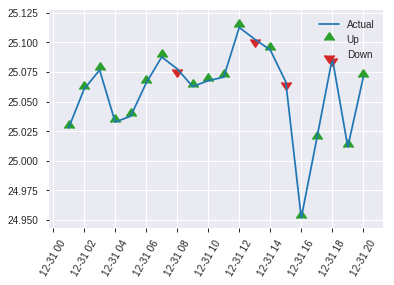


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.1909882259881894
RMSE: 0.4370219971445252
LogLoss: 0.5648485262676701
Null degrees of freedom: 518
Residual degrees of freedom: 468
Null deviance: 720.959908525584
Residual deviance: 586.3127702658416
AIC: 688.3127702658416
AUC: 0.7849861808671877
pr_auc: 0.7632852148848768
Gini: 0.5699723617343755
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.51415814449005: 


,0,1,Error,Rate
0,156.0,97.0,0.3834,(97.0/253.0)
1,43.0,223.0,0.1617,(43.0/266.0)
Total,199.0,320.0,0.2697,(140.0/519.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5141581,0.7610922,233.0
max f2,0.2710204,0.8617234,326.0
max f0point5,0.6687472,0.7310924,164.0
max accuracy,0.5332781,0.7302505,222.0
max precision,0.9918078,1.0,0.0
max recall,0.1261471,1.0,373.0
max specificity,0.9918078,1.0,0.0
max absolute_mcc,0.5141581,0.4676921,233.0
max min_per_class_accuracy,0.6070623,0.7114625,187.0
max mean_per_class_accuracy,0.5332781,0.7281494,222.0


Gains/Lift Table: Avg response rate: 51.25 %, avg score: 57.60 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0115607,0.9635884,1.9511278,1.9511278,1.0,0.9787894,1.0,0.9787894,0.0225564,0.0225564,95.1127820,95.1127820
,2,0.0211946,0.9542633,1.5609023,1.7737526,0.8,0.9584919,0.9090909,0.9695633,0.0150376,0.0375940,56.0902256,77.3752563
,3,0.0308285,0.9363017,1.5609023,1.7072368,0.8,0.9454998,0.875,0.9620435,0.0150376,0.0526316,56.0902256,70.7236842
,4,0.0404624,0.9245451,1.5609023,1.6723953,0.8,0.9292904,0.8571429,0.9542451,0.0150376,0.0676692,56.0902256,67.2395274
,5,0.0500963,0.9150920,1.9511278,1.7259977,1.0,0.9214810,0.8846154,0.9479443,0.0187970,0.0864662,95.1127820,72.5997687
,6,0.1001927,0.8747119,1.6509543,1.6884760,0.8461538,0.8932177,0.8653846,0.9205810,0.0827068,0.1691729,65.0954309,68.8475998
,7,0.1502890,0.8456740,1.4258242,1.6009254,0.7307692,0.8576623,0.8205128,0.8996081,0.0714286,0.2406015,42.5824176,60.0925390
,8,0.2003854,0.8242507,1.2757374,1.5196284,0.6538462,0.8342943,0.7788462,0.8832796,0.0639098,0.3045113,27.5737420,51.9628398
,9,0.3005780,0.7777274,1.4633459,1.5008676,0.75,0.8032179,0.7692308,0.8565924,0.1466165,0.4511278,46.3345865,50.0867553
,10,0.4007707,0.7151501,1.4633459,1.4914871,0.75,0.7488277,0.7644231,0.8296512,0.1466165,0.5977444,46.3345865,49.1487131


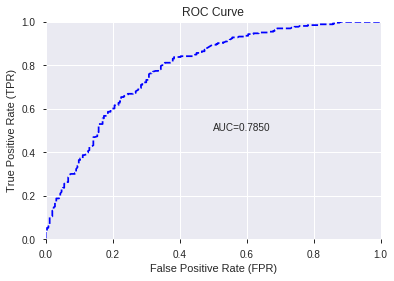

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


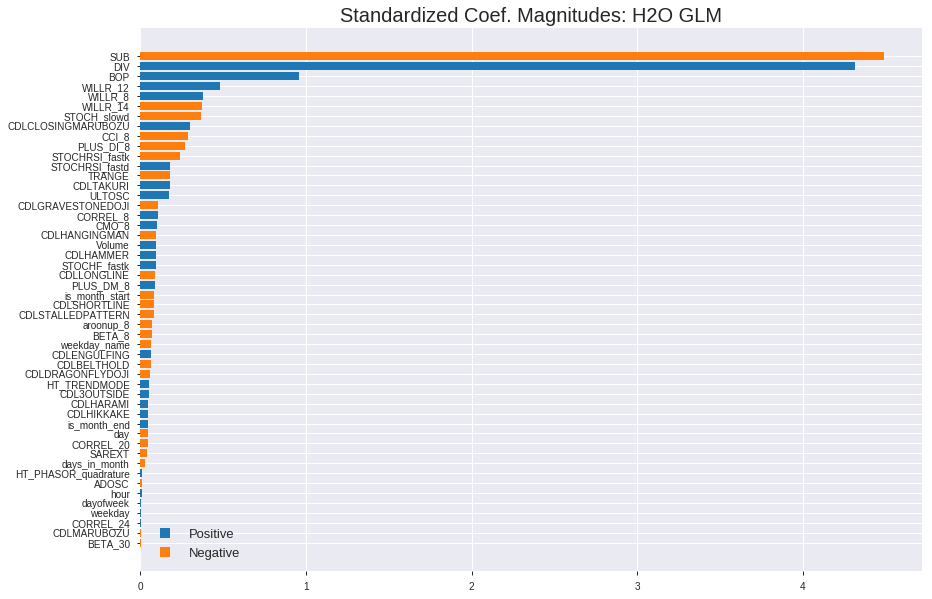

'log_likelihood'
--2019-08-25 14:04:33--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.109.107
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.109.107|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


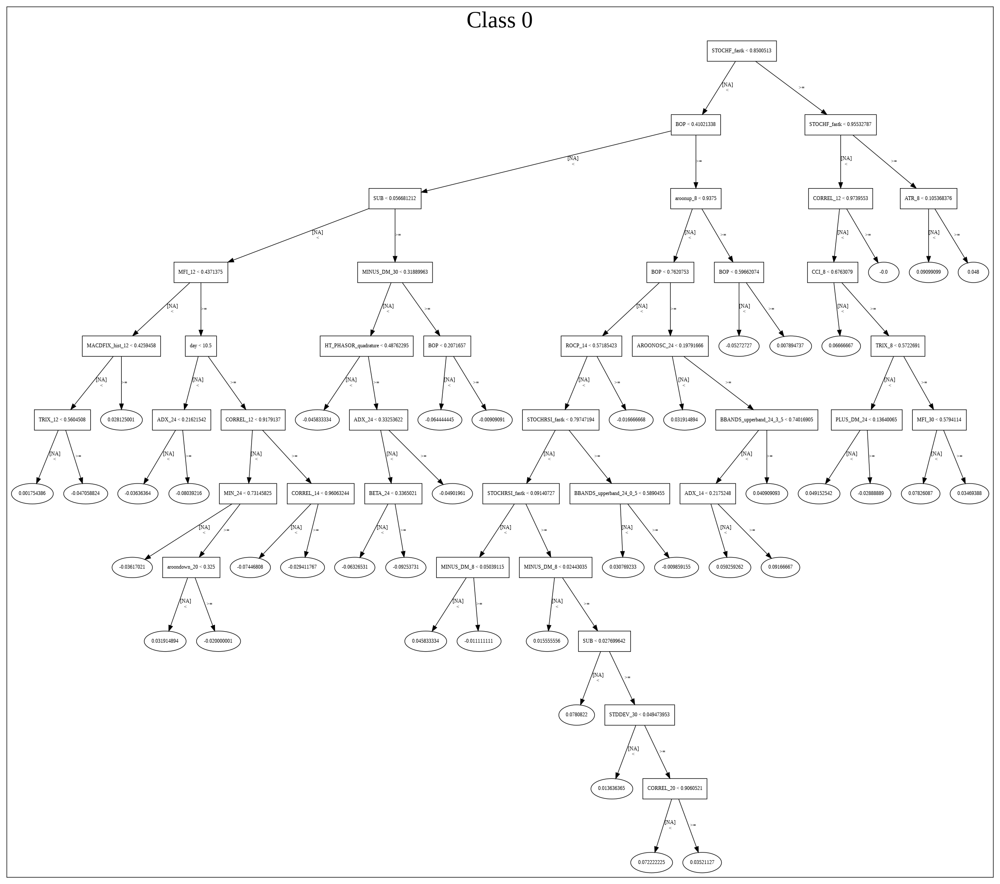

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190825_140423_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190825_140423_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_58_sid_9d08',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_58_s

['SUB',
 'DIV',
 'BOP',
 'WILLR_12',
 'WILLR_8',
 'WILLR_14',
 'STOCH_slowd',
 'CDLCLOSINGMARUBOZU',
 'CCI_8',
 'PLUS_DI_8',
 'STOCHRSI_fastk',
 'STOCHRSI_fastd',
 'TRANGE',
 'CDLTAKURI',
 'ULTOSC',
 'CDLGRAVESTONEDOJI',
 'CORREL_8',
 'CMO_8',
 'CDLHANGINGMAN',
 'Volume',
 'CDLHAMMER',
 'STOCHF_fastk',
 'CDLLONGLINE',
 'PLUS_DM_8',
 'is_month_start',
 'CDLSHORTLINE',
 'CDLSTALLEDPATTERN',
 'aroonup_8',
 'BETA_8',
 'weekday_name',
 'CDLENGULFING',
 'CDLBELTHOLD',
 'CDLDRAGONFLYDOJI',
 'HT_TRENDMODE',
 'CDL3OUTSIDE',
 'CDLHARAMI',
 'CDLHIKKAKE',
 'is_month_end',
 'day',
 'CORREL_20',
 'SAREXT',
 'days_in_month',
 'HT_PHASOR_quadrature',
 'ADOSC',
 'hour',
 'dayofweek',
 'weekday',
 'CORREL_24',
 'CDLMARUBOZU',
 'BETA_30']

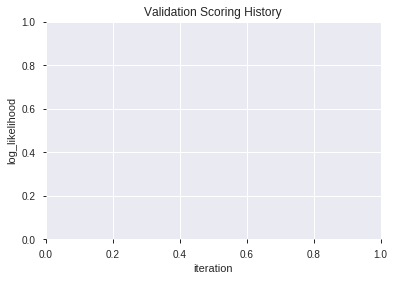

In [20]:
# GLM with top XGBoost features
model_train(feature_name='XGBF',model_algo="GLM",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_2_AutoML_20190825_140531,0.805262,0.540101,0.270454,0.425543,0.181087
1,XGBoost_3_AutoML_20190825_140531,0.802728,0.544578,0.274213,0.427279,0.182568
2,XGBoost_grid_1_AutoML_20190825_140531_model_7,0.797661,0.545954,0.290269,0.428571,0.183673
3,XGBoost_grid_1_AutoML_20190825_140531_model_1,0.794533,0.551265,0.313791,0.430868,0.185647
4,XGBoost_grid_1_AutoML_20190825_140531_model_3,0.794229,0.550146,0.270261,0.430650,0.185460
5,XGBoost_grid_1_AutoML_20190825_140531_model_4,0.793107,0.552048,0.269778,0.431669,0.186338
6,XGBoost_grid_1_AutoML_20190825_140531_model_6,0.790915,0.554168,0.286650,0.432579,0.187124
7,XGBoost_1_AutoML_20190825_140531,0.790202,0.554446,0.310032,0.432948,0.187444
8,XGBoost_grid_1_AutoML_20190825_140531_model_2,0.789957,0.556449,0.294942,0.433349,0.187792
9,XGBoost_grid_1_AutoML_20190825_140531_model_5,0.778091,0.572265,0.296242,0.439669,0.193309


,variable,relative_importance,scaled_importance,percentage
0,BOP,4534.603516,1.000000,0.278782
1,STOCHF_fastk,739.323120,0.163040,0.045453
2,WILLR_8,570.849243,0.125887,0.035095
3,STOCHRSI_fastk,547.530762,0.120745,0.033662
4,hour,544.111328,0.119991,0.033451
5,CORREL_8,504.650421,0.111289,0.031025
6,CCI_8,503.029785,0.110931,0.030926
7,PLUS_DI_8,499.403595,0.110132,0.030703
8,DIV,450.672729,0.099385,0.027707
9,HT_PHASOR_quadrature,419.714264,0.092558,0.025804


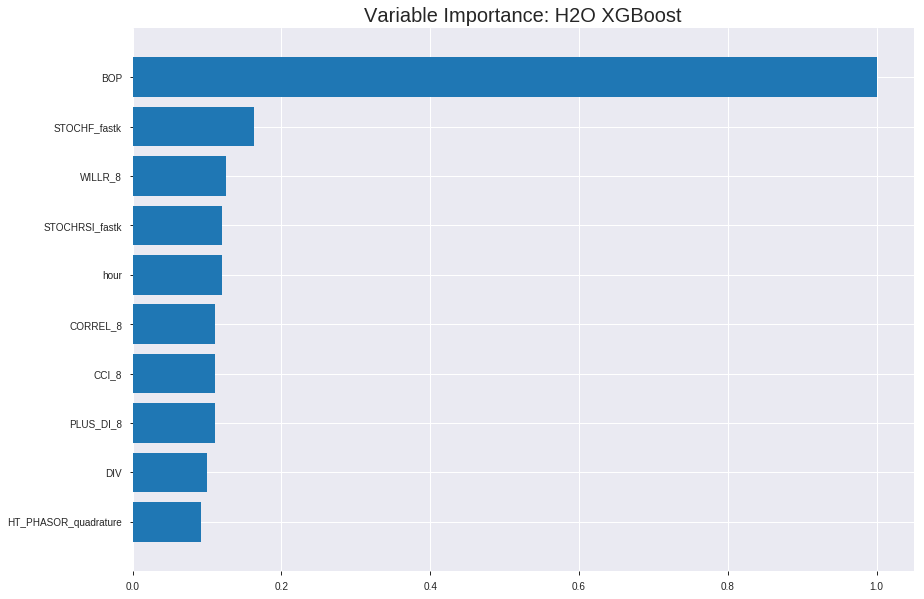

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_2_AutoML_20190825_140531


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.13239151334225813
RMSE: 0.3638564460639087
LogLoss: 0.4268393949820102
Mean Per-Class Error: 0.1723220745452475
AUC: 0.912760918771951
pr_auc: 0.9231903851096814
Gini: 0.825521837543902
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.46705137491226195: 


,0,1,Error,Rate
0,1196.0,466.0,0.2804,(466.0/1662.0)
1,198.0,1768.0,0.1007,(198.0/1966.0)
Total,1394.0,2234.0,0.183,(664.0/3628.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4670514,0.8419048,228.0
max f2,0.3146724,0.9055749,288.0
max f0point5,0.6567499,0.8667258,140.0
max accuracy,0.5351784,0.8277288,199.0
max precision,0.9419175,1.0,0.0
max recall,0.1268938,1.0,372.0
max specificity,0.9419175,1.0,0.0
max absolute_mcc,0.6026356,0.6543219,167.0
max min_per_class_accuracy,0.5494598,0.8229908,191.0
max mean_per_class_accuracy,0.6026356,0.8276779,167.0


Gains/Lift Table: Avg response rate: 54.19 %, avg score: 54.13 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101985,0.9249367,1.8453713,1.8453713,1.0,0.9319733,1.0,0.9319733,0.0188199,0.0188199,84.5371312,84.5371312
,2,0.0201213,0.9145256,1.8453713,1.8453713,1.0,0.9193512,1.0,0.9257487,0.0183113,0.0371312,84.5371312,84.5371312
,3,0.0300441,0.9034468,1.8453713,1.8453713,1.0,0.9079133,1.0,0.9198581,0.0183113,0.0554425,84.5371312,84.5371312
,4,0.0402426,0.8951592,1.7954964,1.8327318,0.9729730,0.8990045,0.9931507,0.9145733,0.0183113,0.0737538,79.5496412,83.2731783
,5,0.0501654,0.8884829,1.7941110,1.8250925,0.9722222,0.8909999,0.9890110,0.9099104,0.0178026,0.0915565,79.4110998,82.5092507
,6,0.1000551,0.8513497,1.8249805,1.8250366,0.9889503,0.8692136,0.9889807,0.8896181,0.0910478,0.1826043,82.4980469,82.5036642
,7,0.1502205,0.8216721,1.7642561,1.8047393,0.9560440,0.8359212,0.9779817,0.8716863,0.0885046,0.2711089,76.4256090,80.4739283
,8,0.2001103,0.7943582,1.7638079,1.7945346,0.9558011,0.8071791,0.9724518,0.8556039,0.0879959,0.3591048,76.3807939,79.4534637
,9,0.3001654,0.7307411,1.7030286,1.7640326,0.9228650,0.7635070,0.9559229,0.8249049,0.1703967,0.5295015,70.3028622,76.4032632
,10,0.3999449,0.6618168,1.5497041,1.7105613,0.8397790,0.6987528,0.9269469,0.7934321,0.1546287,0.6841302,54.9704085,71.0561278




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.186969544705614
RMSE: 0.4323997510471231
LogLoss: 0.5567958404518734
Mean Per-Class Error: 0.2691418772832327
AUC: 0.7896779244016998
pr_auc: 0.7562174417483516
Gini: 0.5793558488033996
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.449129581451416: 


,0,1,Error,Rate
0,346.0,180.0,0.3422,(180.0/526.0)
1,100.0,410.0,0.1961,(100.0/510.0)
Total,446.0,590.0,0.2703,(280.0/1036.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4491296,0.7454545,226.0
max f2,0.2391798,0.8452174,319.0
max f0point5,0.6172806,0.7256597,154.0
max accuracy,0.4634400,0.7297297,219.0
max precision,0.9292929,1.0,0.0
max recall,0.0793012,1.0,394.0
max specificity,0.9292929,1.0,0.0
max absolute_mcc,0.4491296,0.4661865,226.0
max min_per_class_accuracy,0.5438474,0.7254902,190.0
max mean_per_class_accuracy,0.4491296,0.7308581,226.0


Gains/Lift Table: Avg response rate: 49.23 %, avg score: 50.36 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0106178,0.9108768,1.6620321,1.6620321,0.8181818,0.9223840,0.8181818,0.9223840,0.0176471,0.0176471,66.2032086,66.2032086
,2,0.0202703,0.8956053,1.6250980,1.6444444,0.8,0.9023377,0.8095238,0.9128382,0.0156863,0.0333333,62.5098039,64.4444444
,3,0.0308880,0.8728016,2.0313725,1.7774510,1.0,0.8830059,0.875,0.9025833,0.0215686,0.0549020,103.1372549,77.7450980
,4,0.0405405,0.8638196,2.0313725,1.8379085,1.0,0.8681128,0.9047619,0.8943761,0.0196078,0.0745098,103.1372549,83.7908497
,5,0.0501931,0.8504390,1.6250980,1.7969834,0.8,0.8580999,0.8846154,0.8873999,0.0156863,0.0901961,62.5098039,79.6983409
,6,0.1003861,0.8051407,1.5235294,1.6602564,0.75,0.8251818,0.8173077,0.8562908,0.0764706,0.1666667,52.3529412,66.0256410
,7,0.1505792,0.7711059,1.6407240,1.6537456,0.8076923,0.7881919,0.8141026,0.8335912,0.0823529,0.2490196,64.0723982,65.3745601
,8,0.2007722,0.7492865,1.7969834,1.6895551,0.8846154,0.7593222,0.8317308,0.8150239,0.0901961,0.3392157,79.6983409,68.9555053
,9,0.3001931,0.6928666,1.4397106,1.6068092,0.7087379,0.7177678,0.7909968,0.7828137,0.1431373,0.4823529,43.9710642,60.6809155
,10,0.4005792,0.6224273,1.2891403,1.5272006,0.6346154,0.6588800,0.7518072,0.7517556,0.1294118,0.6117647,28.9140271,52.7200567



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-25 14:05:33,0.004 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4581036,0.5,0.6931472,0.5,0.0,1.0,0.5077220
,2019-08-25 14:05:33,0.134 sec,5.0,0.4727246,0.6397507,0.8268361,0.8339692,1.8453713,0.2626792,0.4785079,0.6508661,0.7782189,0.7409043,1.8620915,0.2866795
,2019-08-25 14:05:33,0.219 sec,10.0,0.4511637,0.5983887,0.8409090,0.8562623,1.8453713,0.2508269,0.4620428,0.6188502,0.7886994,0.7633249,2.0313725,0.2982625
,2019-08-25 14:05:33,0.318 sec,15.0,0.4353670,0.5678848,0.8515493,0.8679154,1.8453713,0.2511025,0.4522052,0.5994021,0.7903396,0.7629810,2.0313725,0.2789575
,2019-08-25 14:05:33,0.421 sec,20.0,0.4231165,0.5437985,0.8582587,0.8737125,1.8453713,0.2505513,0.4460294,0.5867425,0.7881328,0.7599220,2.0313725,0.3127413
,2019-08-25 14:05:34,0.511 sec,25.0,0.4137266,0.5248747,0.8631377,0.8808155,1.8453713,0.2447630,0.4406333,0.5754808,0.7904738,0.7582858,1.6620321,0.2915058
,2019-08-25 14:05:34,0.610 sec,30.0,0.4060648,0.5095074,0.8699186,0.8867574,1.8453713,0.2359427,0.4383756,0.5705146,0.7886286,0.7560904,1.6620321,0.2924710
,2019-08-25 14:05:34,0.711 sec,35.0,0.3991757,0.4954677,0.8752595,0.8923392,1.8453713,0.2260198,0.4356776,0.5648613,0.7907757,0.7539505,1.6620321,0.2577220
,2019-08-25 14:05:34,0.817 sec,40.0,0.3930864,0.4833092,0.8815876,0.8969064,1.8453713,0.2133407,0.4344064,0.5620311,0.7908559,0.7583637,1.6620321,0.2654440
,2019-08-25 14:05:34,0.924 sec,45.0,0.3878588,0.4726840,0.8862519,0.9001850,1.8453713,0.2111356,0.4329803,0.5585980,0.7919686,0.7617433,1.8467023,0.2731660


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,4534.6035156,1.0,0.2787821
STOCHF_fastk,739.3231201,0.1630403,0.0454527
WILLR_8,570.8492432,0.1258874,0.0350951
STOCHRSI_fastk,547.5307617,0.1207450,0.0336616
hour,544.1113281,0.1199909,0.0334513
---,---,---,---
days_in_month,24.1255989,0.0053203,0.0014832
CDLBELTHOLD,15.8122082,0.0034870,0.0009721
CDLDRAGONFLYDOJI,15.2906246,0.0033720,0.0009400
CDLHANGINGMAN,14.7869349,0.0032609,0.0009091



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7341040462427746)

('F1', 0.7615780445969125)

('auc', 0.8052616719664775)

('logloss', 0.5401008617337161)

('mean_per_class_error', 0.26596629914707726)

('rmse', 0.42554310419223995)

('mse', 0.18108693352556757)

xgboost prediction progress: |████████████████████████████████████████████| 100%


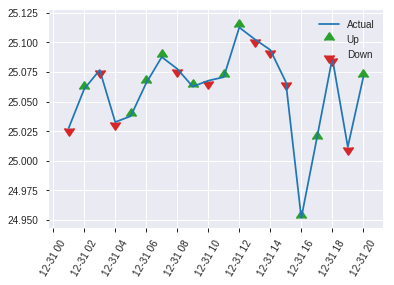


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.18108693352556757
RMSE: 0.42554310419223995
LogLoss: 0.5401008617337161
Mean Per-Class Error: 0.26596629914707726
AUC: 0.8052616719664775
pr_auc: 0.8012734328716881
Gini: 0.6105233439329549
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.41609811782836914: 


,0,1,Error,Rate
0,158.0,95.0,0.3755,(95.0/253.0)
1,44.0,222.0,0.1654,(44.0/266.0)
Total,202.0,317.0,0.2678,(139.0/519.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4160981,0.7615780,237.0
max f2,0.1786921,0.8601445,345.0
max f0point5,0.6024642,0.7577132,150.0
max accuracy,0.5048359,0.7341040,194.0
max precision,0.9195340,1.0,0.0
max recall,0.1069330,1.0,382.0
max specificity,0.9195340,1.0,0.0
max absolute_mcc,0.6024642,0.4706651,150.0
max min_per_class_accuracy,0.5054160,0.7312253,193.0
max mean_per_class_accuracy,0.5048359,0.7340337,194.0


Gains/Lift Table: Avg response rate: 51.25 %, avg score: 49.98 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0115607,0.9067958,1.6259398,1.6259398,0.8333333,0.9126194,0.8333333,0.9126194,0.0187970,0.0187970,62.5939850,62.5939850
,2,0.0211946,0.8842864,1.9511278,1.7737526,1.0,0.8975837,0.9090909,0.9057850,0.0187970,0.0375940,95.1127820,77.3752563
,3,0.0308285,0.8650156,1.9511278,1.8291823,1.0,0.8708655,0.9375,0.8948726,0.0187970,0.0563910,95.1127820,82.9182331
,4,0.0404624,0.8521522,1.9511278,1.8582170,1.0,0.8610476,0.9523810,0.8868191,0.0187970,0.0751880,95.1127820,85.8216971
,5,0.0500963,0.8348362,1.9511278,1.8760844,1.0,0.8436175,0.9615385,0.8785111,0.0187970,0.0939850,95.1127820,87.6084442
,6,0.1001927,0.7999239,1.8010411,1.8385628,0.9230769,0.8166240,0.9423077,0.8475675,0.0902256,0.1842105,80.1041064,83.8562753
,7,0.1502890,0.7719317,1.5759109,1.7510121,0.8076923,0.7867929,0.8974359,0.8273093,0.0789474,0.2631579,57.5910931,75.1012146
,8,0.2003854,0.7408900,1.3507808,1.6509543,0.6923077,0.7545911,0.8461538,0.8091298,0.0676692,0.3308271,35.0780798,65.0954309
,9,0.3005780,0.6786028,1.5759109,1.6259398,0.8076923,0.7095185,0.8333333,0.7759260,0.1578947,0.4887218,57.5910931,62.5939850
,10,0.4007707,0.6029892,1.3507808,1.5571501,0.6923077,0.6450865,0.7980769,0.7432161,0.1353383,0.6240602,35.0780798,55.7150087


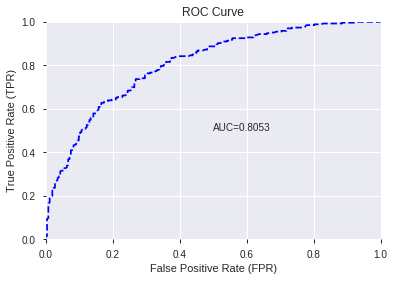

This function is available for GLM models only


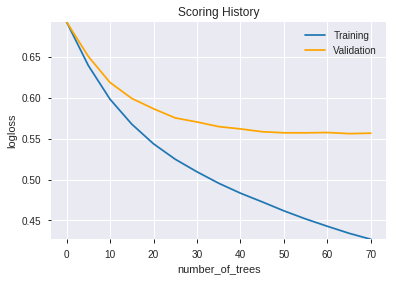

--2019-08-25 14:06:02--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.106.252
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.106.252|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip


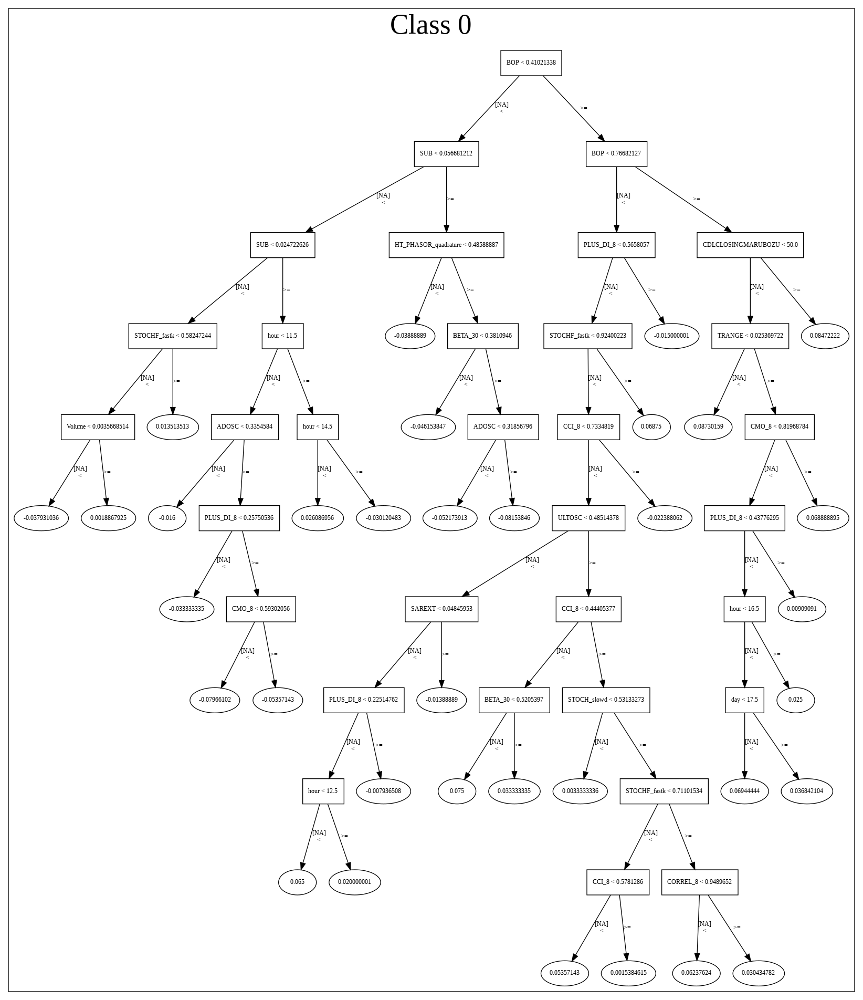

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_2_AutoML_20190825_140531',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_2_AutoML_20190825_140531',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_66_sid_9d08',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_66_sid_9d08',
   'type

['BOP',
 'STOCHF_fastk',
 'WILLR_8',
 'STOCHRSI_fastk',
 'hour',
 'CORREL_8',
 'CCI_8',
 'PLUS_DI_8',
 'DIV',
 'HT_PHASOR_quadrature',
 'PLUS_DM_8',
 'BETA_8',
 'BETA_30',
 'SUB',
 'STOCHRSI_fastd',
 'ULTOSC',
 'CORREL_24',
 'TRANGE',
 'SAREXT',
 'Volume',
 'ADOSC',
 'CORREL_20',
 'WILLR_12',
 'day',
 'CMO_8',
 'STOCH_slowd',
 'aroonup_8',
 'WILLR_14',
 'weekday_name',
 'CDLCLOSINGMARUBOZU',
 'CDLGRAVESTONEDOJI',
 'dayofweek',
 'CDLTAKURI',
 'HT_TRENDMODE',
 'CDLHAMMER',
 'weekday',
 'CDLENGULFING',
 'CDLSHORTLINE',
 'CDLLONGLINE',
 'days_in_month',
 'CDLBELTHOLD',
 'CDLDRAGONFLYDOJI',
 'CDLHANGINGMAN',
 'CDLHARAMI']

In [21]:
# XGBoost with top XGBoost features
model_train(feature_name='XGBF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

In [0]:
# PCA
try:
  del xgb_features,glm_features,dl_features
except:
  pass
gc.collect()

if features_to_include is True or 'PCA' in features_to_include:
  for _ in range(3):
    try:
      from h2o.estimators.pca import H2OPrincipalComponentAnalysisEstimator
      h2o_model = H2OPrincipalComponentAnalysisEstimator(seed=1, k=PCA_k, pca_method="GramSVD", max_iterations=10000)
      h2o_model.train(x=list(train_hf.columns[:-1]), training_frame=train_hf[:index_splits[0],:])

      display(h2o_model.varimp(use_pandas=True))
      display(h2o_model)

      training_frame = h2o_model.predict(train_hf)
      del h2o_model, H2OPrincipalComponentAnalysisEstimator
      gc.collect()

      training_frame = training_frame.cbind(train_hf[data_label_name])
      break
    except KeyboardInterrupt:
      break
    except Exception as e:
      print(e)
      load_h2o()
else:
  training_frame = []

In [23]:
# DeepLearning with PCA
model_train(feature_name='PCA',model_algo="DeepLearning",training_frame=training_frame)

[]

In [24]:
# GLM with PCA
model_train(feature_name='PCA',model_algo="GLM",training_frame=training_frame)

[]

In [25]:
# XGBoost with PCA
model_train(feature_name='PCA',model_algo="XGBoost",training_frame=training_frame)

[]

In [0]:
# Generalized Low Rank
try:
  del training_frame
except:
  pass
gc.collect()

if features_to_include is True or 'GLRM' in features_to_include:
  for _ in range(3):
    try:
      from h2o.estimators.glrm import H2OGeneralizedLowRankEstimator

      h2o_model = H2OGeneralizedLowRankEstimator(seed=1, k=GLRM_k)
      h2o_model.train(x=list(train_hf.columns[:-1]), training_frame=train_hf[:index_splits[0],:])

      display(h2o_model.varimp(use_pandas=True))
      display(h2o_model)

      training_frame = h2o_model.predict(train_hf)
      del h2o_model, H2OGeneralizedLowRankEstimator
      gc.collect()

      training_frame = training_frame.cbind(train_hf[data_label_name])
      break
    except KeyboardInterrupt:
      break
    except Exception as e:
      print(e)
      load_h2o()
else:
  training_frame = []

In [27]:
# DeepLearning with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="DeepLearning",training_frame=training_frame)

[]

In [28]:
# GLM with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="GLM",training_frame=training_frame)

[]

In [29]:
# XGBoost with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="XGBoost",training_frame=training_frame)

[]

In [0]:
# High Correlation Filter 
try:
  del training_frame
except:
  pass
gc.collect()

if features_to_include is True or 'HCF' in features_to_include:
  corr_matrix = pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1).corr().abs()

  upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

  features_list = [column for column in upper.columns if not any(upper[column] > HCF_threshold)]

  del corr_matrix, upper
  gc.collect()

  display(len(features_list),features_list)
else:
  features_list = []

In [31]:
# DeepLearning with low correlation features
model_train(feature_name='HCF',model_algo="DeepLearning",features_list=features_list)

[]

In [32]:
# GLM with low correlation features
model_train(feature_name='HCF',model_algo="GLM",features_list=features_list)

[]

In [33]:
# XGBoost with low correlation features
model_train(feature_name='HCF',model_algo="XGBoost",features_list=features_list)

[]

In [0]:
#	Low Variance Filter  
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'LVF' in features_to_include:
  df_variance = pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1).var()
  features_list = [column for column in df_variance.index if df_variance[column]  > LVF_threshold]

  del df_variance
  gc.collect()

  display(len(features_list),features_list)
else:
  features_list = []

In [35]:
# DeepLearning with Low Variance features  
model_train(feature_name='LVF',model_algo="DeepLearning",features_list=features_list)

[]

In [36]:
# GLM with Low Variance features  
model_train(feature_name='LVF',model_algo="GLM",features_list=features_list)

[]

In [37]:
# XGBoost with Low Variance features  
model_train(feature_name='LVF',model_algo="XGBoost",features_list=features_list)

[]

In [0]:
# Select k best features
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'KBest' in features_to_include:
  from sklearn.feature_selection import SelectKBest
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectKBest(score_func=f_classif, k=select_k).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectKBest, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

In [39]:
# DeepLearning with Select k best features 
model_train(feature_name='KBest',model_algo="DeepLearning",features_list=features_list)

[]

In [40]:
# GLM with Select k best features
model_train(feature_name='KBest',model_algo="GLM",features_list=features_list)

[]

In [41]:
# XGBoost with Select k best features
model_train(feature_name='KBest',model_algo="XGBoost",features_list=features_list)

[]

In [0]:
# Select Percentile
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'Percentile' in features_to_include:
  from sklearn.feature_selection import SelectPercentile
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectPercentile(score_func=f_classif, percentile=select_percentile).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectPercentile, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

In [43]:
# DeepLearning with Select Percentile features  
model_train(feature_name='Percentile',model_algo="DeepLearning",features_list=features_list)

[]

In [44]:
# GLM with Select Percentile features  
model_train(feature_name='Percentile',model_algo="GLM",features_list=features_list)

[]

In [45]:
# XGBoost with Select Percentile features  
model_train(feature_name='Percentile',model_algo="XGBoost",features_list=features_list)

[]

In [46]:
# Select Family-wise error
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'Fwe' in features_to_include:
  from sklearn.feature_selection import SelectFwe
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectFwe(score_func=f_classif, alpha=select_alpha).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectFwe, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:114: UserWarning: Features [ 12 919 929] are constant.
  UserWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:115: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw
/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:721: RuntimeWarning: invalid value encountered in less
  return (self.pvalues_ < self.alpha / len(self.pvalues_))


65

['BOP',
 'CCI_8',
 'CMO_8',
 'MINUS_DI_8',
 'MOM_8',
 'ROC_8',
 'ROCP_8',
 'ROCR_8',
 'ROCR100_8',
 'RSI_8',
 'WILLR_8',
 'CCI_12',
 'CMO_12',
 'MINUS_DI_12',
 'MOM_12',
 'ROC_12',
 'ROCP_12',
 'ROCR_12',
 'ROCR100_12',
 'RSI_12',
 'WILLR_12',
 'CCI_14',
 'CMO_14',
 'MOM_14',
 'ROC_14',
 'ROCP_14',
 'ROCR_14',
 'ROCR100_14',
 'RSI_14',
 'WILLR_14',
 'CCI_20',
 'CMO_20',
 'RSI_20',
 'WILLR_20',
 'CCI_24',
 'CMO_24',
 'RSI_24',
 'WILLR_24',
 'CCI_30',
 'CMO_30',
 'RSI_30',
 'WILLR_30',
 'STOCH_slowk',
 'STOCHF_fastk',
 'STOCHF_fastd',
 'STOCHRSI_fastk',
 'STOCHRSI_fastd',
 'ULTOSC',
 'ADOSC',
 'TRANGE',
 'CDL3OUTSIDE',
 'CDLBELTHOLD',
 'CDLCLOSINGMARUBOZU',
 'CDLDOJI',
 'CDLDRAGONFLYDOJI',
 'CDLENGULFING',
 'CDLHAMMER',
 'CDLHANGINGMAN',
 'CDLLONGLEGGEDDOJI',
 'CDLLONGLINE',
 'CDLMARUBOZU',
 'CDLSHORTLINE',
 'CDLTAKURI',
 'DIV',
 'SUB']

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190825_140701_model_8,0.791428,0.568088,0.275803,0.439567,0.193219
1,DeepLearning_grid_1_AutoML_20190825_140701_model_9,0.785974,0.556847,0.290120,0.433835,0.188213
2,DeepLearning_grid_1_AutoML_20190825_140701_model_6,0.781977,0.573979,0.267125,0.438849,0.192588
3,DeepLearning_grid_1_AutoML_20190825_140701_model_3,0.775395,0.606867,0.278983,0.447669,0.200407
4,DeepLearning_grid_1_AutoML_20190825_140701_model_2,0.768478,0.653821,0.300581,0.455777,0.207733
5,DeepLearning_grid_1_AutoML_20190825_140701_model_5,0.767348,0.577990,0.313791,0.443474,0.196669
6,DeepLearning_grid_1_AutoML_20190825_140701_model_7,0.762155,0.625736,0.372938,0.459339,0.210992
7,DeepLearning_1_AutoML_20190825_140701,0.760052,0.618425,0.309690,0.456111,0.208038
8,DeepLearning_grid_1_AutoML_20190825_140701_model_1,0.757021,0.674868,0.384603,0.464173,0.215456
9,DeepLearning_grid_1_AutoML_20190825_140701_model_4,0.755208,0.670946,0.343242,0.472310,0.223076


,variable,relative_importance,scaled_importance,percentage
0,BOP,1.000000,1.000000,0.046407
1,CDLCLOSINGMARUBOZU,0.874200,0.874200,0.040569
2,SUB,0.505902,0.505902,0.023477
3,DIV,0.500359,0.500359,0.023220
4,TRANGE,0.486281,0.486281,0.022567
5,CDLMARUBOZU,0.475374,0.475374,0.022061
6,CDLHANGINGMAN,0.434135,0.434135,0.020147
7,STOCHF_fastk,0.416510,0.416510,0.019329
8,WILLR_8,0.411959,0.411959,0.019118
9,CCI_8,0.410041,0.410041,0.019029


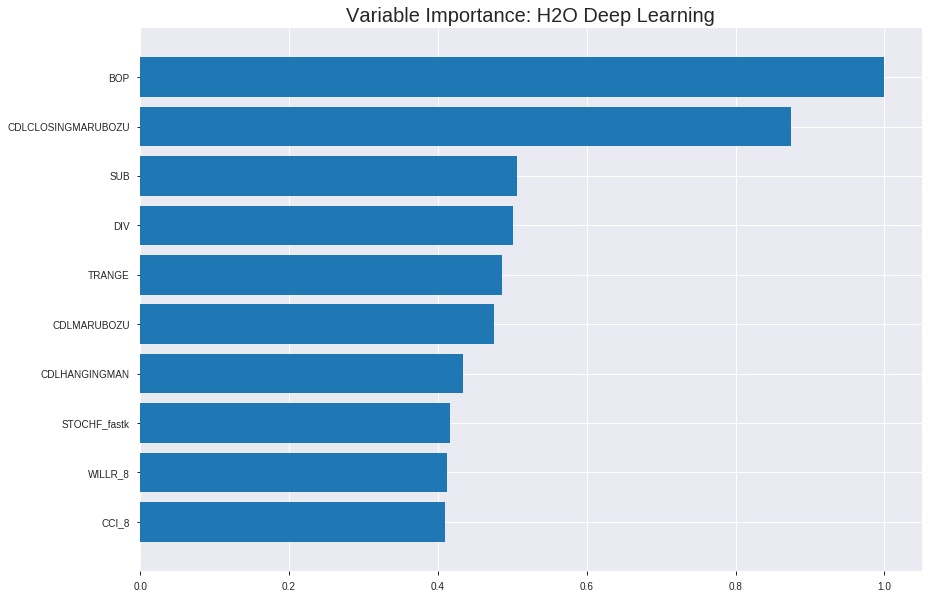

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190825_140701_model_8


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.18486810338920354
RMSE: 0.4299629093180056
LogLoss: 0.5485541233651389
Mean Per-Class Error: 0.2734176548863777
AUC: 0.7957439528543604
pr_auc: 0.8091468233347655
Gini: 0.5914879057087208
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4564679973348535: 


,0,1,Error,Rate
0,874.0,788.0,0.4741,(788.0/1662.0)
1,247.0,1719.0,0.1256,(247.0/1966.0)
Total,1121.0,2507.0,0.2853,(1035.0/3628.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4564680,0.7686117,235.0
max f2,0.1903015,0.8683499,334.0
max f0point5,0.5707736,0.7498467,180.0
max accuracy,0.5580245,0.7285006,187.0
max precision,0.9784877,1.0,0.0
max recall,0.0097523,1.0,398.0
max specificity,0.9784877,1.0,0.0
max absolute_mcc,0.5707736,0.4529219,180.0
max min_per_class_accuracy,0.5818313,0.7214200,173.0
max mean_per_class_accuracy,0.5707736,0.7265823,180.0


Gains/Lift Table: Avg response rate: 54.19 %, avg score: 53.51 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101985,0.9510391,1.7954964,1.7954964,0.9729730,0.9645052,0.9729730,0.9645052,0.0183113,0.0183113,79.5496412,79.5496412
,2,0.0201213,0.9346657,1.5890697,1.6936970,0.8611111,0.9431617,0.9178082,0.9539797,0.0157681,0.0340793,58.9069741,69.3696958
,3,0.0300441,0.9192822,1.7941110,1.7268612,0.9722222,0.9265733,0.9357798,0.9449280,0.0178026,0.0518820,79.4110998,72.6861228
,4,0.0402426,0.9011206,1.7954964,1.7442551,0.9729730,0.9097339,0.9452055,0.9360090,0.0183113,0.0701933,79.5496412,74.4255076
,5,0.0501654,0.8856963,1.7941110,1.7541167,0.9722222,0.8937214,0.9505495,0.9276444,0.0178026,0.0879959,79.4110998,75.4116687
,6,0.1000551,0.8018365,1.6720491,1.7131960,0.9060773,0.8411379,0.9283747,0.8845103,0.0834181,0.1714140,67.2049145,71.3195957
,7,0.1502205,0.7506595,1.5513286,1.6591412,0.8406593,0.7746566,0.8990826,0.8478252,0.0778230,0.2492370,55.1328631,65.9141180
,8,0.2001103,0.7076498,1.4579453,1.6089808,0.7900552,0.7266811,0.8719008,0.8176226,0.0727365,0.3219736,45.7945291,60.8980772
,9,0.3001654,0.6505352,1.3370046,1.5183220,0.7245179,0.6762701,0.8227732,0.7705051,0.1337742,0.4557477,33.7004560,51.8322035
,10,0.3999449,0.6239796,1.2999163,1.4638335,0.7044199,0.6364613,0.7932460,0.7370635,0.1297050,0.5854527,29.9916256,46.3833481




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.1905237278672965
RMSE: 0.4364902379977088
LogLoss: 0.5647989451627891
Mean Per-Class Error: 0.26816521285320216
AUC: 0.7879538507418176
pr_auc: 0.7644870728776334
Gini: 0.5759077014836351
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.507631115177833: 


,0,1,Error,Rate
0,337.0,189.0,0.3593,(189.0/526.0)
1,98.0,412.0,0.1922,(98.0/510.0)
Total,435.0,601.0,0.277,(287.0/1036.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5076311,0.7416742,210.0
max f2,0.2133464,0.8421592,329.0
max f0point5,0.5749879,0.7256809,176.0
max accuracy,0.5690864,0.7316602,178.0
max precision,0.9701062,1.0,0.0
max recall,0.0143123,1.0,397.0
max specificity,0.9701062,1.0,0.0
max absolute_mcc,0.5655953,0.4636696,180.0
max min_per_class_accuracy,0.5749879,0.7300380,176.0
max mean_per_class_accuracy,0.5655953,0.7318348,180.0


Gains/Lift Table: Avg response rate: 49.23 %, avg score: 50.84 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0106178,0.9261703,2.0313725,2.0313725,1.0,0.9451424,1.0,0.9451424,0.0215686,0.0215686,103.1372549,103.1372549
,2,0.0202703,0.9076382,2.0313725,2.0313725,1.0,0.9170740,1.0,0.9317765,0.0196078,0.0411765,103.1372549,103.1372549
,3,0.0308880,0.8795221,2.0313725,2.0313725,1.0,0.8880588,1.0,0.9167485,0.0215686,0.0627451,103.1372549,103.1372549
,4,0.0405405,0.8573071,1.4219608,1.8862745,0.7,0.8671886,0.9285714,0.9049486,0.0137255,0.0764706,42.1960784,88.6274510
,5,0.0501931,0.8377576,1.2188235,1.7579186,0.6,0.8493653,0.8653846,0.8942595,0.0117647,0.0882353,21.8823529,75.7918552
,6,0.1003861,0.7750782,1.6016591,1.6797888,0.7884615,0.8018056,0.8269231,0.8480325,0.0803922,0.1686275,60.1659125,67.9788839
,7,0.1505792,0.7296357,1.6797888,1.6797888,0.8269231,0.7509255,0.8269231,0.8156635,0.0843137,0.2529412,67.9788839,67.9788839
,8,0.2007722,0.6985956,1.6797888,1.6797888,0.8269231,0.7143217,0.8269231,0.7903281,0.0843137,0.3372549,67.9788839,67.9788839
,9,0.3001931,0.6421316,1.4199886,1.5937457,0.6990291,0.6644892,0.7845659,0.7486515,0.1411765,0.4784314,41.9988578,59.3745665
,10,0.4005792,0.6172934,1.3477376,1.5320954,0.6634615,0.6297792,0.7542169,0.7188618,0.1352941,0.6137255,34.7737557,53.2095441



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-25 14:19:12,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-08-25 14:19:14,2 min 52.836 sec,626 obs/sec,0.3340684,1,1212.0,0.4642767,0.6332782,0.1316921,0.7528712,0.7683339,1.7954964,0.3233186,0.4673303,0.6412893,0.1262010,0.7645288,0.7365610,2.0313725,0.3166023
,2019-08-25 14:19:40,3 min 18.775 sec,1189 obs/sec,8.3139471,25,30163.0,0.4425583,0.5774641,0.2110291,0.7838746,0.7986217,1.7954964,0.3067806,0.4500061,0.5963320,0.1897847,0.7800436,0.7527174,1.8467023,0.3108108
,2019-08-25 14:20:06,3 min 44.566 sec,1340 obs/sec,17.9716097,54,65201.0,0.4299629,0.5485541,0.2552989,0.7957440,0.8091468,1.7954964,0.2852811,0.4364902,0.5647989,0.2377233,0.7879539,0.7644871,2.0313725,0.2770270
,2019-08-25 14:20:32,4 min 10.253 sec,1415 obs/sec,27.9837376,84,101525.0,0.4279540,0.5430865,0.2622415,0.8007098,0.8130176,1.8453713,0.2748071,0.4394316,0.5715874,0.2274150,0.7818478,0.7513487,2.0313725,0.3040541
,2019-08-25 14:20:58,4 min 36.848 sec,1464 obs/sec,38.6535281,116,140235.0,0.4277402,0.5425744,0.2629786,0.8076610,0.8204822,1.7954964,0.2803197,0.4446733,0.5807701,0.2088741,0.7841050,0.7609502,2.0313725,0.3108108
,2019-08-25 14:21:24,5 min 2.900 sec,1500 obs/sec,49.3475744,148,179033.0,0.4261133,0.5391362,0.2685742,0.8123347,0.8290885,1.8453713,0.2637817,0.4423972,0.5764046,0.2169521,0.7812924,0.7578813,2.0313725,0.3117761
,2019-08-25 14:21:50,5 min 28.389 sec,1530 obs/sec,60.0060639,180,217702.0,0.4225090,0.5285865,0.2808956,0.8232981,0.8398133,1.7954964,0.2577178,0.4513728,0.5963441,0.1848561,0.7628346,0.7309423,2.0313725,0.2972973
,2019-08-25 14:21:52,5 min 30.940 sec,1529 obs/sec,60.0060639,180,217702.0,0.4299629,0.5485541,0.2552989,0.7957440,0.8091468,1.7954964,0.2852811,0.4364902,0.5647989,0.2377233,0.7879539,0.7644871,2.0313725,0.2770270


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1.0,1.0,0.0464068
CDLCLOSINGMARUBOZU,0.8742002,0.8742002,0.0405688
SUB,0.5059019,0.5059019,0.0234773
DIV,0.5003588,0.5003588,0.0232201
TRANGE,0.4862812,0.4862812,0.0225668
---,---,---,---
CMO_12,0.2365500,0.2365500,0.0109775
RSI_14,0.2315219,0.2315219,0.0107442
RSI_12,0.2282105,0.2282105,0.0105905
CMO_8,0.2265811,0.2265811,0.0105149



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7341040462427746)

('F1', 0.7526132404181185)

('auc', 0.7914276798716158)

('logloss', 0.5680878924083171)

('mean_per_class_error', 0.2642277630835983)

('rmse', 0.43956679875117766)

('mse', 0.1932189705643583)

deeplearning prediction progress: |███████████████████████████████████████| 100%


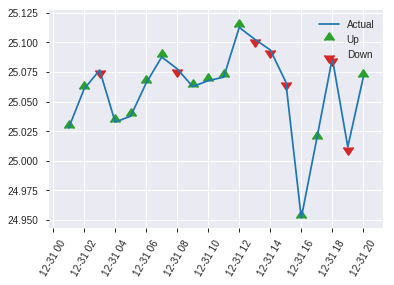


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.1932189705643583
RMSE: 0.43956679875117766
LogLoss: 0.5680878924083171
Mean Per-Class Error: 0.2642277630835983
AUC: 0.7914276798716158
pr_auc: 0.794297769900929
Gini: 0.5828553597432315
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5233379587379807: 


,0,1,Error,Rate
0,161.0,92.0,0.3636,(92.0/253.0)
1,50.0,216.0,0.188,(50.0/266.0)
Total,211.0,308.0,0.2736,(142.0/519.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5233380,0.7526132,216.0
max f2,0.0699814,0.8581606,367.0
max f0point5,0.6013757,0.7555178,163.0
max accuracy,0.6013757,0.7341040,163.0
max precision,0.9689273,1.0,0.0
max recall,0.0467348,1.0,378.0
max specificity,0.9689273,1.0,0.0
max absolute_mcc,0.6013757,0.4749084,163.0
max min_per_class_accuracy,0.5590413,0.7193676,185.0
max mean_per_class_accuracy,0.6013757,0.7357722,163.0


Gains/Lift Table: Avg response rate: 51.25 %, avg score: 49.69 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0115607,0.9403898,1.9511278,1.9511278,1.0,0.9479254,1.0,0.9479254,0.0225564,0.0225564,95.1127820,95.1127820
,2,0.0211946,0.8971950,1.9511278,1.9511278,1.0,0.9166715,1.0,0.9337191,0.0187970,0.0413534,95.1127820,95.1127820
,3,0.0308285,0.8550396,1.9511278,1.9511278,1.0,0.8794589,1.0,0.9167628,0.0187970,0.0601504,95.1127820,95.1127820
,4,0.0404624,0.8129443,1.5609023,1.8582170,0.8,0.8334322,0.9523810,0.8969222,0.0150376,0.0751880,56.0902256,85.8216971
,5,0.0500963,0.7953113,1.1706767,1.7259977,0.6,0.8057097,0.8846154,0.8793813,0.0112782,0.0864662,17.0676692,72.5997687
,6,0.1001927,0.7512380,1.7259977,1.7259977,0.8846154,0.7711274,0.8846154,0.8252543,0.0864662,0.1729323,72.5997687,72.5997687
,7,0.1502890,0.7145110,1.8010411,1.7510121,0.9230769,0.7345389,0.8974359,0.7950159,0.0902256,0.2631579,80.1041064,75.1012146
,8,0.2003854,0.6927512,1.4258242,1.6697152,0.7307692,0.7038876,0.8557692,0.7722338,0.0714286,0.3345865,42.5824176,66.9715153
,9,0.3005780,0.6393598,1.6134326,1.6509543,0.8269231,0.6662155,0.8461538,0.7368944,0.1616541,0.4962406,61.3432620,65.0954309
,10,0.4007707,0.6134709,1.1256507,1.5196284,0.5769231,0.6249618,0.7788462,0.7089112,0.1127820,0.6090226,12.5650665,51.9628398


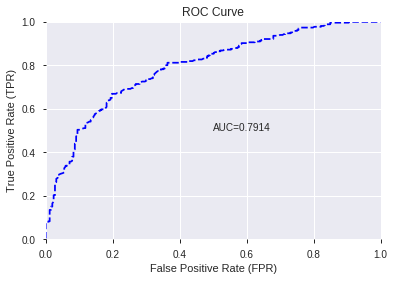

This function is available for GLM models only


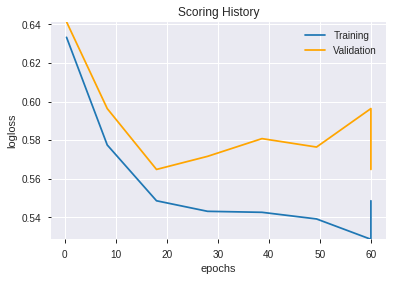

--2019-08-25 14:27:01--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.178.203
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.178.203|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


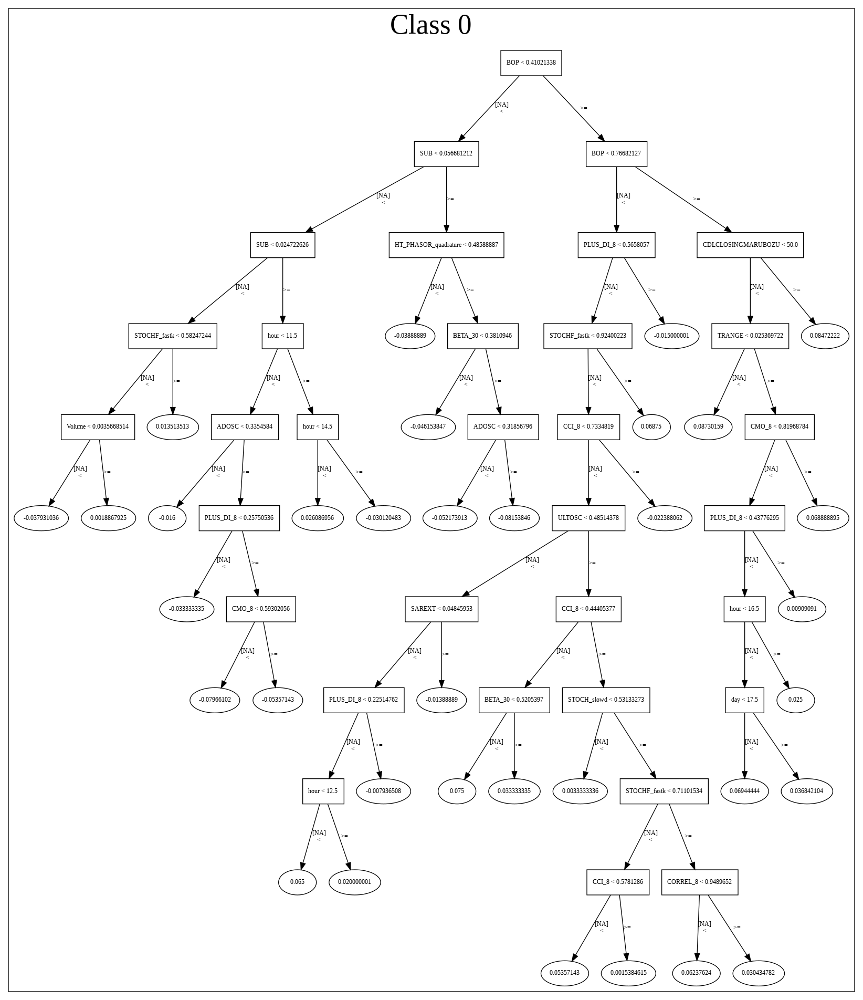

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190825_140701_model_8',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190825_140701_model_8',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_74_sid_9d08',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['BOP',
 'CDLCLOSINGMARUBOZU',
 'SUB',
 'DIV',
 'TRANGE',
 'CDLMARUBOZU',
 'CDLHANGINGMAN',
 'STOCHF_fastk',
 'WILLR_8',
 'CCI_8',
 'CDLENGULFING',
 'CDLSHORTLINE',
 'ADOSC',
 'STOCHRSI_fastk',
 'CDLLONGLINE',
 'ULTOSC',
 'CDLDOJI',
 'CDL3OUTSIDE',
 'CDLTAKURI',
 'WILLR_20',
 'CDLLONGLEGGEDDOJI',
 'CDLBELTHOLD',
 'STOCHRSI_fastd',
 'CDLHAMMER',
 'STOCH_slowk',
 'WILLR_24',
 'ROCR_14',
 'ROC_14',
 'WILLR_30',
 'MINUS_DI_12',
 'CMO_30',
 'MOM_14',
 'ROCR100_14',
 'ROC_8',
 'WILLR_12',
 'MINUS_DI_8',
 'ROCP_14',
 'ROCP_8',
 'CDLDRAGONFLYDOJI',
 'MOM_12',
 'MOM_8',
 'STOCHF_fastd',
 'ROCR_12',
 'ROCR100_12',
 'ROCR100_8',
 'CCI_14',
 'ROC_12',
 'ROCR_8',
 'RSI_30',
 'WILLR_14',
 'RSI_24',
 'ROCP_12',
 'CMO_24',
 'RSI_8',
 'CCI_30',
 'CCI_12',
 'RSI_20',
 'CCI_24',
 'CCI_20',
 'CMO_14',
 'CMO_12',
 'RSI_14',
 'RSI_12',
 'CMO_8',
 'CMO_20']

In [47]:
# DeepLearning with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="DeepLearning",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190825_142758_model_1,0.781814,0.563554,0.307765,0.43757,0.191467


,variable,relative_importance,scaled_importance,percentage
0,SUB,3.875773,1.000000,0.204187
1,DIV,3.819430,0.985463,0.201219
2,BOP,0.976539,0.251960,0.051447
3,CMO_12,0.725870,0.187284,0.038241
4,MOM_12,0.537355,0.138645,0.028309
5,CMO_20,0.481051,0.124118,0.025343
6,CCI_8,0.465173,0.120021,0.024507
7,CCI_12,0.434366,0.112072,0.022884
8,CCI_14,0.406839,0.104970,0.021433
9,WILLR_8,0.403983,0.104233,0.021283


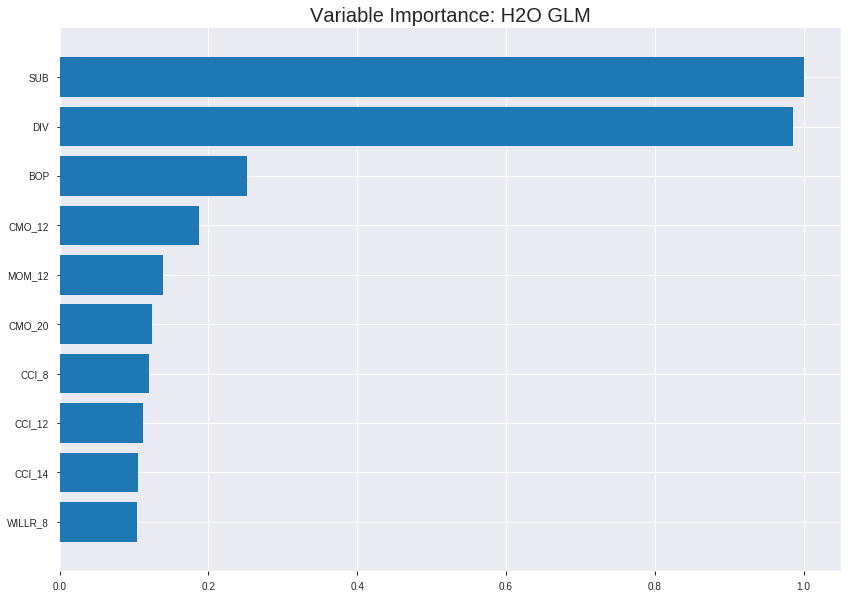

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190825_142758_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.18664239646968095
RMSE: 0.43202129168558456
LogLoss: 0.5532610668987565
Null degrees of freedom: 3627
Residual degrees of freedom: 3562
Null deviance: 5003.973061660213
Residual deviance: 4014.4623014173776
AIC: 4146.462301417378
AUC: 0.7881209808623861
pr_auc: 0.8043673616765887
Gini: 0.5762419617247723
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.43485937187791895: 


,0,1,Error,Rate
0,957.0,705.0,0.4242,(705.0/1662.0)
1,311.0,1655.0,0.1582,(311.0/1966.0)
Total,1268.0,2360.0,0.28,(1016.0/3628.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4348594,0.7651410,238.0
max f2,0.1781656,0.8637382,343.0
max f0point5,0.6019330,0.7455548,167.0
max accuracy,0.4934128,0.7210584,215.0
max precision,0.9662367,1.0,0.0
max recall,0.0386964,1.0,394.0
max specificity,0.9662367,1.0,0.0
max absolute_mcc,0.4405514,0.4366983,236.0
max min_per_class_accuracy,0.5726708,0.7135981,180.0
max mean_per_class_accuracy,0.5526765,0.7175384,189.0


Gains/Lift Table: Avg response rate: 54.19 %, avg score: 54.19 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101985,0.9347859,1.7456215,1.7456215,0.9459459,0.9454766,0.9459459,0.9454766,0.0178026,0.0178026,74.5621512,74.5621512
,2,0.0201213,0.9247017,1.7941110,1.7695341,0.9722222,0.9301921,0.9589041,0.9379390,0.0178026,0.0356053,79.4110998,76.9534135
,3,0.0300441,0.9165829,1.7428507,1.7607213,0.9444444,0.9207561,0.9541284,0.9322639,0.0172940,0.0528993,74.2850684,76.0721252
,4,0.0402426,0.9060076,1.6458717,1.7316155,0.8918919,0.9111559,0.9383562,0.9269146,0.0167854,0.0696846,64.5871711,73.1615546
,5,0.0501654,0.8963188,1.6403301,1.7135591,0.8888889,0.9011434,0.9285714,0.9218170,0.0162767,0.0859613,64.0330055,71.3559076
,6,0.1000551,0.8508412,1.6312675,1.6725266,0.8839779,0.8731037,0.9063361,0.8975274,0.0813835,0.1673449,63.1267458,67.2526616
,7,0.1502205,0.8077820,1.5513286,1.6320532,0.8406593,0.8286731,0.8844037,0.8745339,0.0778230,0.2451679,55.1328631,63.2053161
,8,0.2001103,0.7787228,1.6108766,1.6267736,0.8729282,0.7920472,0.8815427,0.8539690,0.0803662,0.3255341,61.0876615,62.6773609
,9,0.3001654,0.7178428,1.3420882,1.5318785,0.7272727,0.7482544,0.8301194,0.8187308,0.1342828,0.4598169,34.2088227,53.1878481
,10,0.3999449,0.6550608,1.2540369,1.4625617,0.6795580,0.6869270,0.7925569,0.7858480,0.1251272,0.5849440,25.4036859,46.2561688




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.18619621142918932
RMSE: 0.4315045902759197
LogLoss: 0.5519023703050429
Null degrees of freedom: 1035
Residual degrees of freedom: 970
Null deviance: 1446.188268020725
Residual deviance: 1143.5417112720488
AIC: 1275.5417112720488
AUC: 0.7911168269589205
pr_auc: 0.7650777959747055
Gini: 0.582233653917841
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.37564430594007403: 


,0,1,Error,Rate
0,303.0,223.0,0.424,(223.0/526.0)
1,72.0,438.0,0.1412,(72.0/510.0)
Total,375.0,661.0,0.2847,(295.0/1036.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3756443,0.7480786,252.0
max f2,0.1634096,0.8471424,346.0
max f0point5,0.6636689,0.7265877,126.0
max accuracy,0.4741023,0.7277992,216.0
max precision,0.9534560,1.0,0.0
max recall,0.0742063,1.0,383.0
max specificity,0.9534560,1.0,0.0
max absolute_mcc,0.4741023,0.4600187,216.0
max min_per_class_accuracy,0.5360356,0.7091255,190.0
max mean_per_class_accuracy,0.4741023,0.7286886,216.0


Gains/Lift Table: Avg response rate: 49.23 %, avg score: 50.10 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0106178,0.9199686,2.0313725,2.0313725,1.0,0.9348833,1.0,0.9348833,0.0215686,0.0215686,103.1372549,103.1372549
,2,0.0202703,0.8990624,2.0313725,2.0313725,1.0,0.9117529,1.0,0.9238688,0.0196078,0.0411765,103.1372549,103.1372549
,3,0.0308880,0.8813569,1.8467023,1.9678922,0.9090909,0.8892245,0.96875,0.9119598,0.0196078,0.0607843,84.6702317,96.7892157
,4,0.0405405,0.8712489,1.4219608,1.8379085,0.7,0.8762689,0.9047619,0.9034620,0.0137255,0.0745098,42.1960784,83.7908497
,5,0.0501931,0.8610249,1.2188235,1.7188537,0.6,0.8666941,0.8461538,0.8963912,0.0117647,0.0862745,21.8823529,71.8853695
,6,0.1003861,0.8164369,1.6407240,1.6797888,0.8076923,0.8361611,0.8269231,0.8662762,0.0823529,0.1686275,64.0723982,67.9788839
,7,0.1505792,0.7871219,1.7579186,1.7058321,0.8653846,0.8008143,0.8397436,0.8444556,0.0882353,0.2568627,75.7918552,70.5832076
,8,0.2007722,0.7545056,1.5625943,1.6700226,0.7692308,0.7718098,0.8221154,0.8262941,0.0784314,0.3352941,56.2594268,67.0022624
,9,0.3001931,0.6790673,1.5383210,1.6264044,0.7572816,0.7201974,0.8006431,0.7911560,0.1529412,0.4882353,53.8320959,62.6404388
,10,0.4005792,0.6144331,1.1914781,1.5174108,0.5865385,0.6481598,0.7469880,0.7553208,0.1196078,0.6078431,19.1478130,51.7410820



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-08-25 14:27:58,0.000 sec,2,.22E2,66,1.3557989,1.3705650
,2019-08-25 14:27:58,0.028 sec,4,.14E2,66,1.3455976,1.3598532
,2019-08-25 14:27:58,0.057 sec,6,.85E1,66,1.3322805,1.3460704
,2019-08-25 14:27:58,0.088 sec,8,.53E1,66,1.3153258,1.3286928
,2019-08-25 14:27:58,0.115 sec,10,.33E1,66,1.2944456,1.3073247
---,---,---,---,---,---,---,---
,2019-08-25 14:27:59,0.613 sec,52,.15E-3,66,1.1083382,1.1049732
,2019-08-25 14:27:59,0.642 sec,54,.92E-4,66,1.1075643,1.1042764
,2019-08-25 14:27:59,0.670 sec,56,.57E-4,66,1.1069481,1.1038897
,2019-08-25 14:27:59,0.698 sec,58,.35E-4,66,1.1065221,1.1038047



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7244701348747592)

('F1', 0.7535321821036106)

('auc', 0.7818137240334037)

('logloss', 0.5635535374316977)

('mean_per_class_error', 0.2761374780825582)

('rmse', 0.43756960086371055)

('mse', 0.19146715560002697)

glm prediction progress: |████████████████████████████████████████████████| 100%


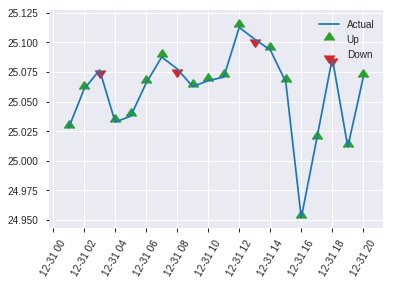


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.19146715560002697
RMSE: 0.43756960086371055
LogLoss: 0.5635535374316977
Null degrees of freedom: 518
Residual degrees of freedom: 453
Null deviance: 720.959908525584
Residual deviance: 584.968571854102
AIC: 716.968571854102
AUC: 0.7818137240334037
pr_auc: 0.7701891431762485
Gini: 0.5636274480668073
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3965399964150649: 


,0,1,Error,Rate
0,122.0,131.0,0.5178,(131.0/253.0)
1,26.0,240.0,0.0977,(26.0/266.0)
Total,148.0,371.0,0.3025,(157.0/519.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3965400,0.7535322,278.0
max f2,0.1696064,0.8577952,356.0
max f0point5,0.6640480,0.7286213,159.0
max accuracy,0.5675260,0.7244701,203.0
max precision,0.9909718,1.0,0.0
max recall,0.1192377,1.0,371.0
max specificity,0.9909718,1.0,0.0
max absolute_mcc,0.5675260,0.4483851,203.0
max min_per_class_accuracy,0.5864522,0.7105263,191.0
max mean_per_class_accuracy,0.5675260,0.7238625,203.0


Gains/Lift Table: Avg response rate: 51.25 %, avg score: 55.58 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0115607,0.9575963,1.9511278,1.9511278,1.0,0.9738366,1.0,0.9738366,0.0225564,0.0225564,95.1127820,95.1127820
,2,0.0211946,0.9388277,1.9511278,1.9511278,1.0,0.9454561,1.0,0.9609364,0.0187970,0.0413534,95.1127820,95.1127820
,3,0.0308285,0.9234744,1.9511278,1.9511278,1.0,0.9303256,1.0,0.9513705,0.0187970,0.0601504,95.1127820,95.1127820
,4,0.0404624,0.9140655,1.1706767,1.7653061,0.6,0.9204627,0.9047619,0.9440115,0.0112782,0.0714286,17.0676692,76.5306122
,5,0.0500963,0.9069313,1.5609023,1.7259977,0.8,0.9101214,0.8846154,0.9374942,0.0150376,0.0864662,56.0902256,72.5997687
,6,0.1001927,0.8484381,1.6509543,1.6884760,0.8461538,0.8744400,0.8653846,0.9059671,0.0827068,0.1691729,65.0954309,68.8475998
,7,0.1502890,0.8289236,1.6509543,1.6759688,0.8461538,0.8384911,0.8589744,0.8834751,0.0827068,0.2518797,65.0954309,67.5968768
,8,0.2003854,0.7961274,1.2757374,1.5759109,0.6538462,0.8132741,0.8076923,0.8659248,0.0639098,0.3157895,27.5737420,57.5910931
,9,0.3005780,0.7433589,1.4633459,1.5383892,0.75,0.7686103,0.7884615,0.8334867,0.1466165,0.4624060,46.3345865,53.8389242
,10,0.4007707,0.6839068,1.3132591,1.4821067,0.6730769,0.7100772,0.7596154,0.8026343,0.1315789,0.5939850,31.3259109,48.2106709


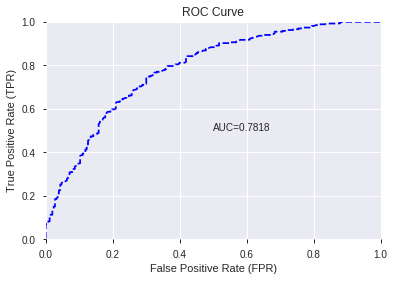

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


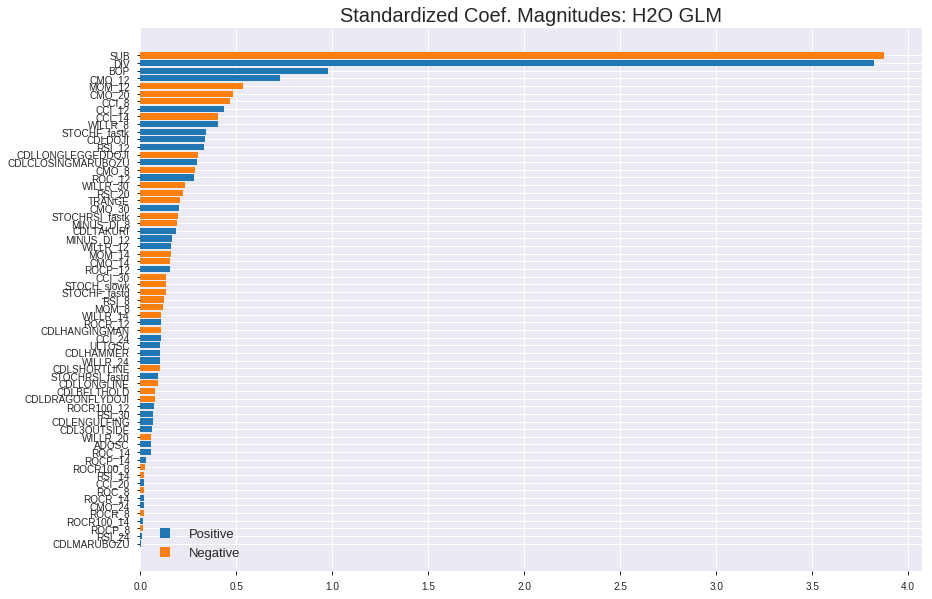

'log_likelihood'
--2019-08-25 14:28:09--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.130.99
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.130.99|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


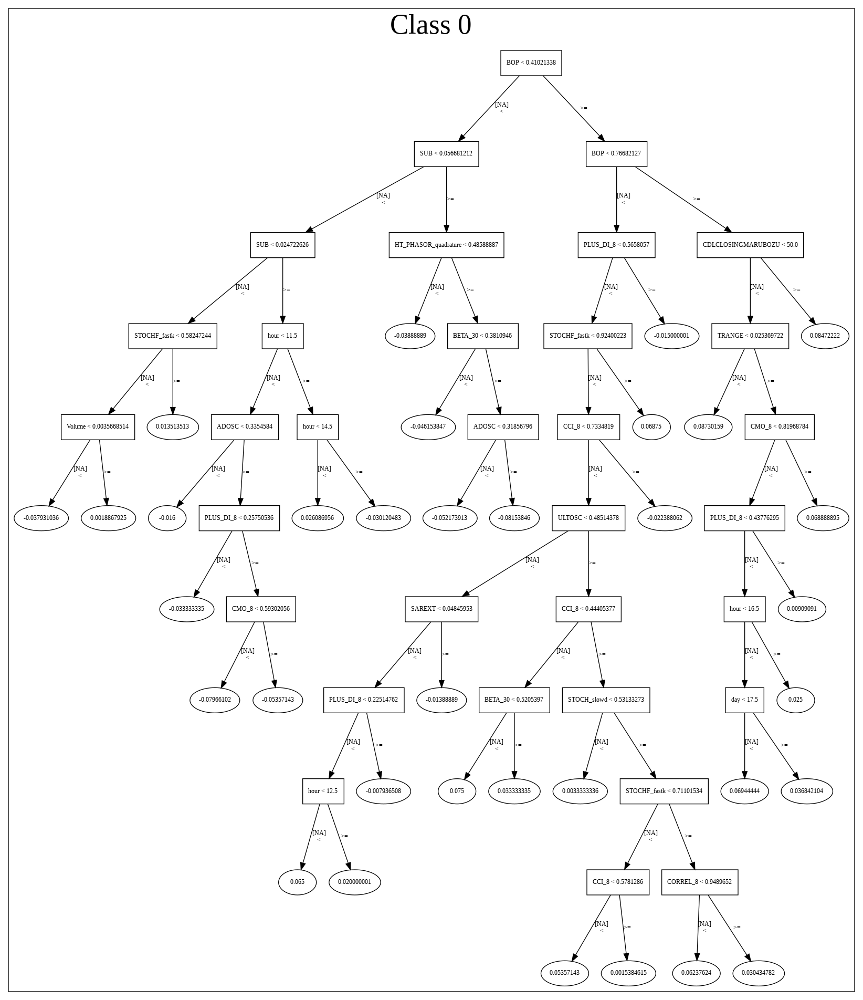

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190825_142758_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190825_142758_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_82_sid_9d08',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_82_s

['SUB',
 'DIV',
 'BOP',
 'CMO_12',
 'MOM_12',
 'CMO_20',
 'CCI_8',
 'CCI_12',
 'CCI_14',
 'WILLR_8',
 'STOCHF_fastk',
 'CDLDOJI',
 'RSI_12',
 'CDLLONGLEGGEDDOJI',
 'CDLCLOSINGMARUBOZU',
 'CMO_8',
 'ROC_12',
 'WILLR_30',
 'RSI_20',
 'TRANGE',
 'CMO_30',
 'STOCHRSI_fastk',
 'MINUS_DI_8',
 'CDLTAKURI',
 'MINUS_DI_12',
 'WILLR_12',
 'MOM_14',
 'CMO_14',
 'ROCP_12',
 'CCI_30',
 'STOCH_slowk',
 'STOCHF_fastd',
 'RSI_8',
 'MOM_8',
 'WILLR_14',
 'ROCR_12',
 'CDLHANGINGMAN',
 'CCI_24',
 'ULTOSC',
 'CDLHAMMER',
 'WILLR_24',
 'CDLSHORTLINE',
 'STOCHRSI_fastd',
 'CDLLONGLINE',
 'CDLBELTHOLD',
 'CDLDRAGONFLYDOJI',
 'ROCR100_12',
 'RSI_30',
 'CDLENGULFING',
 'CDL3OUTSIDE',
 'WILLR_20',
 'ADOSC',
 'ROC_14',
 'ROCP_14',
 'ROCR100_8',
 'RSI_14',
 'CCI_20',
 'ROC_8',
 'ROCR_14',
 'CMO_24',
 'ROCR_8',
 'ROCR100_14',
 'ROCP_8',
 'RSI_24',
 'CDLMARUBOZU']

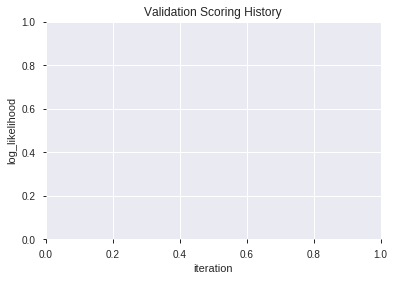

In [48]:
# GLM with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="GLM",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20190825_142906_model_6,0.793471,0.551226,0.287423,0.430749,0.185545
1,XGBoost_3_AutoML_20190825_142906,0.793463,0.553581,0.288723,0.431792,0.186445
2,XGBoost_2_AutoML_20190825_142906,0.792616,0.552255,0.293931,0.430212,0.185082
3,XGBoost_grid_1_AutoML_20190825_142906_model_1,0.792312,0.557344,0.303909,0.433072,0.187552
4,XGBoost_grid_1_AutoML_20190825_142906_model_3,0.791859,0.554623,0.299571,0.432073,0.186687
5,XGBoost_grid_1_AutoML_20190825_142906_model_4,0.791606,0.553481,0.295521,0.431955,0.186585
6,XGBoost_grid_1_AutoML_20190825_142906_model_2,0.791026,0.557113,0.280239,0.433187,0.187651
7,XGBoost_grid_1_AutoML_20190825_142906_model_7,0.786873,0.558351,0.291859,0.433317,0.187764
8,XGBoost_grid_1_AutoML_20190825_142906_model_5,0.786702,0.564029,0.274696,0.434481,0.188774
9,XGBoost_1_AutoML_20190825_142906,0.785387,0.559724,0.293159,0.434354,0.188663


,variable,relative_importance,scaled_importance,percentage
0,BOP,5143.615723,1.000000,0.329014
1,STOCHF_fastk,838.548767,0.163027,0.053638
2,CCI_8,547.431580,0.106429,0.035017
3,TRANGE,475.185425,0.092384,0.030395
4,DIV,443.978241,0.086316,0.028399
5,STOCHRSI_fastk,439.835876,0.085511,0.028134
6,ADOSC,424.031921,0.082438,0.027123
7,WILLR_8,404.633331,0.078667,0.025883
8,ULTOSC,394.259094,0.076650,0.025219
9,STOCH_slowk,355.269714,0.069070,0.022725


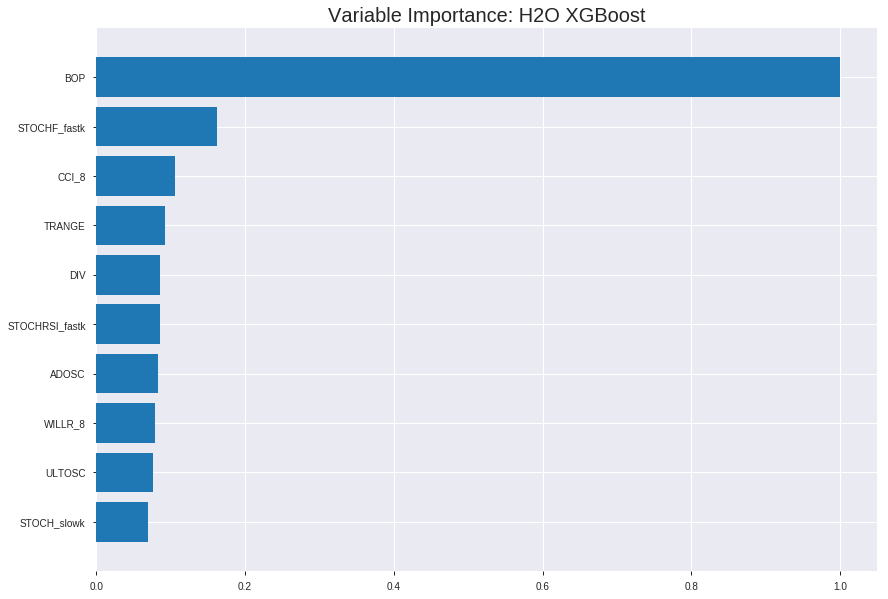

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20190825_142906_model_6


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.15343872781340143
RMSE: 0.3917125576406779
LogLoss: 0.47374193765305095
Mean Per-Class Error: 0.21765623297623993
AUC: 0.8720119284148209
pr_auc: 0.8905061837738287
Gini: 0.7440238568296418
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.49130011796951295: 


,0,1,Error,Rate
0,1118.0,544.0,0.3273,(544.0/1662.0)
1,279.0,1687.0,0.1419,(279.0/1966.0)
Total,1397.0,2231.0,0.2268,(823.0/3628.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4913001,0.8039076,221.0
max f2,0.2470505,0.8935448,323.0
max f0point5,0.6422586,0.8221093,147.0
max accuracy,0.5817813,0.7811466,177.0
max precision,0.9505997,1.0,0.0
max recall,0.1454579,1.0,368.0
max specificity,0.9505997,1.0,0.0
max absolute_mcc,0.5817813,0.5628005,177.0
max min_per_class_accuracy,0.5727634,0.7785800,183.0
max mean_per_class_accuracy,0.5817813,0.7823438,177.0


Gains/Lift Table: Avg response rate: 54.19 %, avg score: 54.08 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101985,0.9360249,1.8453713,1.8453713,1.0,0.9429856,1.0,0.9429856,0.0188199,0.0188199,84.5371312,84.5371312
,2,0.0201213,0.9172477,1.8453713,1.8453713,1.0,0.9253766,1.0,0.9343017,0.0183113,0.0371312,84.5371312,84.5371312
,3,0.0300441,0.9090369,1.8453713,1.8453713,1.0,0.9128658,1.0,0.9272219,0.0183113,0.0554425,84.5371312,84.5371312
,4,0.0402426,0.8987838,1.7954964,1.8327318,0.9729730,0.9036738,0.9931507,0.9212543,0.0183113,0.0737538,79.5496412,83.2731783
,5,0.0501654,0.8879298,1.8453713,1.8352319,1.0,0.8936584,0.9945055,0.9157958,0.0183113,0.0920651,84.5371312,83.5231909
,6,0.1000551,0.8305454,1.8147850,1.8250366,0.9834254,0.8561203,0.9889807,0.8860402,0.0905392,0.1826043,81.4785047,82.5036642
,7,0.1502205,0.7937246,1.7845349,1.8115113,0.9670330,0.8096919,0.9816514,0.8605441,0.0895219,0.2721261,78.4534895,81.1511288
,8,0.2001103,0.7646018,1.7230263,1.7894510,0.9337017,0.7791231,0.9696970,0.8402449,0.0859613,0.3580875,72.3026253,78.9450970
,9,0.3001654,0.7035831,1.5149329,1.6979450,0.8209366,0.7341897,0.9201102,0.8048932,0.1515768,0.5096643,51.4932923,69.7944954
,10,0.3999449,0.6450307,1.3916751,1.6215358,0.7541436,0.6758777,0.8787043,0.7727060,0.1388606,0.6485249,39.1675050,62.1535784




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.1897892987715493
RMSE: 0.4356481364261177
LogLoss: 0.5625330899640895
Mean Per-Class Error: 0.27779393126071716
AUC: 0.7853369865056288
pr_auc: 0.7619705112502906
Gini: 0.5706739730112576
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.33824409544467926: 


,0,1,Error,Rate
0,251.0,275.0,0.5228,(275.0/526.0)
1,51.0,459.0,0.1,(51.0/510.0)
Total,302.0,734.0,0.3147,(326.0/1036.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3382441,0.7379421,277.0
max f2,0.2208631,0.8365019,327.0
max f0point5,0.6117150,0.7307352,156.0
max accuracy,0.6117150,0.7229730,156.0
max precision,0.9521121,1.0,0.0
max recall,0.0872164,1.0,394.0
max specificity,0.9521121,1.0,0.0
max absolute_mcc,0.6117150,0.4491086,156.0
max min_per_class_accuracy,0.5674723,0.7196078,184.0
max mean_per_class_accuracy,0.5991000,0.7222061,164.0


Gains/Lift Table: Avg response rate: 49.23 %, avg score: 51.38 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0106178,0.9218278,2.0313725,2.0313725,1.0,0.9364600,1.0,0.9364600,0.0215686,0.0215686,103.1372549,103.1372549
,2,0.0202703,0.8969217,2.0313725,2.0313725,1.0,0.9074815,1.0,0.9226607,0.0196078,0.0411765,103.1372549,103.1372549
,3,0.0308880,0.8767165,1.6620321,1.9044118,0.8181818,0.8849826,0.9375,0.9097089,0.0176471,0.0588235,66.2032086,90.4411765
,4,0.0405405,0.8546705,1.4219608,1.7895425,0.7,0.8633700,0.8809524,0.8986758,0.0137255,0.0725490,42.1960784,78.9542484
,5,0.0501931,0.8417168,1.6250980,1.7579186,0.8,0.8491866,0.8653846,0.8891586,0.0156863,0.0882353,62.5098039,75.7918552
,6,0.1003861,0.7983162,1.4453997,1.6016591,0.7115385,0.8181419,0.7884615,0.8536503,0.0725490,0.1607843,44.5399698,60.1659125
,7,0.1505792,0.7727523,1.8751131,1.6928105,0.9230769,0.7836553,0.8333333,0.8303186,0.0941176,0.2549020,87.5113122,69.2810458
,8,0.2007722,0.7452885,1.6016591,1.6700226,0.7884615,0.7568848,0.8221154,0.8119602,0.0803922,0.3352941,60.1659125,67.0022624
,9,0.3001931,0.6887892,1.5185989,1.6198726,0.7475728,0.7202739,0.7974277,0.7815946,0.1509804,0.4862745,51.8598896,61.9872644
,10,0.4005792,0.6260468,1.3282051,1.5467801,0.6538462,0.6589832,0.7614458,0.7508679,0.1333333,0.6196078,32.8205128,54.6780061



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-25 14:29:26,12.375 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4581036,0.5,0.6931472,0.5,0.0,1.0,0.5077220
,2019-08-25 14:29:26,12.455 sec,5.0,0.4731896,0.6405846,0.8068012,0.8252648,1.8453713,0.2794928,0.4768511,0.6476249,0.7763364,0.7461203,1.6928105,0.3185328
,2019-08-25 14:29:26,12.507 sec,10.0,0.4547409,0.6048976,0.8180543,0.8331904,1.8453713,0.2750827,0.4627225,0.6200240,0.7770726,0.7527039,1.8620915,0.2953668
,2019-08-25 14:29:26,12.570 sec,15.0,0.4416130,0.5790739,0.8238179,0.8431679,1.8453713,0.2706725,0.4534808,0.6016054,0.7791471,0.7505574,2.0313725,0.2818533
,2019-08-25 14:29:26,12.634 sec,20.0,0.4321110,0.5597686,0.8286897,0.8484752,1.8453713,0.2657111,0.4475087,0.5892386,0.7814676,0.7544169,2.0313725,0.2799228
,2019-08-25 14:29:26,12.698 sec,25.0,0.4246377,0.5441880,0.8341398,0.8550981,1.8453713,0.2593716,0.4439822,0.5814511,0.7806345,0.7542096,2.0313725,0.2895753
,2019-08-25 14:29:26,12.765 sec,30.0,0.4186782,0.5313889,0.8387447,0.8593251,1.8453713,0.2662624,0.4414554,0.5758778,0.7820174,0.7537679,2.0313725,0.2953668
,2019-08-25 14:29:26,12.832 sec,35.0,0.4141203,0.5212727,0.8425603,0.8612502,1.8453713,0.2615766,0.4397606,0.5719318,0.7834489,0.7575411,2.0313725,0.3088803
,2019-08-25 14:29:26,12.911 sec,40.0,0.4107008,0.5137227,0.8455630,0.8638519,1.8453713,0.2593716,0.4385004,0.5691096,0.7834303,0.7580705,2.0313725,0.2799228
,2019-08-25 14:29:26,12.994 sec,45.0,0.4077523,0.5071503,0.8488117,0.8686435,1.8453713,0.2596472,0.4377699,0.5674561,0.7834004,0.7590448,2.0313725,0.2760618


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,5143.6157227,1.0,0.3290137
STOCHF_fastk,838.5487671,0.1630271,0.0536382
CCI_8,547.4315796,0.1064293,0.0350167
TRANGE,475.1854248,0.0923835,0.0303955
DIV,443.9782410,0.0863164,0.0283993
---,---,---,---
ROCP_12,15.0678101,0.0029294,0.0009638
RSI_14,13.6140270,0.0026468,0.0008708
RSI_8,12.5297546,0.0024360,0.0008015
CDLLONGLEGGEDDOJI,7.7238445,0.0015016,0.0004941



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7263969171483622)

('F1', 0.7609756097560976)

('auc', 0.7934708312282683)

('logloss', 0.5512257676125586)

('mean_per_class_error', 0.2732919254658386)

('rmse', 0.43074895937764657)

('mse', 0.18554466600492542)

xgboost prediction progress: |████████████████████████████████████████████| 100%


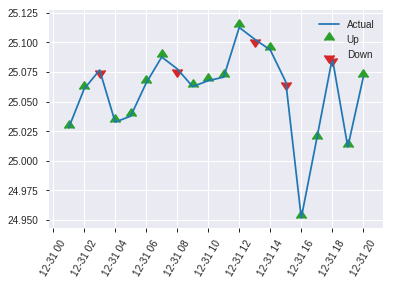


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.18554466600492542
RMSE: 0.43074895937764657
LogLoss: 0.5512257676125586
Mean Per-Class Error: 0.2732919254658386
AUC: 0.7934708312282683
pr_auc: 0.7851722555664928
Gini: 0.5869416624565367
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3646503686904907: 


,0,1,Error,Rate
0,138.0,115.0,0.4545,(115.0/253.0)
1,32.0,234.0,0.1203,(32.0/266.0)
Total,170.0,349.0,0.2832,(147.0/519.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3646504,0.7609756,270.0
max f2,0.2302919,0.8530007,325.0
max f0point5,0.5709782,0.7364341,197.0
max accuracy,0.5709782,0.7263969,197.0
max precision,0.9317676,1.0,0.0
max recall,0.1116214,1.0,383.0
max specificity,0.9317676,1.0,0.0
max absolute_mcc,0.4644578,0.4584796,243.0
max min_per_class_accuracy,0.5657654,0.7218045,201.0
max mean_per_class_accuracy,0.5709782,0.7267081,197.0


Gains/Lift Table: Avg response rate: 51.25 %, avg score: 51.03 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0115607,0.8987952,1.9511278,1.9511278,1.0,0.9167487,1.0,0.9167487,0.0225564,0.0225564,95.1127820,95.1127820
,2,0.0211946,0.8806570,1.5609023,1.7737526,0.8,0.8868613,0.9090909,0.9031635,0.0150376,0.0375940,56.0902256,77.3752563
,3,0.0308285,0.8615912,1.9511278,1.8291823,1.0,0.8722697,0.9375,0.8935092,0.0187970,0.0563910,95.1127820,82.9182331
,4,0.0404624,0.8465481,1.5609023,1.7653061,0.8,0.8527821,0.9047619,0.8838123,0.0150376,0.0714286,56.0902256,76.5306122
,5,0.0500963,0.8311638,1.5609023,1.7259977,0.8,0.8403984,0.8846154,0.8754635,0.0150376,0.0864662,56.0902256,72.5997687
,6,0.1001927,0.7906077,1.8760844,1.8010411,0.9615385,0.8099409,0.9230769,0.8427022,0.0939850,0.1804511,87.6084442,80.1041064
,7,0.1502890,0.7621421,1.5759109,1.7259977,0.8076923,0.7774709,0.8846154,0.8209584,0.0789474,0.2593985,57.5910931,72.5997687
,8,0.2003854,0.7422932,1.5759109,1.6884760,0.8076923,0.7527342,0.8653846,0.8039024,0.0789474,0.3383459,57.5910931,68.8475998
,9,0.3005780,0.6914267,1.5008676,1.6259398,0.7692308,0.7182769,0.8333333,0.7753605,0.1503759,0.4887218,50.0867553,62.5939850
,10,0.4007707,0.6336863,0.9755639,1.4633459,0.5,0.6599041,0.75,0.7464964,0.0977444,0.5864662,-2.4436090,46.3345865


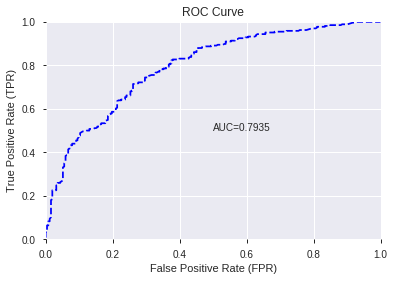

This function is available for GLM models only


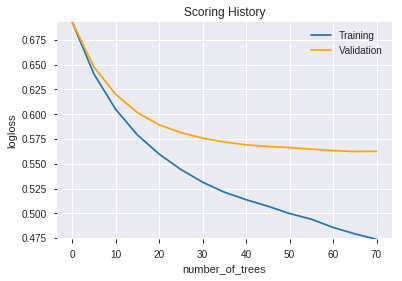

--2019-08-25 14:29:38--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.100.211
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.100.211|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoMo

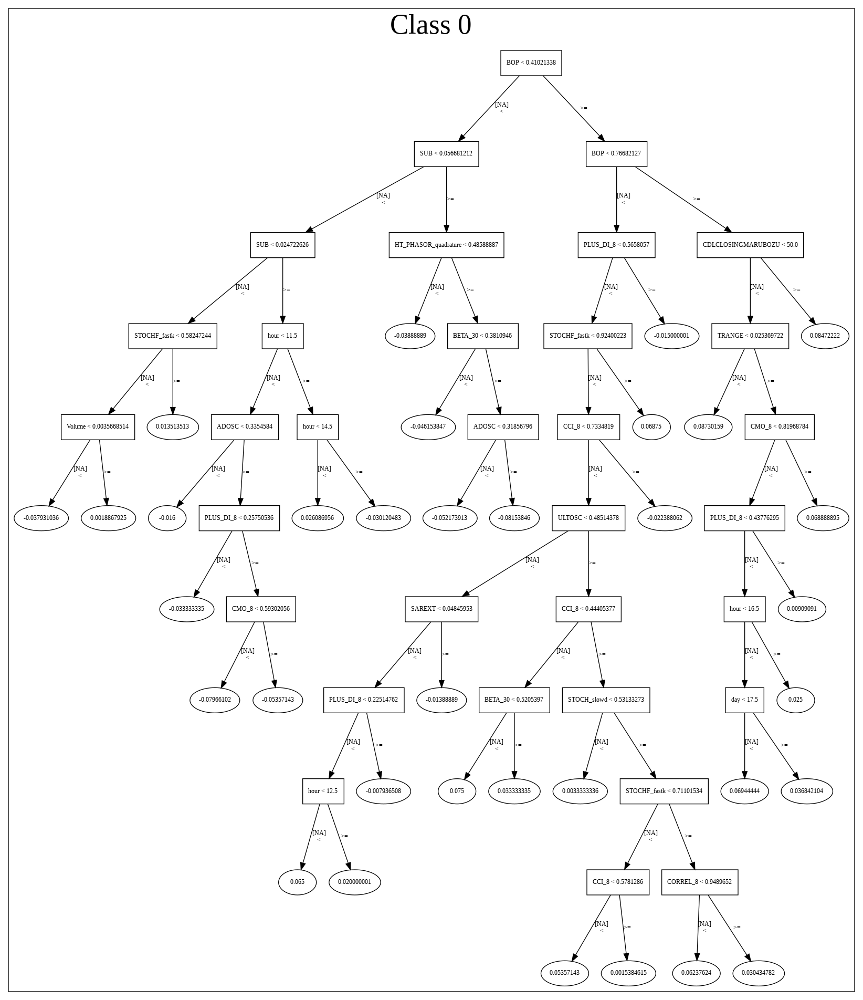

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20190825_142906_model_6',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20190825_142906_model_6',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_90_sid_9d08',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training

['BOP',
 'STOCHF_fastk',
 'CCI_8',
 'TRANGE',
 'DIV',
 'STOCHRSI_fastk',
 'ADOSC',
 'WILLR_8',
 'ULTOSC',
 'STOCH_slowk',
 'MOM_8',
 'CDLCLOSINGMARUBOZU',
 'CCI_20',
 'CCI_30',
 'SUB',
 'STOCHRSI_fastd',
 'MINUS_DI_8',
 'WILLR_12',
 'MINUS_DI_12',
 'CCI_24',
 'CCI_12',
 'CCI_14',
 'WILLR_30',
 'WILLR_14',
 'CMO_8',
 'MOM_14',
 'MOM_12',
 'ROC_8',
 'ROC_14',
 'WILLR_20',
 'CMO_30',
 'CMO_24',
 'CMO_20',
 'WILLR_24',
 'CMO_12',
 'CDLHAMMER',
 'CDLTAKURI',
 'CMO_14',
 'STOCHF_fastd',
 'CDLDRAGONFLYDOJI',
 'CDLHANGINGMAN',
 'ROC_12',
 'ROCP_8',
 'ROCP_14',
 'CDLLONGLINE',
 'CDLBELTHOLD',
 'CDLENGULFING',
 'CDL3OUTSIDE',
 'CDLSHORTLINE',
 'ROCR_14',
 'RSI_20',
 'RSI_30',
 'RSI_12',
 'RSI_24',
 'ROCP_12',
 'RSI_14',
 'RSI_8',
 'CDLLONGLEGGEDDOJI',
 'CDLDOJI']

In [49]:
# XGBoost with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="XGBoost",features_list=features_list)

In [50]:
# recursive feature elimination with cross validation
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'RFE' in features_to_include:
  from sklearn.feature_selection import RFECV
  from sklearn.svm import LinearSVC
  from sklearn.tree import DecisionTreeClassifier,ExtraTreeClassifier
  from sklearn.linear_model import LogisticRegression, LinearRegression

  bestfeatures = RFECV(ExtraTreeClassifier(random_state=1,criterion='entropy'), min_features_to_select=select_rfe, step=1,cv=5).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, RFECV, LinearSVC, DecisionTreeClassifier,ExtraTreeClassifier, LogisticRegression, LinearRegression
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list = []

55

['BBANDS_upperband_14_0_3',
 'BBANDS_upperband_14_2_5',
 'BBANDS_upperband_24_1_5',
 'BOP',
 'aroonup_8',
 'CCI_8',
 'MACDFIX_hist_8',
 'MFI_8',
 'ROC_8',
 'WILLR_8',
 'aroondown_12',
 'aroonup_12',
 'CCI_12',
 'ROCP_12',
 'RSI_12',
 'WILLR_12',
 'aroonup_14',
 'AROONOSC_14',
 'CCI_14',
 'MFI_14',
 'ROCP_14',
 'ROCR_14',
 'DX_20',
 'aroonup_24',
 'CCI_24',
 'MINUS_DI_24',
 'PLUS_DM_24',
 'WILLR_24',
 'aroondown_30',
 'aroonup_30',
 'ROCR100_30',
 'WILLR_30',
 'MACD',
 'STOCH_slowk',
 'STOCH_slowd',
 'STOCHF_fastk',
 'STOCHF_fastd',
 'STOCHRSI_fastk',
 'STOCHRSI_fastd',
 'ULTOSC',
 'TRANGE',
 'HT_PHASOR_inphase',
 'CDLCLOSINGMARUBOZU',
 'CDLLONGLEGGEDDOJI',
 'CDLSHORTLINE',
 'BETA_8',
 'LINEARREG_ANGLE_8',
 'STDDEV_8',
 'BETA_12',
 'CORREL_12',
 'BETA_14',
 'BETA_20',
 'CORREL_20',
 'CORREL_24',
 'BETA_30']

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190825_143357_model_9,0.767705,0.569620,0.297305,0.440578,0.194109
1,DeepLearning_grid_1_AutoML_20190825_143357_model_8,0.766917,0.577672,0.296435,0.444431,0.197519
2,DeepLearning_grid_1_AutoML_20190825_143357_model_6,0.766323,0.579556,0.306993,0.446155,0.199054
3,DeepLearning_grid_1_AutoML_20190825_143357_model_5,0.755201,0.586451,0.312922,0.448239,0.200918
4,DeepLearning_grid_1_AutoML_20190825_143357_model_4,0.750342,0.622340,0.339193,0.458105,0.209860
5,DeepLearning_grid_1_AutoML_20190825_143357_model_3,0.746887,0.670454,0.306606,0.467946,0.218973
6,DeepLearning_grid_1_AutoML_20190825_143357_model_2,0.734806,0.642257,0.351340,0.466993,0.218082
7,DeepLearning_1_AutoML_20190825_143357,0.719999,0.629856,0.372842,0.469735,0.220651
8,DeepLearning_grid_1_AutoML_20190825_143357_model_1,0.704880,0.863869,0.363198,0.511854,0.261995
9,DeepLearning_grid_1_AutoML_20190825_143357_model_7,0.691336,0.889898,0.350954,0.511006,0.261127


,variable,relative_importance,scaled_importance,percentage
0,CDLCLOSINGMARUBOZU,1.000000,1.000000,0.080344
1,BOP,0.729496,0.729496,0.058611
2,TRANGE,0.425044,0.425044,0.034150
3,CDLSHORTLINE,0.293694,0.293694,0.023597
4,ULTOSC,0.267921,0.267921,0.021526
5,CCI_8,0.267319,0.267319,0.021478
6,CDLLONGLEGGEDDOJI,0.262261,0.262261,0.021071
7,STOCHF_fastk,0.262142,0.262142,0.021062
8,WILLR_8,0.255703,0.255703,0.020544
9,STOCHRSI_fastk,0.239405,0.239405,0.019235


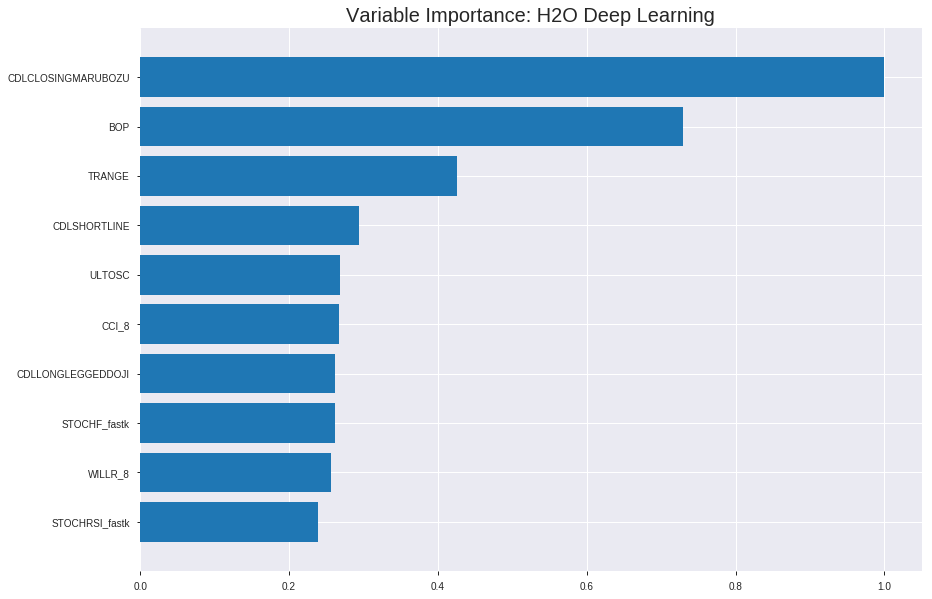

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190825_143357_model_9


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.18722110374874196
RMSE: 0.43269054039664645
LogLoss: 0.5554589022364811
Mean Per-Class Error: 0.28428562334659113
AUC: 0.7867878482946553
pr_auc: 0.8003573462597126
Gini: 0.5735756965893106
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.30676085253725227: 


,0,1,Error,Rate
0,758.0,904.0,0.5439,(904.0/1662.0)
1,187.0,1779.0,0.0951,(187.0/1966.0)
Total,945.0,2683.0,0.3007,(1091.0/3628.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3067609,0.7653259,274.0
max f2,0.1739483,0.8674633,331.0
max f0point5,0.6372056,0.7460085,144.0
max accuracy,0.4764962,0.7210584,214.0
max precision,0.9779776,1.0,0.0
max recall,0.0265527,1.0,393.0
max specificity,0.9779776,1.0,0.0
max absolute_mcc,0.4764962,0.4363685,214.0
max min_per_class_accuracy,0.6060115,0.7135981,160.0
max mean_per_class_accuracy,0.6351096,0.7157144,145.0


Gains/Lift Table: Avg response rate: 54.19 %, avg score: 52.53 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101985,0.9671724,1.7456215,1.7456215,0.9459459,0.9704954,0.9459459,0.9704954,0.0178026,0.0178026,74.5621512,74.5621512
,2,0.0201213,0.9610804,1.7428507,1.7442551,0.9444444,0.9642037,0.9452055,0.9673926,0.0172940,0.0350966,74.2850684,74.4255076
,3,0.0300441,0.9549403,1.6915904,1.7268612,0.9166667,0.9581940,0.9357798,0.9643546,0.0167854,0.0518820,69.1590370,72.6861228
,4,0.0402426,0.9486960,1.7954964,1.7442551,0.9729730,0.9512200,0.9452055,0.9610259,0.0183113,0.0701933,79.5496412,74.4255076
,5,0.0501654,0.9431696,1.6915904,1.7338379,0.9166667,0.9458455,0.9395604,0.9580232,0.0167854,0.0869786,69.1590370,73.3837881
,6,0.1000551,0.8017484,1.6720491,1.7030286,0.9060773,0.8672301,0.9228650,0.9127517,0.0834181,0.1703967,67.2049145,70.3028622
,7,0.1502205,0.7613392,1.4904922,1.6320532,0.8076923,0.7796167,0.8844037,0.8682920,0.0747711,0.2451679,49.0492214,63.2053161
,8,0.2001103,0.7343936,1.3967728,1.5733951,0.7569061,0.7473593,0.8526171,0.8381421,0.0696846,0.3148525,39.6772761,57.3395100
,9,0.3001654,0.6932107,1.3370046,1.4945983,0.7245179,0.7126973,0.8099174,0.7963271,0.1337742,0.4486267,33.7004560,49.4598253
,10,0.3999449,0.6623704,1.3406979,1.4562027,0.7265193,0.6777529,0.7891110,0.7667449,0.1337742,0.5824008,34.0697942,45.6202724




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.19204872196959832
RMSE: 0.43823363856463404
LogLoss: 0.5668853430131138
Mean Per-Class Error: 0.27975098784761054
AUC: 0.7770204279430403
pr_auc: 0.7497148343268973
Gini: 0.5540408558860805
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3104495015488536: 


,0,1,Error,Rate
0,275.0,251.0,0.4772,(251.0/526.0)
1,58.0,452.0,0.1137,(58.0/510.0)
Total,333.0,703.0,0.2983,(309.0/1036.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3104495,0.7452597,272.0
max f2,0.1896870,0.8455625,321.0
max f0point5,0.5840050,0.7134660,177.0
max accuracy,0.5840050,0.7200772,177.0
max precision,0.9777708,1.0,0.0
max recall,0.0326136,1.0,393.0
max specificity,0.9777708,1.0,0.0
max absolute_mcc,0.5840050,0.4404980,177.0
max min_per_class_accuracy,0.5970748,0.7110266,172.0
max mean_per_class_accuracy,0.5840050,0.7202490,177.0


Gains/Lift Table: Avg response rate: 49.23 %, avg score: 49.80 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0106178,0.9602711,2.0313725,2.0313725,1.0,0.9688390,1.0,0.9688390,0.0215686,0.0215686,103.1372549,103.1372549
,2,0.0202703,0.9521061,2.0313725,2.0313725,1.0,0.9570851,1.0,0.9632419,0.0196078,0.0411765,103.1372549,103.1372549
,3,0.0308880,0.9357353,1.6620321,1.9044118,0.8181818,0.9450347,0.9375,0.9569832,0.0176471,0.0588235,66.2032086,90.4411765
,4,0.0405405,0.9277734,1.8282353,1.8862745,0.9,0.9316940,0.9285714,0.9509619,0.0176471,0.0764706,82.8235294,88.6274510
,5,0.0501931,0.8651869,1.4219608,1.7969834,0.7,0.8985266,0.8846154,0.9408782,0.0137255,0.0901961,42.1960784,79.6983409
,6,0.1003861,0.7996573,1.5625943,1.6797888,0.7692308,0.8219000,0.8269231,0.8813891,0.0784314,0.1686275,56.2594268,67.9788839
,7,0.1505792,0.7626298,1.5235294,1.6277024,0.75,0.7777299,0.8012821,0.8468360,0.0764706,0.2450980,52.3529412,62.7702363
,8,0.2007722,0.7395126,1.6407240,1.6309578,0.8076923,0.7493962,0.8028846,0.8224761,0.0823529,0.3274510,64.0723982,63.0957768
,9,0.3001931,0.7011670,1.2424900,1.5023012,0.6116505,0.7184152,0.7395498,0.7880122,0.1235294,0.4509804,24.2490006,50.2301242
,10,0.4005792,0.6701906,1.4453997,1.4880416,0.7115385,0.6837914,0.7325301,0.7618942,0.1450980,0.5960784,44.5399698,48.8041578



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-25 14:47:22,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-08-25 14:47:24,5 min 45.148 sec,471 obs/sec,0.3577729,1,1298.0,0.5058358,0.8189792,-0.0307164,0.7203376,0.7320439,1.7456215,0.3550165,0.5132958,0.8380752,-0.0541417,0.7223831,0.6906752,2.0313725,0.3513514
,2019-08-25 14:48:06,6 min 26.783 sec,578 obs/sec,6.4189636,18,23288.0,0.4447179,0.5811300,0.2033103,0.7756982,0.7876659,1.7456215,0.2927233,0.4515215,0.5994142,0.1843188,0.7725211,0.7340774,1.8467023,0.2828185
,2019-08-25 14:48:48,7 min 8.612 sec,665 obs/sec,14.3023705,40,51889.0,0.4345137,0.5578338,0.2394515,0.7852693,0.7972759,1.8453713,0.2916207,0.4436409,0.5793641,0.2125432,0.7783997,0.7492341,2.0313725,0.2818533
,2019-08-25 14:49:29,7 min 50.110 sec,741 obs/sec,23.5474090,66,85430.0,0.4326905,0.5554589,0.2458203,0.7867878,0.8003573,1.7456215,0.3007166,0.4382336,0.5668853,0.2316218,0.7770204,0.7497148,2.0313725,0.2982625
,2019-08-25 14:50:11,8 min 31.444 sec,798 obs/sec,33.5989526,94,121897.0,0.4304030,0.5500855,0.2537737,0.7943267,0.8032960,1.7456215,0.2836273,0.4416323,0.5748473,0.2196576,0.7799262,0.7497051,2.0313725,0.2963320
,2019-08-25 14:50:52,9 min 12.711 sec,839 obs/sec,43.8897464,123,159232.0,0.4286219,0.5467168,0.2599370,0.7955429,0.8040300,1.8453713,0.2748071,0.4417635,0.5742889,0.2191937,0.7729143,0.7426036,2.0313725,0.3050193
,2019-08-25 14:51:33,9 min 53.893 sec,868 obs/sec,54.2841786,152,196943.0,0.4254784,0.5417961,0.2707523,0.8034818,0.8059414,1.8453713,0.2800441,0.4413318,0.5765545,0.2207192,0.7767819,0.7484026,2.0313725,0.3079151
,2019-08-25 14:52:16,10 min 36.505 sec,895 obs/sec,65.4313671,183,237385.0,0.4245002,0.5385234,0.2741018,0.8063219,0.8131991,1.8453713,0.2681918,0.4490129,0.5932699,0.1933572,0.7634254,0.7307397,2.0313725,0.2953668
,2019-08-25 14:52:20,10 min 40.642 sec,894 obs/sec,65.4313671,183,237385.0,0.4326905,0.5554589,0.2458203,0.7867878,0.8003573,1.7456215,0.3007166,0.4382336,0.5668853,0.2316218,0.7770204,0.7497148,2.0313725,0.2982625


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLCLOSINGMARUBOZU,1.0,1.0,0.0803444
BOP,0.7294960,0.7294960,0.0586109
TRANGE,0.4250442,0.4250442,0.0341499
CDLSHORTLINE,0.2936942,0.2936942,0.0235967
ULTOSC,0.2679208,0.2679208,0.0215259
---,---,---,---
MFI_14,0.1692398,0.1692398,0.0135975
BETA_12,0.1688409,0.1688409,0.0135654
ROC_8,0.1675263,0.1675263,0.0134598
ROCP_12,0.1671260,0.1671260,0.0134276



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7302504816955684)

('F1', 0.7548387096774194)

('auc', 0.767704835210556)

('logloss', 0.5696199402244754)

('mean_per_class_error', 0.27059496567505725)

('rmse', 0.44057784325291277)

('mse', 0.1941088359653882)

deeplearning prediction progress: |███████████████████████████████████████| 100%


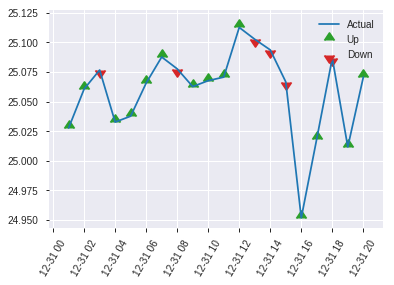


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.1941088359653882
RMSE: 0.44057784325291277
LogLoss: 0.5696199402244754
Mean Per-Class Error: 0.27059496567505725
AUC: 0.767704835210556
pr_auc: 0.7535371984773939
Gini: 0.535409670421112
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3263906075847055: 


,0,1,Error,Rate
0,133.0,120.0,0.4743,(120.0/253.0)
1,32.0,234.0,0.1203,(32.0/266.0)
Total,165.0,354.0,0.2929,(152.0/519.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3263906,0.7548387,261.0
max f2,0.0917740,0.8654474,356.0
max f0point5,0.5660955,0.7323232,198.0
max accuracy,0.5660955,0.7302505,198.0
max precision,0.9596667,1.0,0.0
max recall,0.0510873,1.0,374.0
max specificity,0.9596667,1.0,0.0
max absolute_mcc,0.5660955,0.4601040,198.0
max min_per_class_accuracy,0.6028992,0.7142857,185.0
max mean_per_class_accuracy,0.5660955,0.7294050,198.0


Gains/Lift Table: Avg response rate: 51.25 %, avg score: 49.25 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0115607,0.9420590,1.9511278,1.9511278,1.0,0.9506961,1.0,0.9506961,0.0225564,0.0225564,95.1127820,95.1127820
,2,0.0211946,0.9302651,1.9511278,1.9511278,1.0,0.9351592,1.0,0.9436339,0.0187970,0.0413534,95.1127820,95.1127820
,3,0.0308285,0.9190970,1.9511278,1.9511278,1.0,0.9255663,1.0,0.9379877,0.0187970,0.0601504,95.1127820,95.1127820
,4,0.0404624,0.8677481,1.5609023,1.8582170,0.8,0.8998212,0.9523810,0.9289005,0.0150376,0.0751880,56.0902256,85.8216971
,5,0.0500963,0.8150017,1.5609023,1.8010411,0.8,0.8373206,0.9230769,0.9112890,0.0150376,0.0902256,56.0902256,80.1041064
,6,0.1001927,0.7578127,1.5759109,1.6884760,0.8076923,0.7856957,0.8653846,0.8484923,0.0789474,0.1691729,57.5910931,68.8475998
,7,0.1502890,0.7385732,1.2757374,1.5508965,0.6538462,0.7471790,0.7948718,0.8147212,0.0639098,0.2330827,27.5737420,55.0896472
,8,0.2003854,0.7156541,1.3507808,1.5008676,0.6923077,0.7269752,0.7692308,0.7927847,0.0676692,0.3007519,35.0780798,50.0867553
,9,0.3005780,0.6841766,1.3507808,1.4508386,0.6923077,0.6983519,0.7435897,0.7613071,0.1353383,0.4360902,35.0780798,45.0838635
,10,0.4007707,0.6579579,1.4258242,1.4445850,0.7307692,0.6703533,0.7403846,0.7385687,0.1428571,0.5789474,42.5824176,44.4585020


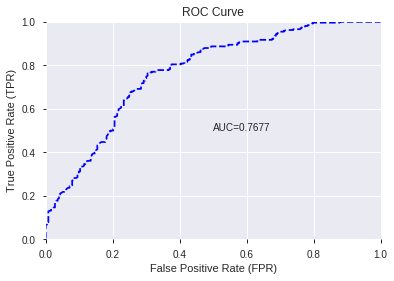

This function is available for GLM models only


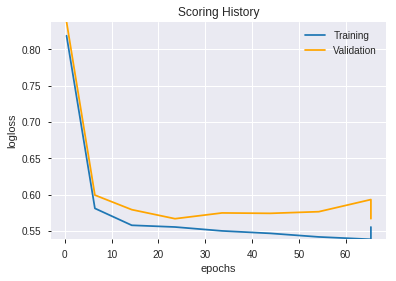

--2019-08-25 14:52:34--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.217.33.12
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.217.33.12|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


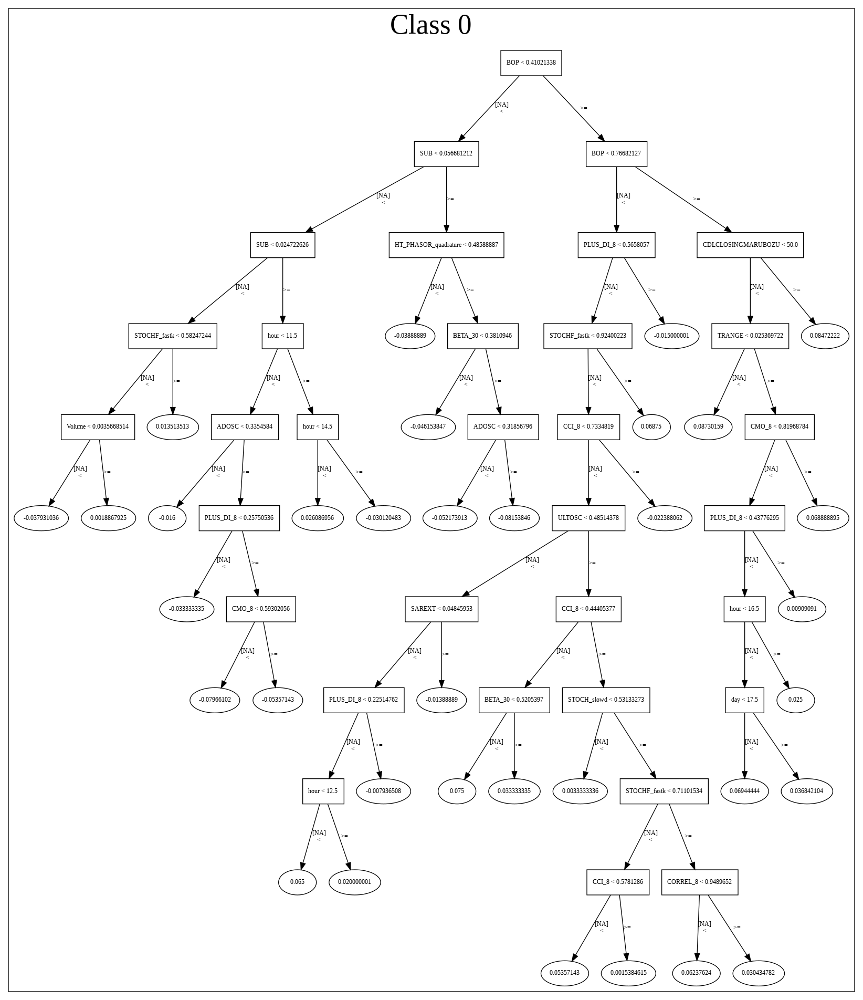

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190825_143357_model_9',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190825_143357_model_9',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_98_sid_9d08',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['CDLCLOSINGMARUBOZU',
 'BOP',
 'TRANGE',
 'CDLSHORTLINE',
 'ULTOSC',
 'CCI_8',
 'CDLLONGLEGGEDDOJI',
 'STOCHF_fastk',
 'WILLR_8',
 'STOCHRSI_fastk',
 'CORREL_12',
 'WILLR_12',
 'aroonup_24',
 'PLUS_DM_24',
 'CORREL_24',
 'CORREL_20',
 'STDDEV_8',
 'aroonup_12',
 'MACD',
 'aroonup_30',
 'MFI_8',
 'STOCHRSI_fastd',
 'aroondown_30',
 'BETA_30',
 'aroonup_14',
 'MINUS_DI_24',
 'LINEARREG_ANGLE_8',
 'aroonup_8',
 'CCI_14',
 'BBANDS_upperband_14_0_3',
 'STOCHF_fastd',
 'WILLR_30',
 'WILLR_24',
 'RSI_12',
 'DX_20',
 'ROCR_14',
 'AROONOSC_14',
 'STOCH_slowk',
 'aroondown_12',
 'BETA_8',
 'MACDFIX_hist_8',
 'BETA_20',
 'BBANDS_upperband_14_2_5',
 'HT_PHASOR_inphase',
 'BETA_14',
 'CCI_24',
 'BBANDS_upperband_24_1_5',
 'STOCH_slowd',
 'CCI_12',
 'ROCR100_30',
 'MFI_14',
 'BETA_12',
 'ROC_8',
 'ROCP_12',
 'ROCP_14']

In [51]:
# DeepLearning with recursive feature elimination with cross validation
model_train(feature_name='RFE',model_algo="DeepLearning",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190825_145331_model_1,0.769332,0.567247,0.294556,0.439933,0.193541


,variable,relative_importance,scaled_importance,percentage
0,BOP,0.707599,1.000000,0.163266
1,TRANGE,0.285771,0.403859,0.065937
2,CDLCLOSINGMARUBOZU,0.272538,0.385158,0.062883
3,WILLR_8,0.261467,0.369513,0.060329
4,STOCHF_fastk,0.209719,0.296381,0.048389
5,CCI_8,0.205843,0.290903,0.047495
6,ULTOSC,0.173848,0.245687,0.040112
7,WILLR_12,0.158489,0.223981,0.036569
8,STOCH_slowd,0.138682,0.195989,0.031998
9,PLUS_DM_24,0.125172,0.176897,0.028881


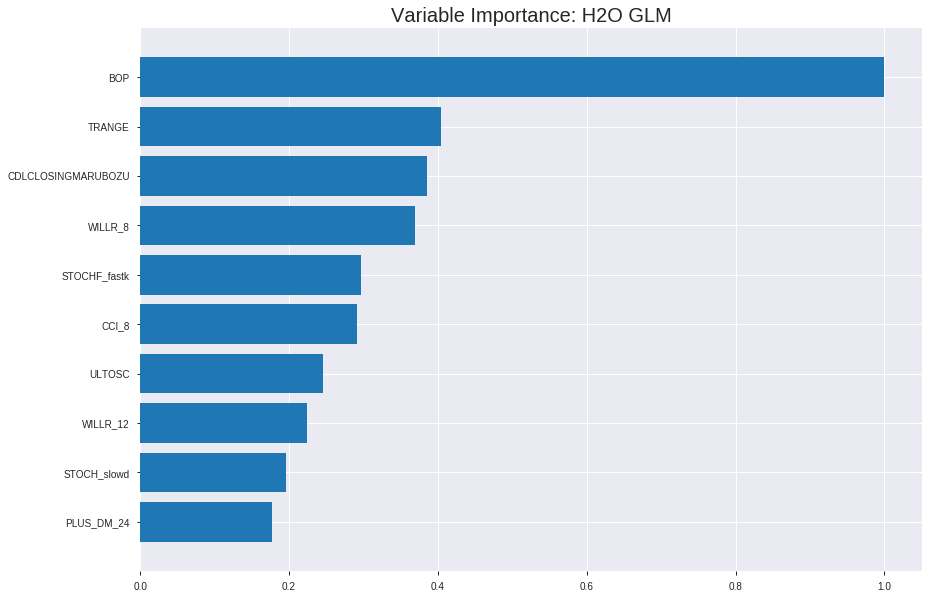

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190825_145331_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.1887058765954158
RMSE: 0.43440289662410836
LogLoss: 0.558586260434531
Null degrees of freedom: 3627
Residual degrees of freedom: 3572
Null deviance: 5003.973061660213
Residual deviance: 4053.101905712957
AIC: 4165.101905712957
AUC: 0.781571309126388
pr_auc: 0.7927716411254674
Gini: 0.5631426182527759
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4603195369653489: 


,0,1,Error,Rate
0,985.0,677.0,0.4073,(677.0/1662.0)
1,335.0,1631.0,0.1704,(335.0/1966.0)
Total,1320.0,2308.0,0.2789,(1012.0/3628.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4603195,0.7632195,232.0
max f2,0.2097634,0.8662054,339.0
max f0point5,0.5963243,0.7410262,174.0
max accuracy,0.5082812,0.7246417,215.0
max precision,0.9670738,1.0,0.0
max recall,0.0418612,1.0,395.0
max specificity,0.9670738,1.0,0.0
max absolute_mcc,0.5082812,0.4429587,215.0
max min_per_class_accuracy,0.5776065,0.7117930,183.0
max mean_per_class_accuracy,0.5264566,0.7191173,207.0


Gains/Lift Table: Avg response rate: 54.19 %, avg score: 54.19 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101985,0.9256066,1.6957466,1.6957466,0.9189189,0.9392997,0.9189189,0.9392997,0.0172940,0.0172940,69.5746611,69.5746611
,2,0.0201213,0.9137439,1.7941110,1.7442551,0.9722222,0.9198353,0.9452055,0.9297008,0.0178026,0.0350966,79.4110998,74.4255076
,3,0.0300441,0.8998898,1.6915904,1.7268612,0.9166667,0.9068255,0.9357798,0.9221457,0.0167854,0.0518820,69.1590370,72.6861228
,4,0.0402426,0.8912466,1.6458717,1.7063365,0.8918919,0.8953212,0.9246575,0.9153477,0.0167854,0.0686673,64.5871711,70.6336487
,5,0.0501654,0.8807300,1.7941110,1.7236985,0.9722222,0.8863621,0.9340659,0.9096143,0.0178026,0.0864700,79.4110998,72.3698479
,6,0.1000551,0.8173883,1.5802904,1.6521919,0.8563536,0.8470640,0.8953168,0.8784253,0.0788403,0.1653103,58.0290350,65.2191946
,7,0.1502205,0.7758605,1.5006316,1.6015791,0.8131868,0.7963907,0.8678899,0.8510303,0.0752798,0.2405900,50.0631617,60.1579139
,8,0.2001103,0.7458007,1.4171636,1.5556023,0.7679558,0.7600693,0.8429752,0.8283527,0.0707019,0.3112920,41.7163604,55.5602263
,9,0.3001654,0.6942697,1.3776739,1.4962928,0.7465565,0.7192942,0.8108356,0.7919999,0.1378433,0.4491353,37.7673900,49.6292809
,10,0.3999449,0.6472302,1.2642323,1.4383976,0.6850829,0.6701407,0.7794624,0.7615981,0.1261445,0.5752798,26.4232280,43.8397625




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.1922034312576627
RMSE: 0.43841011764974436
LogLoss: 0.5678340040390681
Null degrees of freedom: 1035
Residual degrees of freedom: 980
Null deviance: 1446.188268020725
Residual deviance: 1176.5520563689493
AIC: 1288.5520563689493
AUC: 0.7807649295459629
pr_auc: 0.7523583987177339
Gini: 0.5615298590919258
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4458162647827057: 


,0,1,Error,Rate
0,303.0,223.0,0.424,(223.0/526.0)
1,75.0,435.0,0.1471,(75.0/510.0)
Total,378.0,658.0,0.2876,(298.0/1036.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4458163,0.7448630,235.0
max f2,0.2545650,0.8424284,325.0
max f0point5,0.5375812,0.7237325,194.0
max accuracy,0.5375812,0.7345560,194.0
max precision,0.9525626,1.0,0.0
max recall,0.0612094,1.0,393.0
max specificity,0.9525626,1.0,0.0
max absolute_mcc,0.5375812,0.4712886,194.0
max min_per_class_accuracy,0.5755913,0.7243346,176.0
max mean_per_class_accuracy,0.5375812,0.7351338,194.0


Gains/Lift Table: Avg response rate: 49.23 %, avg score: 53.40 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0106178,0.9133808,2.0313725,2.0313725,1.0,0.9296492,1.0,0.9296492,0.0215686,0.0215686,103.1372549,103.1372549
,2,0.0202703,0.8949492,1.8282353,1.9346405,0.9,0.9053465,0.9523810,0.9180765,0.0176471,0.0392157,82.8235294,93.4640523
,3,0.0308880,0.8777849,1.6620321,1.8409314,0.8181818,0.8855199,0.90625,0.9068851,0.0176471,0.0568627,66.2032086,84.0931373
,4,0.0405405,0.8621390,1.8282353,1.8379085,0.9,0.8684831,0.9047619,0.8977418,0.0176471,0.0745098,82.8235294,83.7908497
,5,0.0501931,0.8548259,1.6250980,1.7969834,0.8,0.8589337,0.8846154,0.8902787,0.0156863,0.0901961,62.5098039,79.6983409
,6,0.1003861,0.8090494,1.5625943,1.6797888,0.7692308,0.8273816,0.8269231,0.8588302,0.0784314,0.1686275,56.2594268,67.9788839
,7,0.1505792,0.7743305,1.6016591,1.6537456,0.7884615,0.7922108,0.8141026,0.8366237,0.0803922,0.2490196,60.1659125,65.3745601
,8,0.2007722,0.7476759,1.6016591,1.6407240,0.7884615,0.7623717,0.8076923,0.8180607,0.0803922,0.3294118,60.1659125,64.0723982
,9,0.3001931,0.6998553,1.4199886,1.5676187,0.6990291,0.7229173,0.7717042,0.7865502,0.1411765,0.4705882,41.9988578,56.7618687
,10,0.4005792,0.6474689,1.2500754,1.4880416,0.6153846,0.6760004,0.7325301,0.7588462,0.1254902,0.5960784,25.0075415,48.8041578



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-08-25 14:53:32,0.000 sec,2,.22E2,54,1.3634206,1.3794142
,2019-08-25 14:53:32,0.024 sec,4,.14E2,54,1.3555241,1.3712946
,2019-08-25 14:53:32,0.048 sec,6,.85E1,54,1.3445653,1.3601276
,2019-08-25 14:53:32,0.073 sec,8,.53E1,55,1.3299991,1.3454078
,2019-08-25 14:53:32,0.097 sec,10,.33E1,56,1.3113453,1.3266406
---,---,---,---,---,---,---,---
,2019-08-25 14:53:32,0.406 sec,34,.11E-1,56,1.1140561,1.1357737
,2019-08-25 14:53:32,0.430 sec,36,.67E-2,56,1.1118513,1.1368964
,2019-08-25 14:53:32,0.454 sec,38,.42E-2,56,1.1102873,1.1384834
,2019-08-25 14:53:32,0.478 sec,40,.26E-2,56,1.1091725,1.1401251



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7129094412331407)

('F1', 0.7495854063018241)

('auc', 0.769331926654581)

('logloss', 0.5672467407062131)

('mean_per_class_error', 0.28722250289756013)

('rmse', 0.43993315801273053)

('mse', 0.1935411835190541)

glm prediction progress: |████████████████████████████████████████████████| 100%


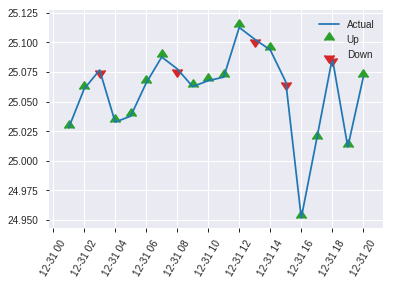


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.1935411835190541
RMSE: 0.43993315801273053
LogLoss: 0.5672467407062131
Null degrees of freedom: 518
Residual degrees of freedom: 463
Null deviance: 720.959908525584
Residual deviance: 588.8021168530491
AIC: 700.8021168530491
AUC: 0.769331926654581
pr_auc: 0.7518051511222598
Gini: 0.5386638533091621
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.42491225659189574: 


,0,1,Error,Rate
0,142.0,111.0,0.4387,(111.0/253.0)
1,40.0,226.0,0.1504,(40.0/266.0)
Total,182.0,337.0,0.2909,(151.0/519.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4249123,0.7495854,247.0
max f2,0.1339410,0.8608414,366.0
max f0point5,0.6075947,0.7262104,166.0
max accuracy,0.5625704,0.7129094,191.0
max precision,0.9452038,1.0,0.0
max recall,0.1339410,1.0,366.0
max specificity,0.9452038,1.0,0.0
max absolute_mcc,0.4249123,0.4304025,247.0
max min_per_class_accuracy,0.5633097,0.7075099,190.0
max mean_per_class_accuracy,0.5625704,0.7127775,191.0


Gains/Lift Table: Avg response rate: 51.25 %, avg score: 52.80 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0115607,0.9224840,1.9511278,1.9511278,1.0,0.9350118,1.0,0.9350118,0.0225564,0.0225564,95.1127820,95.1127820
,2,0.0211946,0.8938709,1.9511278,1.9511278,1.0,0.9059352,1.0,0.9217952,0.0187970,0.0413534,95.1127820,95.1127820
,3,0.0308285,0.8677969,1.1706767,1.7072368,0.6,0.8775272,0.875,0.9079614,0.0112782,0.0526316,17.0676692,70.7236842
,4,0.0404624,0.8513823,1.5609023,1.6723953,0.8,0.8600720,0.8571429,0.8965592,0.0150376,0.0676692,56.0902256,67.2395274
,5,0.0500963,0.8409233,1.9511278,1.7259977,1.0,0.8455791,0.8846154,0.8867553,0.0187970,0.0864662,95.1127820,72.5997687
,6,0.1001927,0.8067005,1.5759109,1.6509543,0.8076923,0.8236178,0.8461538,0.8551866,0.0789474,0.1654135,57.5910931,65.0954309
,7,0.1502890,0.7777070,1.4258242,1.5759109,0.7307692,0.7948258,0.8076923,0.8350663,0.0714286,0.2368421,42.5824176,57.5910931
,8,0.2003854,0.7552014,1.2757374,1.5008676,0.6538462,0.7666527,0.7692308,0.8179629,0.0639098,0.3007519,27.5737420,50.0867553
,9,0.3005780,0.7156339,1.4258242,1.4758531,0.7307692,0.7332767,0.7564103,0.7897342,0.1428571,0.4436090,42.5824176,47.5853094
,10,0.4007707,0.6372069,1.2757374,1.4258242,0.6538462,0.6762102,0.7307692,0.7613532,0.1278195,0.5714286,27.5737420,42.5824176


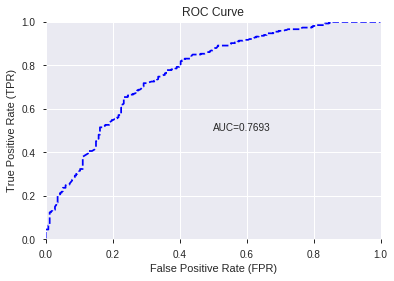

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


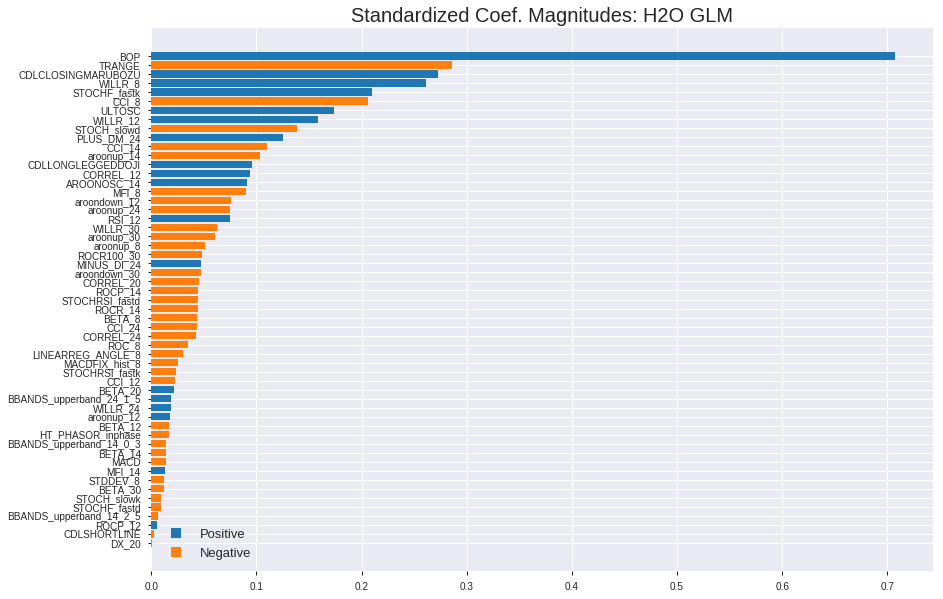

'log_likelihood'
--2019-08-25 14:53:41--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.184.131
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.184.131|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


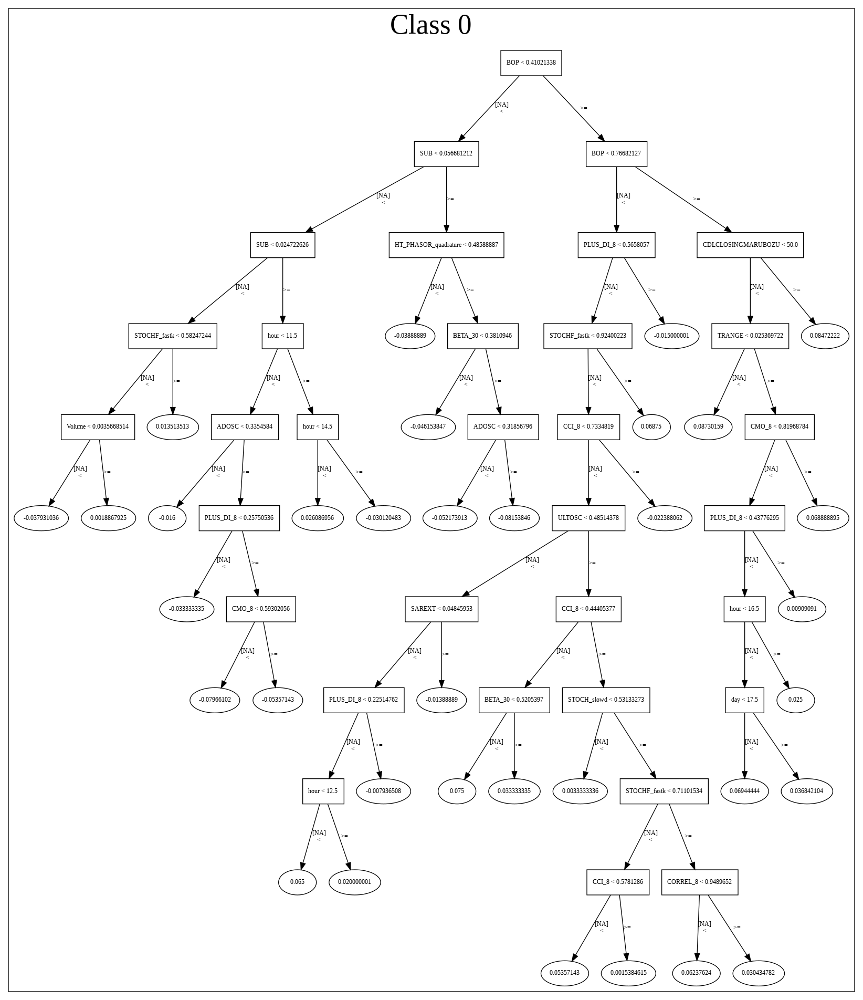

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190825_145331_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190825_145331_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_106_sid_9d08',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_106

['BOP',
 'TRANGE',
 'CDLCLOSINGMARUBOZU',
 'WILLR_8',
 'STOCHF_fastk',
 'CCI_8',
 'ULTOSC',
 'WILLR_12',
 'STOCH_slowd',
 'PLUS_DM_24',
 'CCI_14',
 'aroonup_14',
 'CDLLONGLEGGEDDOJI',
 'CORREL_12',
 'AROONOSC_14',
 'MFI_8',
 'aroondown_12',
 'aroonup_24',
 'RSI_12',
 'WILLR_30',
 'aroonup_30',
 'aroonup_8',
 'ROCR100_30',
 'MINUS_DI_24',
 'aroondown_30',
 'CORREL_20',
 'ROCP_14',
 'STOCHRSI_fastd',
 'ROCR_14',
 'BETA_8',
 'CCI_24',
 'CORREL_24',
 'ROC_8',
 'LINEARREG_ANGLE_8',
 'MACDFIX_hist_8',
 'STOCHRSI_fastk',
 'CCI_12',
 'BETA_20',
 'BBANDS_upperband_24_1_5',
 'WILLR_24',
 'aroonup_12',
 'BETA_12',
 'HT_PHASOR_inphase',
 'BBANDS_upperband_14_0_3',
 'BETA_14',
 'MACD',
 'MFI_14',
 'STDDEV_8',
 'BETA_30',
 'STOCH_slowk',
 'STOCHF_fastd',
 'BBANDS_upperband_14_2_5',
 'ROCP_12',
 'CDLSHORTLINE',
 'DX_20']

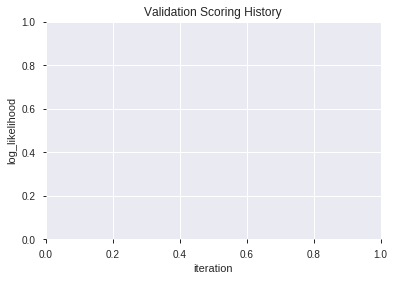

In [52]:
# GLM with recursive feature elimination with cross validation
model_train(feature_name='RFE',model_algo="GLM",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20190825_145438_model_4,0.791517,0.554265,0.315960,0.432475,0.187034
1,XGBoost_2_AutoML_20190825_145438,0.790982,0.555440,0.294749,0.432995,0.187485
2,XGBoost_grid_1_AutoML_20190825_145438_model_6,0.787208,0.556378,0.297305,0.433882,0.188254
3,XGBoost_grid_1_AutoML_20190825_145438_model_7,0.785781,0.560315,0.288144,0.435232,0.189427
4,XGBoost_3_AutoML_20190825_145438,0.784741,0.559979,0.288530,0.435360,0.189538
5,XGBoost_grid_1_AutoML_20190825_145438_model_2,0.782772,0.564132,0.271851,0.436649,0.190662
6,XGBoost_grid_1_AutoML_20190825_145438_model_3,0.782765,0.563178,0.313887,0.436726,0.190730
7,XGBoost_1_AutoML_20190825_145438,0.780736,0.567776,0.327528,0.438318,0.192122
8,XGBoost_grid_1_AutoML_20190825_145438_model_1,0.772854,0.568483,0.299571,0.438703,0.192460
9,XGBoost_grid_1_AutoML_20190825_145438_model_5,0.772170,0.575136,0.299088,0.442262,0.195596


,variable,relative_importance,scaled_importance,percentage
0,BOP,5159.908691,1.000000,0.448240
1,TRANGE,744.391663,0.144265,0.064665
2,STOCHF_fastk,440.613647,0.085392,0.038276
3,CCI_8,322.071899,0.062418,0.027978
4,CDLCLOSINGMARUBOZU,303.089417,0.058739,0.026329
5,ULTOSC,264.011871,0.051166,0.022935
6,MFI_8,197.741364,0.038323,0.017178
7,ROC_8,167.126648,0.032389,0.014518
8,aroonup_30,158.505554,0.030719,0.013769
9,CORREL_12,154.535324,0.029949,0.013424


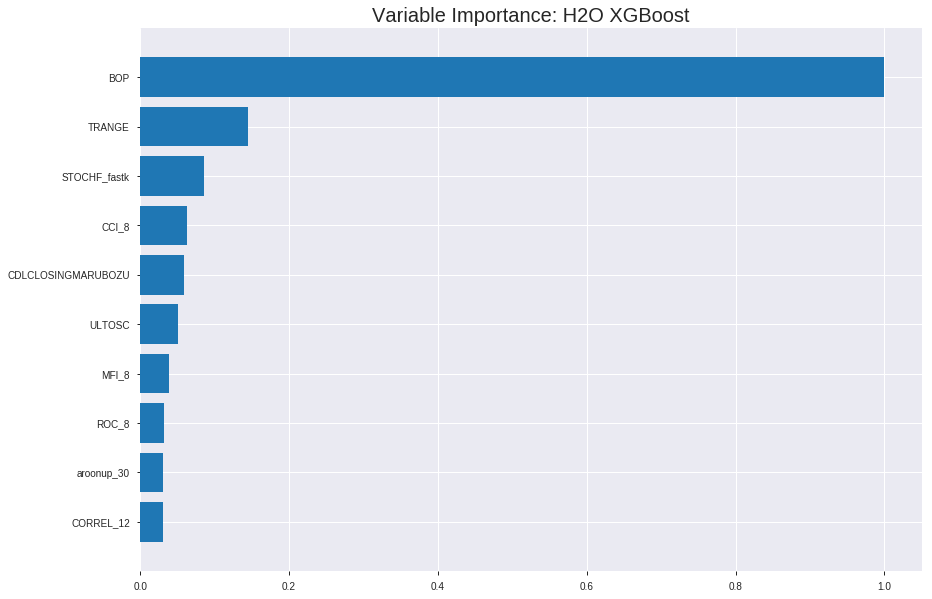

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20190825_145438_model_4


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.16624607699615357
RMSE: 0.407732850033148
LogLoss: 0.5056808457137054
Mean Per-Class Error: 0.2448192681114445
AUC: 0.8405810940011482
pr_auc: 0.8571681685219018
Gini: 0.6811621880022964
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4140957262780931: 


,0,1,Error,Rate
0,957.0,705.0,0.4242,(705.0/1662.0)
1,219.0,1747.0,0.1114,(219.0/1966.0)
Total,1176.0,2452.0,0.2547,(924.0/3628.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4140957,0.7908556,255.0
max f2,0.2995316,0.8801341,308.0
max f0point5,0.6729104,0.7886782,129.0
max accuracy,0.5676172,0.7535832,182.0
max precision,0.9265715,1.0,0.0
max recall,0.1274869,1.0,383.0
max specificity,0.9265715,1.0,0.0
max absolute_mcc,0.6046366,0.5093257,165.0
max min_per_class_accuracy,0.5676172,0.7522889,182.0
max mean_per_class_accuracy,0.6046366,0.7551807,165.0


Gains/Lift Table: Avg response rate: 54.19 %, avg score: 54.06 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101985,0.9057042,1.8453713,1.8453713,1.0,0.9116536,1.0,0.9116536,0.0188199,0.0188199,84.5371312,84.5371312
,2,0.0201213,0.8976698,1.8453713,1.8453713,1.0,0.9014250,1.0,0.9066094,0.0183113,0.0371312,84.5371312,84.5371312
,3,0.0300441,0.8889996,1.7941110,1.8284413,0.9722222,0.8935662,0.9908257,0.9023015,0.0178026,0.0549339,79.4110998,82.8441300
,4,0.0402426,0.8804371,1.6957466,1.7948132,0.9189189,0.8850969,0.9726027,0.8979415,0.0172940,0.0722279,69.5746611,79.4813194
,5,0.0501654,0.8713615,1.7428507,1.7845349,0.9444444,0.8760186,0.9670330,0.8936051,0.0172940,0.0895219,74.2850684,78.4534895
,6,0.1000551,0.8268964,1.7332217,1.7589490,0.9392265,0.8487446,0.9531680,0.8712366,0.0864700,0.1759919,73.3221675,75.8948964
,7,0.1502205,0.7904443,1.6932803,1.7370192,0.9175824,0.8080305,0.9412844,0.8501292,0.0849440,0.2609359,69.3280270,73.7019235
,8,0.2001103,0.7617300,1.6516583,1.7157378,0.8950276,0.7756689,0.9297521,0.8315654,0.0824008,0.3433367,65.1658302,71.5737790
,9,0.3001654,0.7080798,1.4945983,1.6420246,0.8099174,0.7355389,0.8898072,0.7995566,0.1495422,0.4928789,49.4598253,64.2024611
,10,0.3999449,0.6497031,1.2846231,1.5528590,0.6961326,0.6800519,0.8414886,0.7697422,0.1281790,0.6210580,28.4623123,55.2858975




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.19011549831628866
RMSE: 0.43602235988110594
LogLoss: 0.5632523642719821
Mean Per-Class Error: 0.2732461045254604
AUC: 0.7851692387981809
pr_auc: 0.7613434878585589
Gini: 0.5703384775963618
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.40014493465423584: 


,0,1,Error,Rate
0,289.0,237.0,0.4506,(237.0/526.0)
1,71.0,439.0,0.1392,(71.0/510.0)
Total,360.0,676.0,0.2973,(308.0/1036.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4001449,0.7403035,250.0
max f2,0.2984282,0.8395193,296.0
max f0point5,0.5867990,0.7250203,172.0
max accuracy,0.5737870,0.7268340,179.0
max precision,0.9332156,1.0,0.0
max recall,0.0988417,1.0,394.0
max specificity,0.9332156,1.0,0.0
max absolute_mcc,0.5688942,0.4535222,182.0
max min_per_class_accuracy,0.5673705,0.7235294,183.0
max mean_per_class_accuracy,0.5688942,0.7267539,182.0


Gains/Lift Table: Avg response rate: 49.23 %, avg score: 51.67 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0106178,0.8959862,2.0313725,2.0313725,1.0,0.9094954,1.0,0.9094954,0.0215686,0.0215686,103.1372549,103.1372549
,2,0.0202703,0.8815639,1.8282353,1.9346405,0.9,0.8876718,0.9523810,0.8991032,0.0176471,0.0392157,82.8235294,93.4640523
,3,0.0308880,0.8724056,1.8467023,1.9044118,0.9090909,0.8776089,0.9375,0.8917145,0.0196078,0.0588235,84.6702317,90.4411765
,4,0.0405405,0.8541183,1.6250980,1.8379085,0.8,0.8606863,0.9047619,0.8843269,0.0156863,0.0745098,62.5098039,83.7908497
,5,0.0501931,0.8340463,1.2188235,1.7188537,0.6,0.8418102,0.8461538,0.8761506,0.0117647,0.0862745,21.8823529,71.8853695
,6,0.1003861,0.7969830,1.6016591,1.6602564,0.7884615,0.8170728,0.8173077,0.8466117,0.0803922,0.1666667,60.1659125,66.0256410
,7,0.1505792,0.7633432,1.7969834,1.7058321,0.8846154,0.7790853,0.8397436,0.8241029,0.0901961,0.2568627,79.6983409,70.5832076
,8,0.2007722,0.7395586,1.6407240,1.6895551,0.8076923,0.7515739,0.8317308,0.8059706,0.0823529,0.3392157,64.0723982,68.9555053
,9,0.3001931,0.6872809,1.4199886,1.6002774,0.6990291,0.7137664,0.7877814,0.7754335,0.1411765,0.4803922,41.9988578,60.0277410
,10,0.4005792,0.6275890,1.2696078,1.5174108,0.625,0.6559349,0.7469880,0.7454869,0.1274510,0.6078431,26.9607843,51.7410820



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-25 14:54:51,4.879 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4581036,0.5,0.6931472,0.5,0.0,1.0,0.5077220
,2019-08-25 14:54:51,4.982 sec,5.0,0.4753379,0.6447230,0.7959404,0.7041636,1.7118764,0.2877619,0.4783811,0.6506005,0.7687915,0.6704471,1.7951664,0.3079151
,2019-08-25 14:54:51,5.059 sec,10.0,0.4584252,0.6118505,0.8018304,0.7542527,1.7368201,0.2863837,0.4639121,0.6223244,0.7777641,0.7066920,1.8056645,0.3166023
,2019-08-25 14:54:51,5.161 sec,15.0,0.4468423,0.5889709,0.8064167,0.8189730,1.8003623,0.2797685,0.4545018,0.6036195,0.7811806,0.7403285,1.8620915,0.2799228
,2019-08-25 14:54:51,5.244 sec,20.0,0.4387914,0.5725679,0.8097160,0.8248626,1.7954964,0.2783903,0.4485356,0.5913774,0.7823921,0.7482881,1.6620321,0.3021236
,2019-08-25 14:54:51,5.428 sec,25.0,0.4328411,0.5600474,0.8126759,0.8286412,1.7954964,0.2737045,0.4445252,0.5827972,0.7840043,0.7532003,1.8620915,0.3040541
,2019-08-25 14:54:52,5.528 sec,30.0,0.4284078,0.5504743,0.8162118,0.8310153,1.7954964,0.2759096,0.4424190,0.5780603,0.7831563,0.7543295,1.8620915,0.3059846
,2019-08-25 14:54:52,5.620 sec,35.0,0.4247229,0.5424011,0.8193123,0.8340144,1.8453713,0.2761852,0.4400292,0.5728406,0.7850462,0.7527128,1.6620321,0.3069498
,2019-08-25 14:54:52,5.722 sec,40.0,0.4217148,0.5356592,0.8218274,0.8379171,1.8453713,0.2750827,0.4383612,0.5691984,0.7860546,0.7576300,1.8467023,0.3117761
,2019-08-25 14:54:52,5.817 sec,45.0,0.4189769,0.5297281,0.8253616,0.8412839,1.8453713,0.2800441,0.4376762,0.5675278,0.7863491,0.7593496,1.8467023,0.3069498


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,5159.9086914,1.0,0.4482397
TRANGE,744.3916626,0.1442645,0.0646651
STOCHF_fastk,440.6136475,0.0853918,0.0382760
CCI_8,322.0718994,0.0624181,0.0279783
CDLCLOSINGMARUBOZU,303.0894165,0.0587393,0.0263293
---,---,---,---
CDLSHORTLINE,24.2752762,0.0047046,0.0021088
BBANDS_upperband_14_2_5,24.0924072,0.0046692,0.0020929
aroondown_12,19.6682281,0.0038117,0.0017086
MACD,18.3955441,0.0035651,0.0015980



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.720616570327553)

('F1', 0.7511591962905719)

('auc', 0.7915168355671788)

('logloss', 0.5542650602572714)

('mean_per_class_error', 0.2788344378733394)

('rmse', 0.43247475964524523)

('mse', 0.18703441773021262)

xgboost prediction progress: |████████████████████████████████████████████| 100%


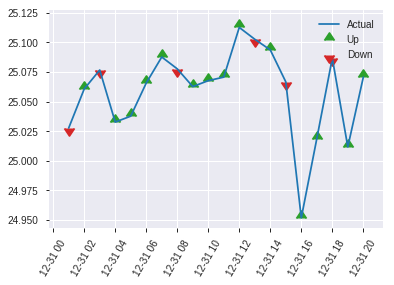


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.18703441773021262
RMSE: 0.43247475964524523
LogLoss: 0.5542650602572714
Mean Per-Class Error: 0.2788344378733394
AUC: 0.7915168355671788
pr_auc: 0.7814190326519382
Gini: 0.5830336711343576
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.31212303042411804: 


,0,1,Error,Rate
0,115.0,138.0,0.5455,(138.0/253.0)
1,23.0,243.0,0.0865,(23.0/266.0)
Total,138.0,381.0,0.3102,(161.0/519.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3121230,0.7511592,285.0
max f2,0.2082297,0.8592201,340.0
max f0point5,0.5834426,0.7322835,177.0
max accuracy,0.5834426,0.7206166,177.0
max precision,0.9054072,1.0,0.0
max recall,0.1251630,1.0,386.0
max specificity,0.9054072,1.0,0.0
max absolute_mcc,0.5098250,0.4434463,217.0
max min_per_class_accuracy,0.5680054,0.7114625,185.0
max mean_per_class_accuracy,0.5834426,0.7211656,177.0


Gains/Lift Table: Avg response rate: 51.25 %, avg score: 51.76 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0115607,0.8947155,1.6259398,1.6259398,0.8333333,0.8993757,0.8333333,0.8993757,0.0187970,0.0187970,62.5939850,62.5939850
,2,0.0211946,0.8789767,1.9511278,1.7737526,1.0,0.8887025,0.9090909,0.8945243,0.0187970,0.0375940,95.1127820,77.3752563
,3,0.0308285,0.8579388,1.9511278,1.8291823,1.0,0.8682227,0.9375,0.8863050,0.0187970,0.0563910,95.1127820,82.9182331
,4,0.0404624,0.8520621,1.9511278,1.8582170,1.0,0.8545537,0.9523810,0.8787452,0.0187970,0.0751880,95.1127820,85.8216971
,5,0.0500963,0.8374208,1.9511278,1.8760844,1.0,0.8465024,0.9615385,0.8725447,0.0187970,0.0939850,95.1127820,87.6084442
,6,0.1001927,0.7878139,1.7259977,1.8010411,0.8846154,0.8089654,0.9230769,0.8407550,0.0864662,0.1804511,72.5997687,80.1041064
,7,0.1502890,0.7644660,1.6509543,1.7510121,0.8461538,0.7776567,0.8974359,0.8197223,0.0827068,0.2631579,65.0954309,75.1012146
,8,0.2003854,0.7411525,1.5008676,1.6884760,0.7692308,0.7512854,0.8653846,0.8026130,0.0751880,0.3383459,50.0867553,68.8475998
,9,0.3005780,0.6871873,1.3132591,1.5634037,0.6730769,0.7131314,0.8012821,0.7727858,0.1315789,0.4699248,31.3259109,56.3403702
,10,0.4007707,0.6232557,1.2757374,1.4914871,0.6538462,0.6546882,0.7644231,0.7432614,0.1278195,0.5977444,27.5737420,49.1487131


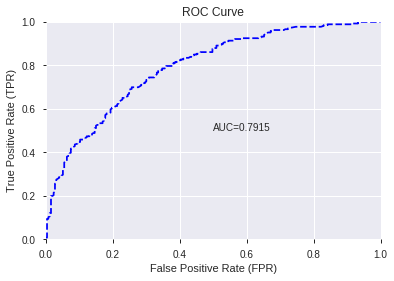

This function is available for GLM models only


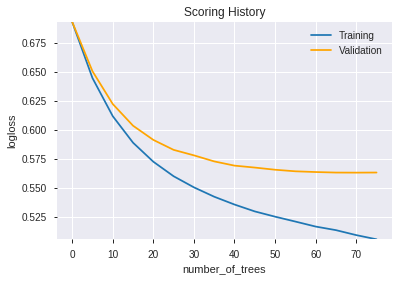

--2019-08-25 14:55:12--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.217.38.12
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.217.38.12|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
log4j:WARN No appenders could be found for logger (ml.dmlc.xgboost4j.java.Booster).
log4j:WARN Please initialize the log4j system properly.
log4j:WARN See http://logging.apache.org/log4j/1.2/faq.html#noconfig for more info.
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.ge

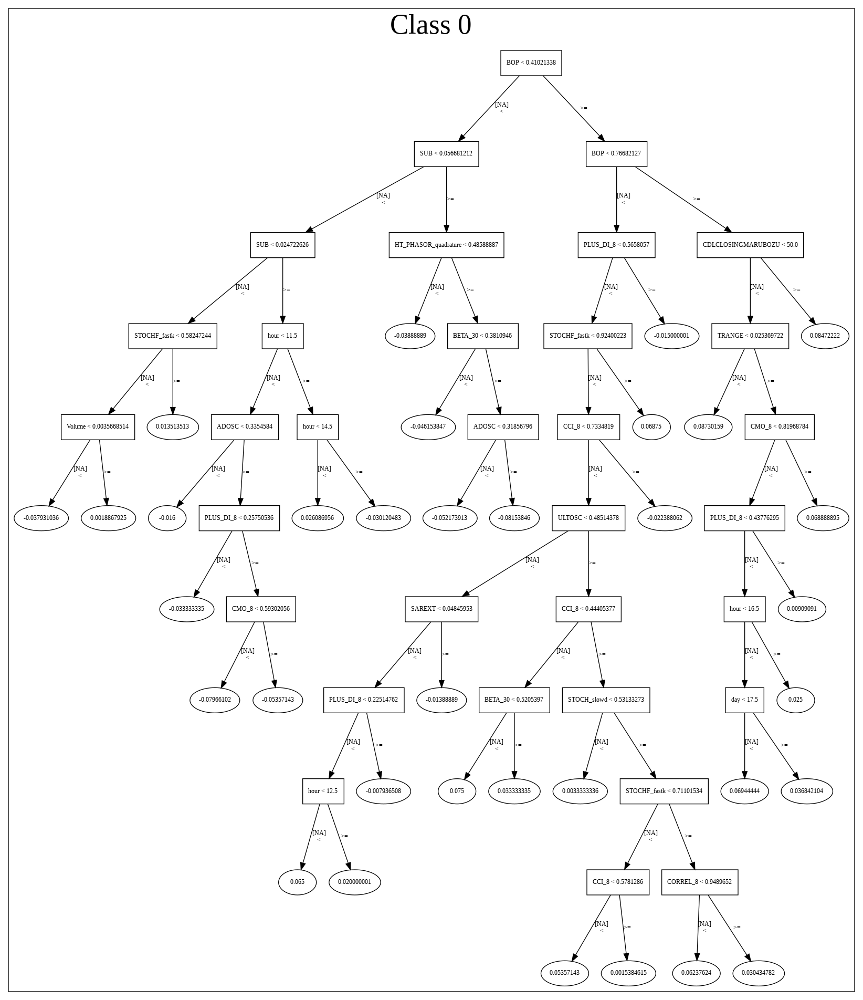

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20190825_145438_model_4',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20190825_145438_model_4',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_114_sid_9d08',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_trainin

['BOP',
 'TRANGE',
 'STOCHF_fastk',
 'CCI_8',
 'CDLCLOSINGMARUBOZU',
 'ULTOSC',
 'MFI_8',
 'ROC_8',
 'aroonup_30',
 'CORREL_12',
 'PLUS_DM_24',
 'STOCH_slowd',
 'STOCH_slowk',
 'aroonup_8',
 'aroonup_24',
 'CORREL_20',
 'MINUS_DI_24',
 'CCI_24',
 'MACDFIX_hist_8',
 'aroondown_30',
 'WILLR_8',
 'WILLR_12',
 'BETA_20',
 'BETA_30',
 'ROCR100_30',
 'STDDEV_8',
 'MFI_14',
 'CORREL_24',
 'aroonup_12',
 'STOCHRSI_fastd',
 'DX_20',
 'BETA_14',
 'BETA_8',
 'ROCP_12',
 'WILLR_24',
 'CCI_12',
 'BBANDS_upperband_14_0_3',
 'BETA_12',
 'ROCP_14',
 'aroonup_14',
 'WILLR_30',
 'BBANDS_upperband_24_1_5',
 'LINEARREG_ANGLE_8',
 'STOCHRSI_fastk',
 'HT_PHASOR_inphase',
 'CCI_14',
 'RSI_12',
 'AROONOSC_14',
 'CDLSHORTLINE',
 'BBANDS_upperband_14_2_5',
 'aroondown_12',
 'MACD',
 'CDLLONGLEGGEDDOJI']

In [53]:
# XGBoost with recursive feature elimination with cross validation
model_train(feature_name='RFE',model_algo="XGBoost",features_list=features_list)

In [54]:
# Experiment Summary
pd.set_option('precision', 3) 

for k in models_summary:
  print(k)
  display(models_summary[k].max())
  print('\n'*3)
  display(models_summary[k].groupby(models_summary[k].index).max())
  print('\n'*3)
  
display(models_summary)

pd.set_option('precision', 6) 

accuracy


DeepLearning    0.748
GLM             0.730
XGBoost         0.736
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.717,0.721,0.736
DLF,0.740,0.730,0.734
Fwe,0.734,0.724,0.726
RFE,0.730,0.713,0.721
XGBF,0.748,0.730,0.734






F1


DeepLearning    0.763
GLM             0.761
XGBoost         0.762
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.734,0.749,0.760
DLF,0.752,0.761,0.762
Fwe,0.753,0.754,0.761
RFE,0.755,0.750,0.751
XGBF,0.763,0.761,0.762






auc


DeepLearning    0.793
GLM             0.785
XGBoost         0.805
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.771,0.783,0.794
DLF,0.793,0.785,0.805
Fwe,0.791,0.782,0.793
RFE,0.768,0.769,0.792
XGBF,0.788,0.785,0.805






logloss


DeepLearning    0.615
GLM             0.567
XGBoost         0.558
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.615,0.563,0.558
DLF,0.561,0.565,0.540
Fwe,0.568,0.564,0.551
RFE,0.570,0.567,0.554
XGBF,0.568,0.565,0.540






mean_per_class_error


DeepLearning    0.283
GLM             0.287
XGBoost         0.279
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.283,0.280,0.265
DLF,0.260,0.272,0.266
Fwe,0.264,0.276,0.273
RFE,0.271,0.287,0.279
XGBF,0.254,0.272,0.266






rmse


DeepLearning    0.464
GLM             0.440
XGBoost         0.434
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.464,0.437,0.434
DLF,0.435,0.437,0.426
Fwe,0.440,0.438,0.431
RFE,0.441,0.440,0.432
XGBF,0.440,0.437,0.426






mse


DeepLearning    0.215
GLM             0.194
XGBoost         0.189
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.215,0.191,0.189
DLF,0.190,0.191,0.181
Fwe,0.193,0.191,0.186
RFE,0.194,0.194,0.187
XGBF,0.193,0.191,0.181


{'F1':       DeepLearning    GLM  XGBoost
 All          0.734    NaN      NaN
 DLF          0.752    NaN      NaN
 DLF            NaN  0.761      NaN
 DLF            NaN    NaN    0.762
 All            NaN  0.749      NaN
 All            NaN    NaN    0.760
 XGBF         0.763    NaN      NaN
 XGBF           NaN  0.761      NaN
 XGBF           NaN    NaN    0.762
 Fwe          0.753    NaN      NaN
 Fwe            NaN  0.754      NaN
 Fwe            NaN    NaN    0.761
 RFE          0.755    NaN      NaN
 RFE            NaN  0.750      NaN
 RFE            NaN    NaN    0.751,
 'accuracy':       DeepLearning    GLM  XGBoost
 All          0.717    NaN      NaN
 DLF          0.740    NaN      NaN
 DLF            NaN  0.730      NaN
 DLF            NaN    NaN    0.734
 All            NaN  0.721      NaN
 All            NaN    NaN    0.736
 XGBF         0.748    NaN      NaN
 XGBF           NaN  0.730      NaN
 XGBF           NaN    NaN    0.734
 Fwe          0.734    NaN      NaN
 Fwe     